### Imports

In [10]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
np.random.seed(42)
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score  
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from pathlib import Path
import os
import datetime
import time
from collections import OrderedDict
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import adfuller, kpss, bds
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import het_arch
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import skewtest, kurtosistest, skew, kurtosis, boxcox
import optuna
from darts import TimeSeries
from darts.utils import statistics
from darts.metrics import mape, mae, rmse, smape
import random
import sys
random.seed(42)
import os
from tqdm import tqdm

base_dir = Path(os.getcwd()).resolve().parent
data_dir = base_dir / "data"
base_dir

WindowsPath('C:/Users/diogo/Desktop/EuroMillions')

In [12]:
optuna_storage_path = "optuna_journal_storage.log"
lock_obj = optuna.storages.journal.JournalFileOpenLock(optuna_storage_path)
storage = optuna.storages.JournalStorage(
    optuna.storages.journal.JournalFileBackend(optuna_storage_path, lock_obj=lock_obj)
)

## 1.Leitura dos Dados

In [13]:
import logging
cmdstanpy_logger = logging.getLogger("cmdstanpy")
cmdstanpy_logger.disabled = True

In [14]:
data_qtd = 200

# Leitura do ficheiro csv
nome_ficheiro = "euromilhoesTeste.csv"
caminho_completo = os.path.join(data_dir, nome_ficheiro)
df = pd.read_csv(caminho_completo).tail(data_qtd)
df.drop(columns=["prizes","last_prize", "has_winner"], inplace=True)
df['date'] = pd.to_datetime(df['date'], format="%Y-%m-%d")
df.set_index('date', inplace=True)
df

,N1,N2,N3,N4,N5,E1,E2
date,,,,,,,
2023-09-26,2,6,14,19,23,5,7
2023-09-29,9,11,13,21,32,2,7
2023-10-03,6,20,22,24,45,4,5
2023-10-06,21,29,31,34,43,2,9
2023-10-10,18,20,22,33,43,3,9
...,...,...,...,...,...,...,...
2025-08-08,2,12,19,34,44,6,10
2025-08-12,18,28,42,46,48,3,9
2025-08-15,13,30,35,36,40,2,6


## 2. Aplicação dos modelos e comparação dos packages

### 2.1. PyTorch

In [15]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score

In [16]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)       # Para GPUs CUDA
    torch.cuda.manual_seed_all(seed)   # Se estiveres a usar várias GPUs
    np.random.seed(seed)                # Seed para numpy
    random.seed(seed)                   # Seed para a biblioteca random do Python
    torch.backends.cudnn.deterministic = True  # Garante resultados determinísticos no cuDNN
    torch.backends.cudnn.benchmark = False     # Desativa otimizações que podem variar resultados

# Exemplo de uso
set_seed(42)

In [17]:
!nvidia-smi

Wed Aug 27 23:36:06 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 581.08                 Driver Version: 581.08         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   45C    P8              2W /   65W |     581MiB /   8188MiB |     15%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [171]:
!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu129

Looking in indexes: https://download.pytorch.org/whl/cu129


In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.nn.functional as F

In [10]:
# Criar diretório para salvar modelos se não existir
os.makedirs('modelos_pytorch', exist_ok=True)

# Configuração inicial
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)
    device = torch.device('cuda')
    print("✅ GPU disponível:", torch.cuda.get_device_name(0))
else:
    device = torch.device('cpu')
    print("⚠️ A usar CPU")

✅ GPU disponível: NVIDIA GeForce RTX 4060 Laptop GPU


In [174]:
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    # Evitar divisão por zero
    denominator = np.where(denominator == 0, 1, denominator)
    return np.mean(numerator / denominator) * 100


class TemporalCNN(nn.Module):
    def __init__(self, seq_length, usar_hibrido=False):
        super(TemporalCNN, self).__init__()
        self.usar_hibrido = usar_hibrido

        # CNNs alinhadas com Keras
        self.conv1 = nn.Conv1d(1, 128, kernel_size=7, padding='same')
        self.bn1 = nn.BatchNorm1d(128)
        self.leaky1 = nn.LeakyReLU(0.01)
        self.drop1 = nn.Dropout(0.1)

        self.conv2 = nn.Conv1d(128, 64, kernel_size=5, padding='same')
        self.bn2 = nn.BatchNorm1d(64)
        self.leaky2 = nn.LeakyReLU(0.01)
        self.drop2 = nn.Dropout(0.1)

        self.conv3 = nn.Conv1d(64, 32, kernel_size=3, padding='same')
        self.bn3 = nn.BatchNorm1d(32)
        self.leaky3 = nn.LeakyReLU(0.01)
        self.drop3 = nn.Dropout(0.1)

        if usar_hibrido:
            # Híbrido com Bidirectional LSTM
            self.lstm1 = nn.LSTM(32, 64, batch_first=True, bidirectional=True, dropout=0.1)
            self.lstm2 = nn.LSTM(128, 32, batch_first=True, bidirectional=True, dropout=0.1)
            self.drop_lstm = nn.Dropout(0.1)
            self.fc1 = nn.Linear(64, 64)  # 32*2 -> 64
        else:
            self.global_pool = nn.AdaptiveMaxPool1d(1)
            self.fc1 = nn.Linear(32, 64)

        self.drop_fc = nn.Dropout(0.1)
        self.fc2 = nn.Linear(64, 1)

        # Inicialização dos pesos
        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv1d) or isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='leaky_relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.LSTM):
                for name, param in m.named_parameters():
                    if 'weight_ih' in name:
                        nn.init.xavier_uniform_(param.data)
                    elif 'weight_hh' in name:
                        nn.init.orthogonal_(param.data)
                    elif 'bias' in name:
                        nn.init.constant_(param.data, 0)
                        # Gate forget bias
                        n = param.size(0)
                        param.data[n//4:n//2].fill_(1)

    def forward(self, x):
        # (batch, seq_length, 1) -> (batch, 1, seq_length)
        x = x.permute(0, 2, 1)

        x = self.drop1(self.leaky1(self.bn1(self.conv1(x))))
        x = self.drop2(self.leaky2(self.bn2(self.conv2(x))))
        x = self.drop3(self.leaky3(self.bn3(self.conv3(x))))

        if self.usar_hibrido:
            x = x.permute(0, 2, 1)  # Para LSTM: (batch, seq_len, features)
            x, _ = self.lstm1(x)
            x, _ = self.lstm2(x)
            x = self.drop_lstm(x)
            x = x[:, -1, :]  # último passo de tempo
        else:
            x = self.global_pool(x).squeeze(-1)

        x = self.drop_fc(F.relu(self.fc1(x)))
        return self.fc2(x)

In [175]:
import os

class EarlyStopping:
    def __init__(self, patience=10, restore_best_weights=True):
        self.patience = patience
        self.restore_best_weights = restore_best_weights
        self.best_loss = float('inf')
        self.counter = 0
        self.best_state = None
        self.early_stop = False

    def __call__(self, val_loss, model):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0
            if self.restore_best_weights:
                self.best_state = model.state_dict()
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                if self.restore_best_weights and self.best_state is not None:
                    model.load_state_dict(self.best_state)

class ModelCheckpoint:
    def __init__(self, filepath, save_best_only=True):
        self.filepath = filepath
        self.save_best_only = save_best_only
        self.best_loss = float('inf')

        dirname = os.path.dirname(filepath)
        if dirname != "":
            os.makedirs(dirname, exist_ok=True)

    def __call__(self, val_loss, model):
        if self.save_best_only:
            if val_loss < self.best_loss:
                self.best_loss = val_loss
                torch.save(model.state_dict(), self.filepath)
        else:
            torch.save(model.state_dict(), self.filepath)

In [176]:
if not os.path.exists("modelos_pytorch"):
    os.makedirs("modelos_pytorch")

#### 2.1.1. Janela Fixa (Fixed Window)

In [177]:
# Dispositivo (CPU ou GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Funções de preparação de dados (iguais às do TensorFlow)
def criar_janelas(serie, seq_length):
    X, y = [], []
    for i in range(len(serie) - seq_length):
        X.append(serie[i:i+seq_length])
        y.append(serie[i+seq_length])
    return np.array(X), np.array(y)

def preparar_dados(serie, seq_length=30):
    if not hasattr(serie, 'index') or not isinstance(serie.index, pd.DatetimeIndex):
        raise ValueError("❌ A série deve ter um índice datetime.")
    
    serie = serie.dropna()
    if len(serie) < seq_length + 30:
        raise ValueError(f"❌ Série muito curta: {len(serie)} pontos. Mínimo necessário: {seq_length + 30}")
    
    scaler = MinMaxScaler()
    serie_scaled = scaler.fit_transform(serie.values.reshape(-1, 1)).flatten()

    X, y = criar_janelas(serie_scaled, seq_length)

    n = len(X)
    train_end = int(0.8 * n)
    val_end = train_end + int(0.1 * n)

    X_train = torch.FloatTensor(X[:train_end]).unsqueeze(-1).to(device)
    y_train = torch.FloatTensor(y[:train_end]).to(device)
    
    X_val = torch.FloatTensor(X[train_end:val_end]).unsqueeze(-1).to(device)
    y_val = torch.FloatTensor(y[train_end:val_end]).to(device)
    
    X_test = torch.FloatTensor(X[val_end:]).unsqueeze(-1).to(device)
    y_test = torch.FloatTensor(y[val_end:]).to(device)

    return X_train, X_val, X_test, y_train, y_val, y_test, scaler, serie_scaled

# Visualização (igual ao TensorFlow)
def visualizar_serie_original(serie, titulo):
    plt.figure(figsize=(14, 5))
    plt.plot(serie.index, serie.values, label='Série Original', color='steelblue')
    plt.title(f'Série Temporal - {titulo}')
    plt.xlabel("Data")
    plt.ylabel("Valor")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

def visualizar_resultados(serie, y_val_inv, y_val_pred_inv, y_test_inv, y_test_pred_inv, seq_length, serie_name):
    plt.figure(figsize=(14, 6))
    indices = serie.index

    # Índices de início
    n_total = len(serie) - seq_length - 2
    idx_val = int(0.8 * n_total)
    idx_test = int(0.9 * n_total)

    # Construção das previsões
    previsao_val = np.full_like(serie.values, fill_value=np.nan, dtype=np.float32)
    previsao_test = np.full_like(serie.values, fill_value=np.nan, dtype=np.float32)

    # Insere previsões após o final do treino
    val_start_idx = seq_length + idx_val
    val_end_idx = val_start_idx + len(y_val_pred_inv)
    test_start_idx = seq_length + idx_test
    test_end_idx = test_start_idx + len(y_test_pred_inv)

    # Garante que as previsões não ultrapassem o tamanho da série
    val_end_idx = min(val_end_idx, len(serie))
    test_end_idx = min(test_end_idx, len(serie))

    # Insere as previsões nas posições corretas
    previsao_val[val_start_idx:val_end_idx] = y_val_pred_inv.flatten()
    previsao_test[test_start_idx:test_end_idx] = y_test_pred_inv.flatten()

    # Linhas principais
    plt.plot(indices, serie.values, label="Série Original", color='steelblue', linewidth=1.5)
    plt.plot(indices, previsao_val, linestyle='--', color='orange', label="Previsão Validação")
    plt.plot(indices, previsao_test, linestyle='--', color='green', label="Previsão Teste")

    # Áreas de fundo (agora corretamente posicionadas após o treino)
    val_start = indices[val_start_idx]
    val_end = indices[val_end_idx]
    test_start = indices[test_start_idx]
    test_end = indices[test_end_idx]

    plt.axvspan(val_start, val_end, color='orange', alpha=0.1)
    plt.axvspan(test_start, test_end, color='green', alpha=0.1)

    # Estética
    plt.title(f"Previsões sobre Série Temporal (Janela Fixa): {serie_name} - (PyTorch)")
    plt.xlabel("Data")
    plt.ylabel("Valor")
    plt.legend(loc='upper left')
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

resultados_modelos = []

def guardar_resultado(nome_serie, tipo_modelo, mae, mse, rmse, mape, r2, duracao, smape_val):
    """Guarda os resultados do modelo para comparação posterior."""
    resultados_modelos.append({
        'Dataset': nome_serie,
        'Modelo': tipo_modelo,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE (%)': mape * 100,
        'SMAPE (%)': smape_val,
        'R²': r2,
        'Tempo (s)': duracao
    })

# Função de avaliação
def avaliar_modelo(model, X_val, y_val, X_test, y_test, scaler, serie, seq_length, serie_name):
    model.eval()
    with torch.no_grad():
        y_val_pred = model(X_val).cpu().numpy()
        y_test_pred = model(X_test).cpu().numpy()
    
    y_val_inv = scaler.inverse_transform(y_val.cpu().numpy().reshape(-1, 1))
    y_val_pred_inv = scaler.inverse_transform(y_val_pred)
    y_test_inv = scaler.inverse_transform(y_test.cpu().numpy().reshape(-1, 1))
    y_test_pred_inv = scaler.inverse_transform(y_test_pred)

    mse = float(mean_squared_error(y_test_inv, y_test_pred_inv))
    mae = float(mean_absolute_error(y_test_inv, y_test_pred_inv))
    rmse = float(np.sqrt(mse))
    mape = float(mean_absolute_percentage_error(y_test_inv, y_test_pred_inv))
    r2 = float(r2_score(y_test_inv, y_test_pred_inv))
    smape_val = float(smape(y_test_inv, y_test_pred_inv))


    print(f"✅ MSE: {mse:.4f} | MAE: {mae:.4f} | RMSE: {rmse:.4f}")
    print(f"✅ MAPE: {mape:.2%} | SMAPE: {smape_val:.2f}% | R²: {r2:.4f}")

    visualizar_resultados(serie, y_val_inv, y_val_pred_inv, y_test_inv, y_test_pred_inv, seq_length, serie_name)
    
    return mse, mae, rmse, mape, r2, smape_val


# Função para plotar evolução das métricas
def plot_evolucao_metricas(train_losses, val_losses, train_maes, val_maes, serie_name):
    plt.figure(figsize=(12, 5))
    # Loss
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.title(f'Evolução da Loss {serie_name}')
    plt.xlabel('Épocas')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.4)

    # MAE
    plt.subplot(1, 2, 2)
    plt.plot(train_maes, label='Train MAE')
    plt.plot(val_maes, label='Val MAE')
    plt.title(f'Evolução do MAE {serie_name}')
    plt.xlabel('Épocas')
    plt.ylabel('MAE')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.4)

    plt.tight_layout()
    plt.show()

def treinar_modelo(
    model,
    X_train,
    y_train,
    X_val,
    y_val,
    epochs=100,
    batch_size=32,
    patience_es=10,
    factor=0.5,
    patience_lr=5,
    min_lr=1e-6,
    model_name="last_model",
    model_path="modelos_pytorch/best_model.pth",
    verbose=True
):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0005)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=factor, patience=patience_lr, min_lr=min_lr)

    train_dataset = TensorDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    early_stopping = EarlyStopping(patience=patience_es, restore_best_weights=True)
    checkpoint = ModelCheckpoint(filepath=model_path, save_best_only=True)

    train_losses, val_losses = [], []
    train_maes, val_maes = [], []
    val_smapes = []

    tempos_por_epoca = []

    start_total = time.time()

    for epoch in range(epochs):
        start_epoca = time.time()

        model.train()
        total_loss = 0
        total_mae = 0

        for batch_x, batch_y in train_loader:
            batch_x = batch_x.to(device)
            batch_y = batch_y.to(device)

            optimizer.zero_grad()
            outputs = model(batch_x).squeeze()
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item() * batch_x.size(0)
            total_mae += torch.mean(torch.abs(outputs - batch_y)).item() * batch_x.size(0)

        avg_train_loss = total_loss / len(train_loader.dataset)
        avg_train_mae = total_mae / len(train_loader.dataset)

        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val).squeeze()
            val_loss = criterion(val_outputs, y_val).item()
            val_mae = torch.mean(torch.abs(val_outputs - y_val)).item()
            val_smape = smape(y_val.cpu().numpy(), val_outputs.cpu().numpy())

        scheduler.step(val_loss)

        train_losses.append(avg_train_loss)
        val_losses.append(val_loss)
        train_maes.append(avg_train_mae)
        val_maes.append(val_mae)
        val_smapes.append(val_smape)

        tempo_epoca = time.time() - start_epoca
        tempos_por_epoca.append(tempo_epoca)

        if verbose:
            print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {val_loss:.6f} | Val MAE: {val_mae:.6f} | Val SMAPE: {val_smape:.2f}% | Tempo: {tempo_epoca:.2f}s")

        early_stopping(val_loss, model)
        checkpoint(val_loss, model)

        if early_stopping.early_stop:
            if verbose:
                print(f"⏸️ Paragem antecipada na época {epoch+1}")
            break

    tempo_total = time.time() - start_total

    if verbose:
        print(f"🕒 Treino finalizado. Tempo total: {tempo_total:.2f}s")

    # Carregar o melhor modelo salvo
    model.load_state_dict(torch.load(model_path))
    model.to(device)

    return model, train_losses, val_losses, train_maes, val_maes, val_smapes, tempos_por_epoca, tempo_total

def treinar_para_serie_pytorch(serie, seq_length=30, usar_hibrido=False, serie_name=None):
    nome_serie = serie.name.replace(" ", "_").replace("/", "_").lower()[:50]
    tipo_modelo = "hibrido" if usar_hibrido else "cnn"
    model_name = f"modelos_pytorch/modelo_{tipo_modelo}_{nome_serie}.pth"
    
    print(f"\n🔄 Treinando modelo PyTorch {tipo_modelo} para: {serie.name}")
    visualizar_serie_original(serie, serie_name)

    try:
        X_train, X_val, X_test, y_train, y_val, y_test, scaler, serie_scaled = preparar_dados(serie, seq_length)
    except ValueError as e:
        print(e)
        return None

    model = TemporalCNN(seq_length, usar_hibrido=usar_hibrido).to(device)
    model, train_losses, val_losses, train_maes, val_maes, val_smapes, tempos_por_epoca, tempo_total = treinar_modelo(
    model, X_train, y_train, X_val, y_val,
    epochs=100,
    batch_size=32,
    patience_es=10,
    factor=0.5,
    patience_lr=5,
    min_lr=1e-6,
    model_path=model_name,
)

    
    mse, mae, rmse, mape, r2, smape_val = avaliar_modelo(model, X_val, y_val, X_test, y_test, scaler, serie, seq_length, serie_name)
    plot_evolucao_metricas(train_losses, val_losses, train_maes, val_maes, serie_name)
    guardar_resultado(serie.name, f"pytorch_{tipo_modelo}", mae, mse, rmse, mape, r2, tempo_total, smape_val=smape_val)
    
    return model, (train_losses, val_losses, train_maes, val_maes)


🚀 Processando a série 1/7: N1

🔄 Treinando modelo PyTorch hibrido para: N1


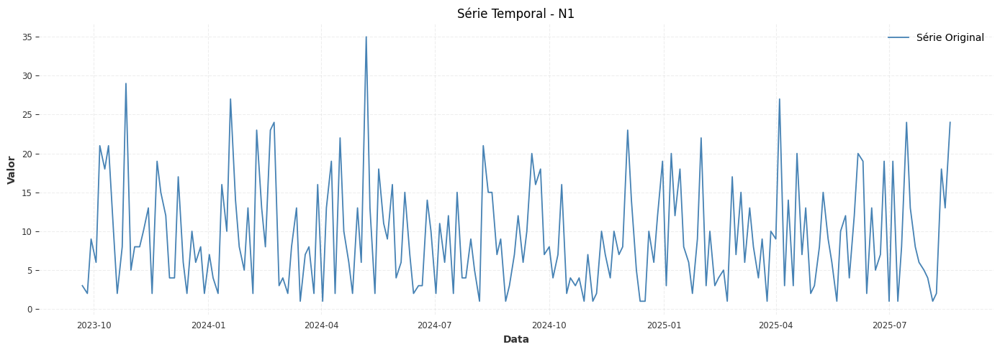

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.164958 | Val Loss: 0.027622 | Val MAE: 0.139425 | Val SMAPE: 68.97% | Tempo: 0.08s
Epoch 2/100 | Train Loss: 0.090190 | Val Loss: 0.089522 | Val MAE: 0.250960 | Val SMAPE: 192.36% | Tempo: 0.07s
Epoch 3/100 | Train Loss: 0.084251 | Val Loss: 0.036390 | Val MAE: 0.150267 | Val SMAPE: 79.99% | Tempo: 0.07s
Epoch 4/100 | Train Loss: 0.069156 | Val Loss: 0.028992 | Val MAE: 0.144841 | Val SMAPE: 70.50% | Tempo: 0.06s
Epoch 5/100 | Train Loss: 0.077533 | Val Loss: 0.028986 | Val MAE: 0.142316 | Val SMAPE: 72.82% | Tempo: 0.06s
Epoch 6/100 | Train Loss: 0.071034 | Val Loss: 0.036396 | Val MAE: 0.149832 | Val SMAPE: 78.92% | Tempo: 0.05s
Epoch 7/100 | Train Loss: 0.049558 | Val Loss: 0.030267 | Val MAE: 0.144027 | Val SMAPE: 73.28% | Tempo: 0.05s
Epoch 8/100 | Train Loss: 0.049569 | Val Loss: 0.028499 | Val MAE: 0.140852 | Val SMAPE: 70.78% | Tempo: 0.05s
Epoch 9/100 | Train Loss: 0.058195 | Val Loss: 0.028466 | Val MAE: 0.140043 | Val SMAPE: 70.13% | Tempo: 0.05s


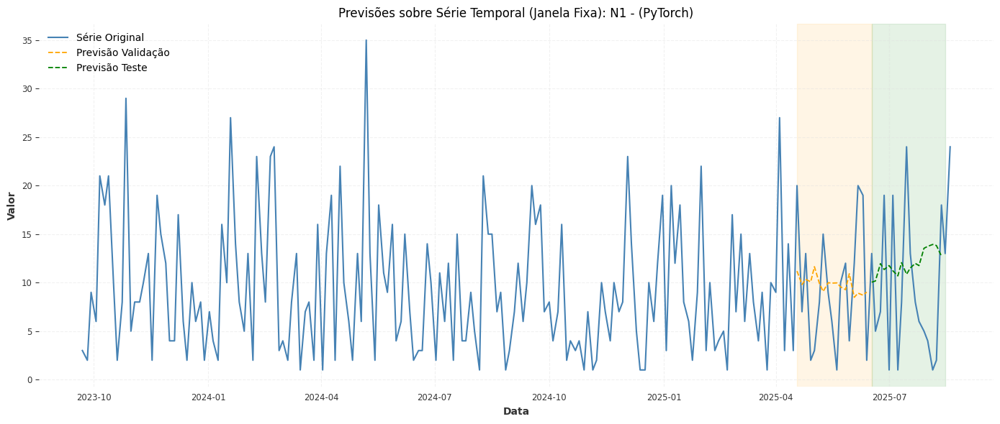

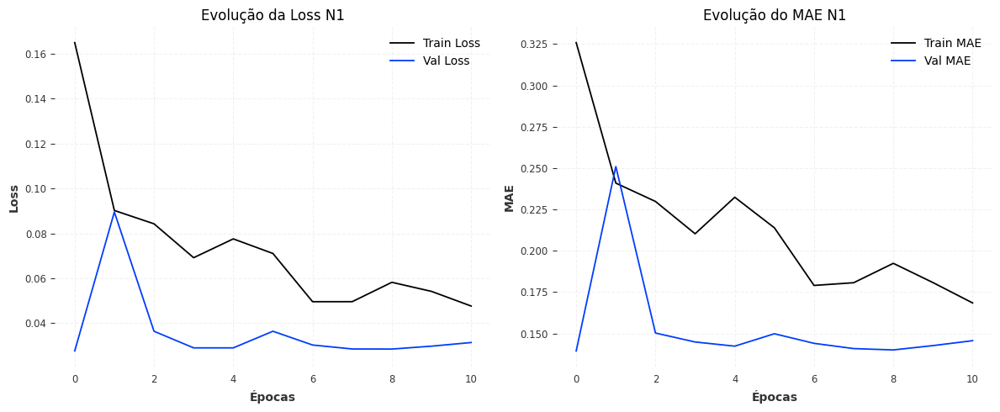

Modelo salvo em: modelos_pytorch/modelo_N1.pth

🚀 Processando a série 2/7: N2

🔄 Treinando modelo PyTorch hibrido para: N2


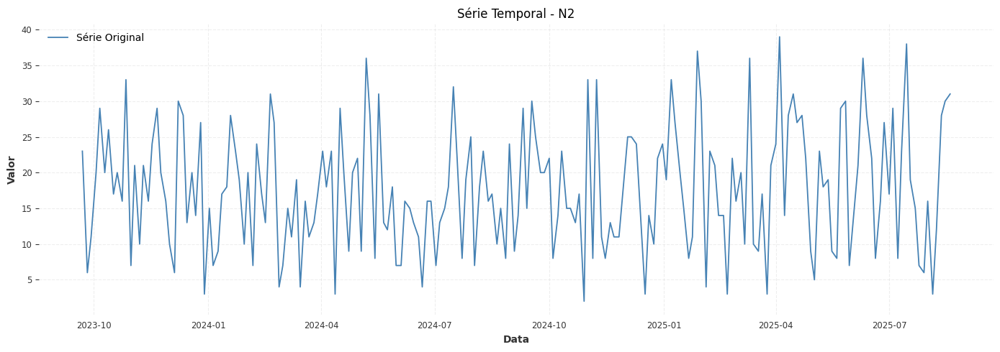

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.071281 | Val Loss: 0.101645 | Val MAE: 0.256498 | Val SMAPE: 67.98% | Tempo: 0.06s
Epoch 2/100 | Train Loss: 0.076116 | Val Loss: 0.115994 | Val MAE: 0.267452 | Val SMAPE: 71.42% | Tempo: 0.06s
Epoch 3/100 | Train Loss: 0.061050 | Val Loss: 0.116745 | Val MAE: 0.267121 | Val SMAPE: 70.63% | Tempo: 0.06s
Epoch 4/100 | Train Loss: 0.064640 | Val Loss: 0.065421 | Val MAE: 0.221387 | Val SMAPE: 57.30% | Tempo: 0.06s
Epoch 5/100 | Train Loss: 0.061606 | Val Loss: 0.070208 | Val MAE: 0.228339 | Val SMAPE: 59.29% | Tempo: 0.05s
Epoch 6/100 | Train Loss: 0.056700 | Val Loss: 0.075755 | Val MAE: 0.232817 | Val SMAPE: 60.64% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.059658 | Val Loss: 0.072712 | Val MAE: 0.228664 | Val SMAPE: 59.37% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.057369 | Val Loss: 0.072529 | Val MAE: 0.225325 | Val SMAPE: 58.13% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.049033 | Val Loss: 0.072999 | Val MAE: 0.226159 | Val SMAPE: 57.63% | Tempo: 0.05s
E

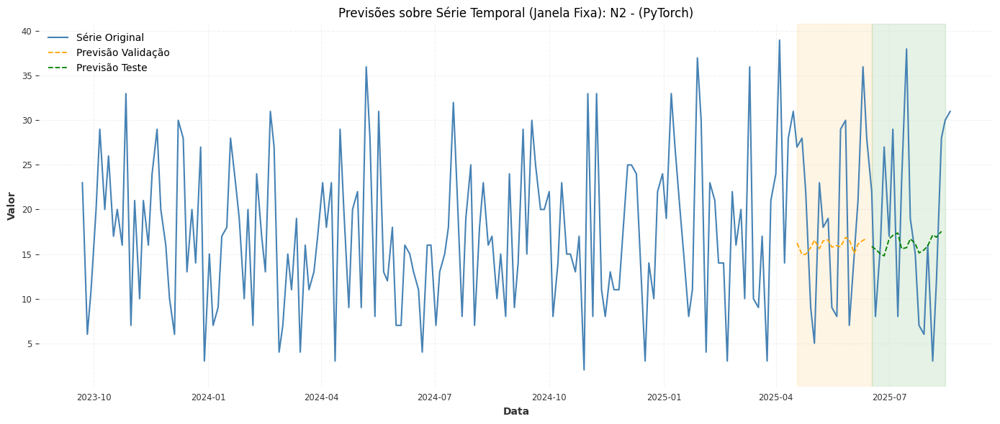

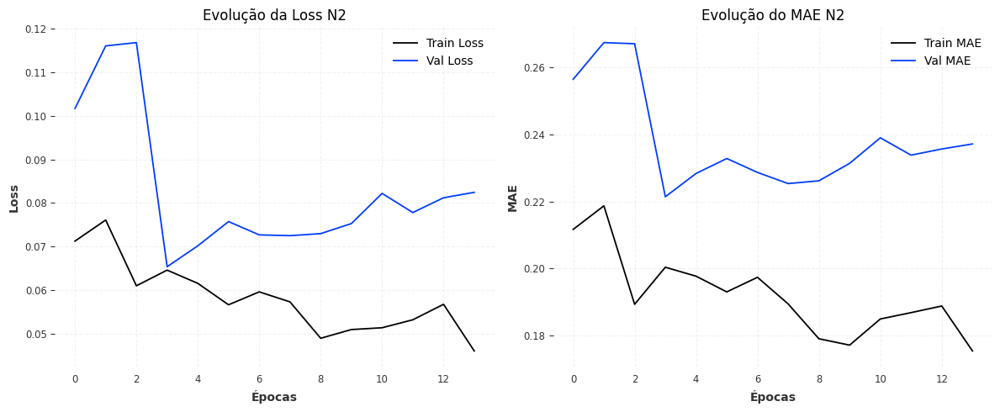

Modelo salvo em: modelos_pytorch/modelo_N2.pth

🚀 Processando a série 3/7: N3

🔄 Treinando modelo PyTorch hibrido para: N3


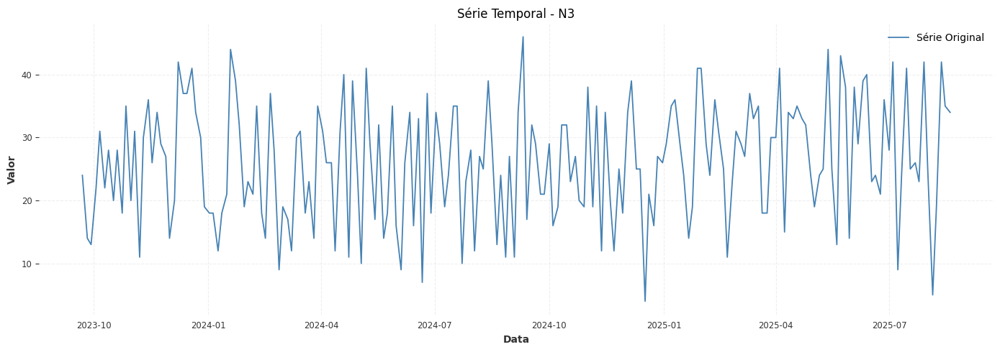

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.237154 | Val Loss: 0.115301 | Val MAE: 0.281353 | Val SMAPE: 54.27% | Tempo: 0.06s
Epoch 2/100 | Train Loss: 0.094045 | Val Loss: 0.066757 | Val MAE: 0.201814 | Val SMAPE: 35.79% | Tempo: 0.06s
Epoch 3/100 | Train Loss: 0.058227 | Val Loss: 0.079903 | Val MAE: 0.223938 | Val SMAPE: 40.50% | Tempo: 0.05s
Epoch 4/100 | Train Loss: 0.077679 | Val Loss: 0.062681 | Val MAE: 0.193934 | Val SMAPE: 34.14% | Tempo: 0.05s
Epoch 5/100 | Train Loss: 0.056151 | Val Loss: 0.053478 | Val MAE: 0.195384 | Val SMAPE: 34.44% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.060127 | Val Loss: 0.061942 | Val MAE: 0.192631 | Val SMAPE: 33.85% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.066758 | Val Loss: 0.072077 | Val MAE: 0.211565 | Val SMAPE: 37.80% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.053998 | Val Loss: 0.059151 | Val MAE: 0.192556 | Val SMAPE: 33.84% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.057213 | Val Loss: 0.053132 | Val MAE: 0.193000 | Val SMAPE: 33.96% | Tempo: 0.04s
E

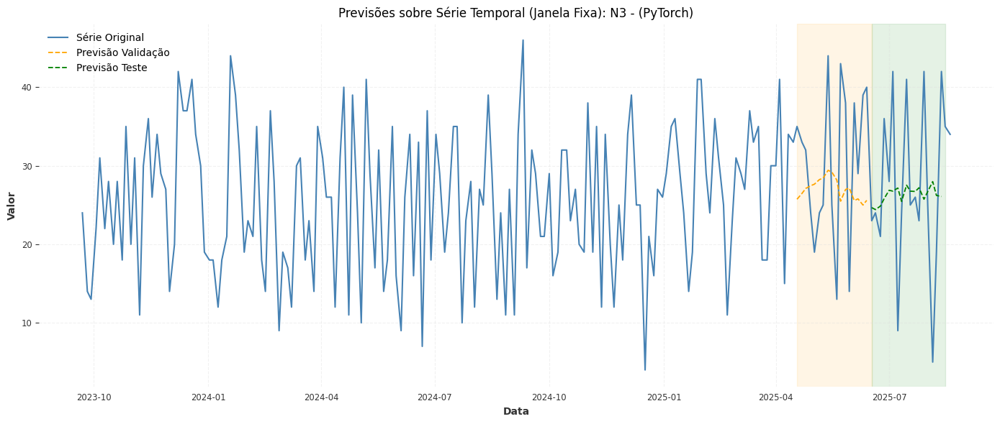

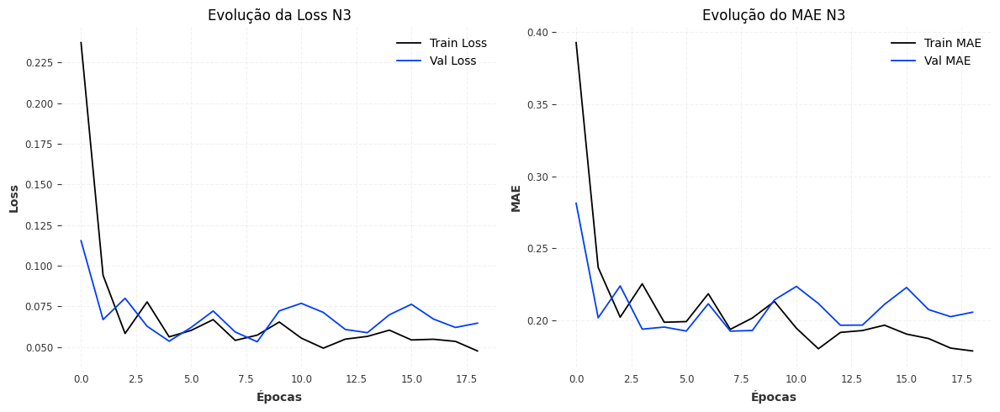

Modelo salvo em: modelos_pytorch/modelo_N3.pth

🚀 Processando a série 4/7: N4

🔄 Treinando modelo PyTorch hibrido para: N4


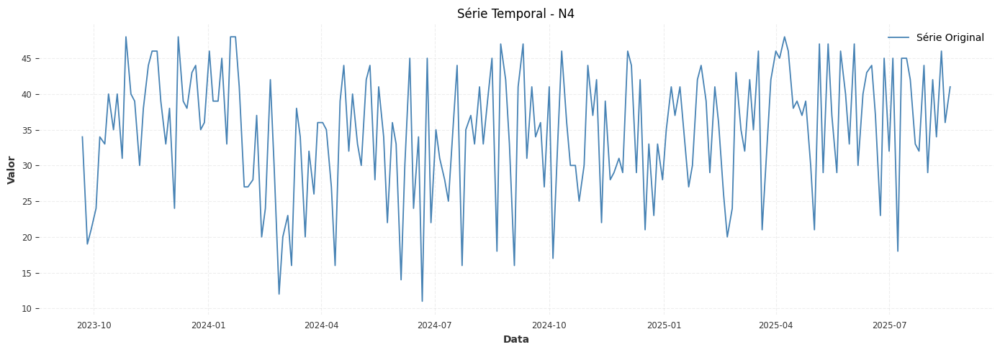

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.092610 | Val Loss: 0.189516 | Val MAE: 0.390746 | Val SMAPE: 69.41% | Tempo: 0.07s
Epoch 2/100 | Train Loss: 0.093023 | Val Loss: 0.064795 | Val MAE: 0.217326 | Val SMAPE: 32.58% | Tempo: 0.07s
Epoch 3/100 | Train Loss: 0.075162 | Val Loss: 0.061072 | Val MAE: 0.214554 | Val SMAPE: 32.11% | Tempo: 0.06s
Epoch 4/100 | Train Loss: 0.079405 | Val Loss: 0.053249 | Val MAE: 0.202323 | Val SMAPE: 30.09% | Tempo: 0.05s
Epoch 5/100 | Train Loss: 0.075521 | Val Loss: 0.052682 | Val MAE: 0.200935 | Val SMAPE: 29.82% | Tempo: 0.05s
Epoch 6/100 | Train Loss: 0.067654 | Val Loss: 0.057008 | Val MAE: 0.207810 | Val SMAPE: 30.93% | Tempo: 0.05s
Epoch 7/100 | Train Loss: 0.056952 | Val Loss: 0.051888 | Val MAE: 0.186755 | Val SMAPE: 27.14% | Tempo: 0.05s
Epoch 8/100 | Train Loss: 0.072333 | Val Loss: 0.058615 | Val MAE: 0.205636 | Val SMAPE: 30.28% | Tempo: 0.05s
Epoch 9/100 | Train Loss: 0.063261 | Val Loss: 0.060223 | Val MAE: 0.209623 | Val SMAPE: 31.09% | Tempo: 0.06s
E

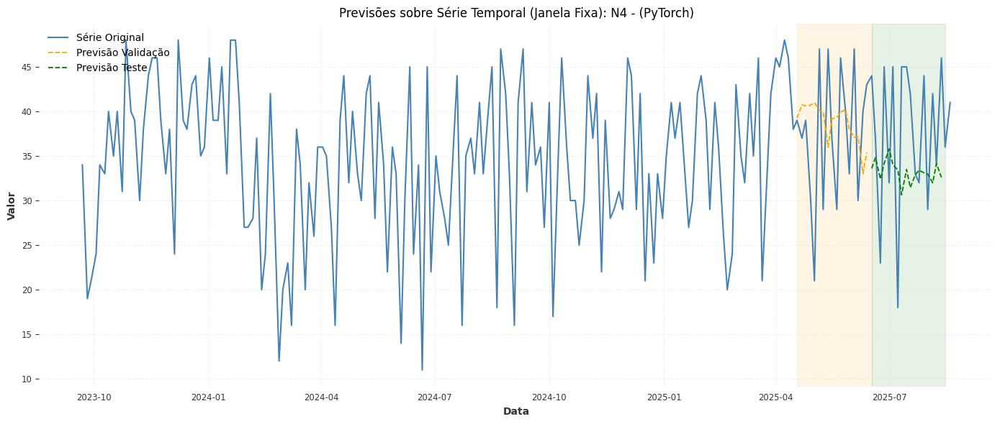

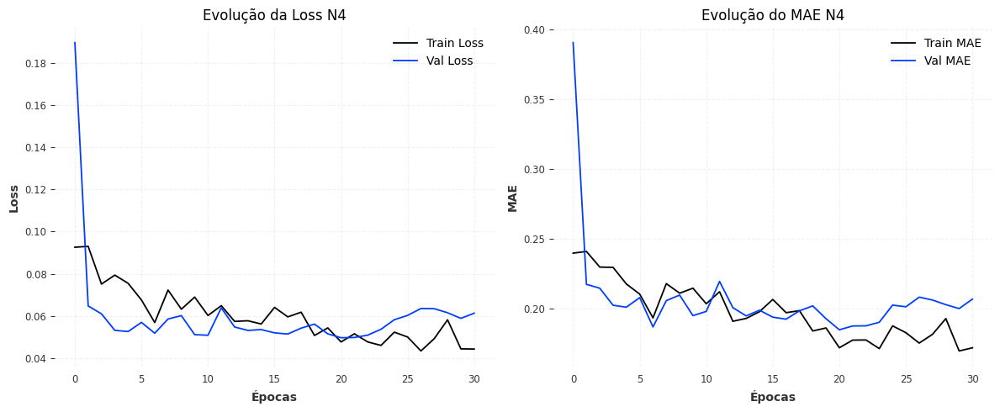

Modelo salvo em: modelos_pytorch/modelo_N4.pth

🚀 Processando a série 5/7: N5

🔄 Treinando modelo PyTorch hibrido para: N5


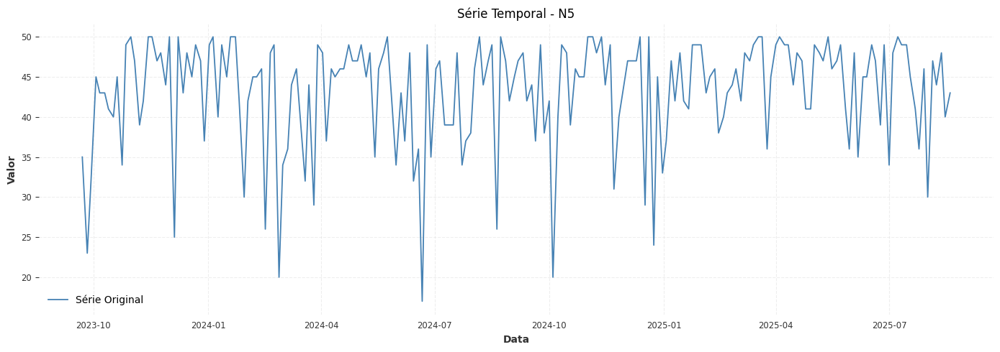

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.213818 | Val Loss: 0.034171 | Val MAE: 0.164681 | Val SMAPE: 20.66% | Tempo: 0.06s
Epoch 2/100 | Train Loss: 0.101426 | Val Loss: 0.094901 | Val MAE: 0.279223 | Val SMAPE: 38.00% | Tempo: 0.06s
Epoch 3/100 | Train Loss: 0.096703 | Val Loss: 0.037334 | Val MAE: 0.173390 | Val SMAPE: 21.82% | Tempo: 0.06s
Epoch 4/100 | Train Loss: 0.085066 | Val Loss: 0.027011 | Val MAE: 0.147243 | Val SMAPE: 18.29% | Tempo: 0.06s
Epoch 5/100 | Train Loss: 0.090056 | Val Loss: 0.027517 | Val MAE: 0.147367 | Val SMAPE: 18.29% | Tempo: 0.08s
Epoch 6/100 | Train Loss: 0.071793 | Val Loss: 0.044065 | Val MAE: 0.190167 | Val SMAPE: 24.19% | Tempo: 0.07s
Epoch 7/100 | Train Loss: 0.087181 | Val Loss: 0.027965 | Val MAE: 0.149905 | Val SMAPE: 18.63% | Tempo: 0.07s
Epoch 8/100 | Train Loss: 0.076988 | Val Loss: 0.029726 | Val MAE: 0.154777 | Val SMAPE: 19.27% | Tempo: 0.05s
Epoch 9/100 | Train Loss: 0.056932 | Val Loss: 0.026969 | Val MAE: 0.150079 | Val SMAPE: 18.65% | Tempo: 0.05s
E

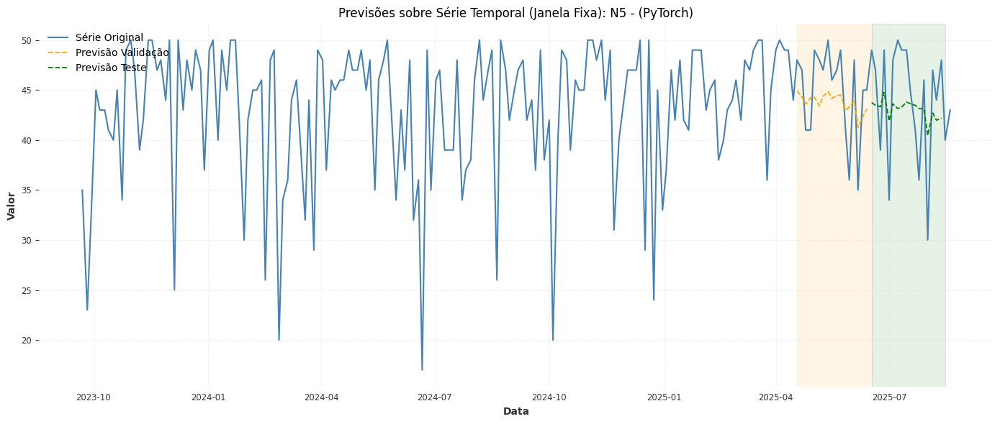

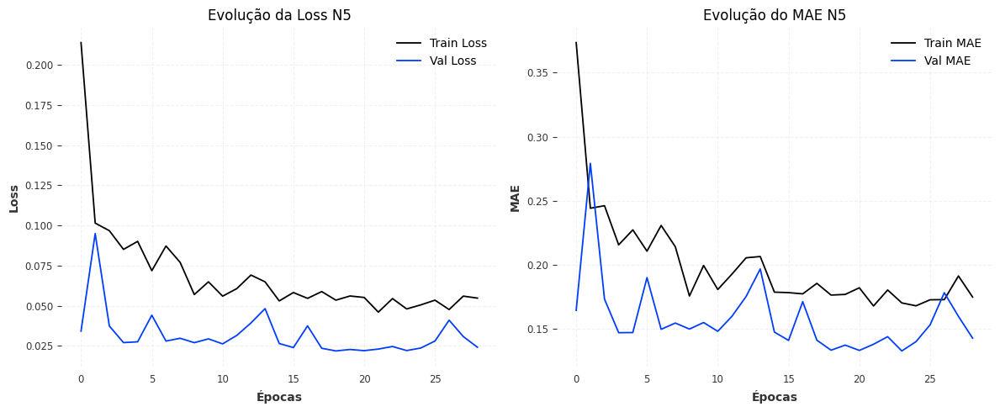

Modelo salvo em: modelos_pytorch/modelo_N5.pth

🚀 Processando a série 6/7: E1

🔄 Treinando modelo PyTorch hibrido para: E1


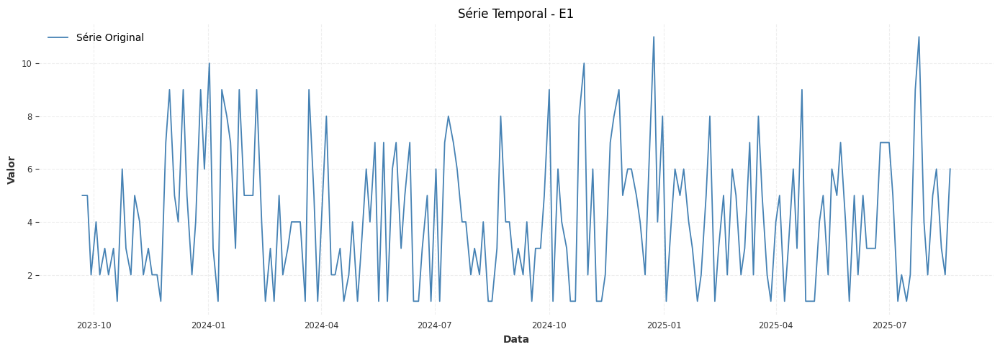

Epoch 1/100 | Train Loss: 0.098436 | Val Loss: 0.061140 | Val MAE: 0.199627 | Val SMAPE: 80.74% | Tempo: 0.05s

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(



Epoch 2/100 | Train Loss: 0.082661 | Val Loss: 0.033986 | Val MAE: 0.164893 | Val SMAPE: 87.08% | Tempo: 0.06s
Epoch 3/100 | Train Loss: 0.079542 | Val Loss: 0.034324 | Val MAE: 0.162431 | Val SMAPE: 87.07% | Tempo: 0.05s
Epoch 4/100 | Train Loss: 0.079712 | Val Loss: 0.035548 | Val MAE: 0.165344 | Val SMAPE: 82.74% | Tempo: 0.06s
Epoch 5/100 | Train Loss: 0.081808 | Val Loss: 0.034441 | Val MAE: 0.164091 | Val SMAPE: 84.13% | Tempo: 0.05s
Epoch 6/100 | Train Loss: 0.067479 | Val Loss: 0.033303 | Val MAE: 0.163720 | Val SMAPE: 84.67% | Tempo: 0.05s
Epoch 7/100 | Train Loss: 0.074563 | Val Loss: 0.039849 | Val MAE: 0.172650 | Val SMAPE: 81.13% | Tempo: 0.05s
Epoch 8/100 | Train Loss: 0.071974 | Val Loss: 0.048527 | Val MAE: 0.185154 | Val SMAPE: 81.49% | Tempo: 0.05s
Epoch 9/100 | Train Loss: 0.073119 | Val Loss: 0.037644 | Val MAE: 0.166692 | Val SMAPE: 80.47% | Tempo: 0.05s
Epoch 10/100 | Train Loss: 0.072606 | Val Loss: 0.036302 | Val MAE: 0.165272 | Val SMAPE: 81.34% | Tempo: 0.06s

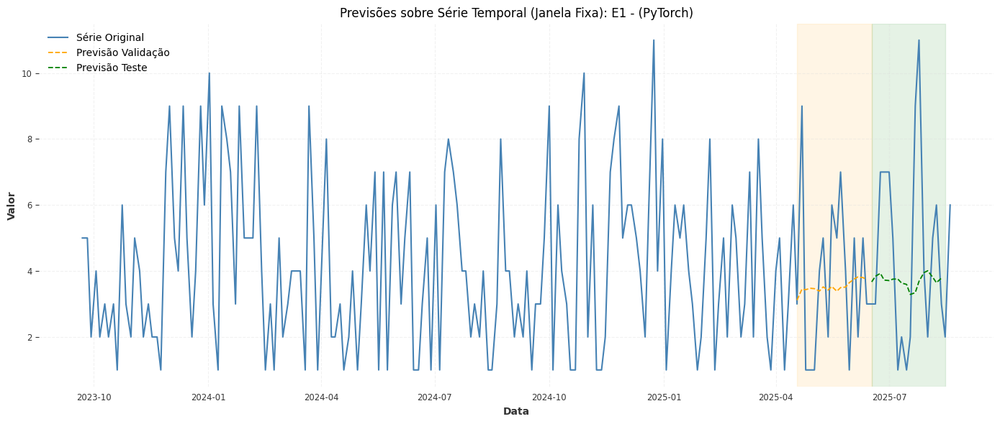

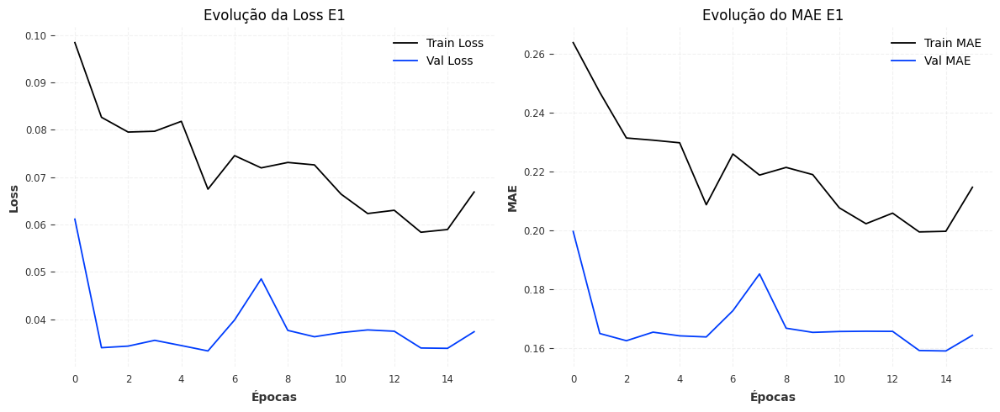

Modelo salvo em: modelos_pytorch/modelo_E1.pth

🚀 Processando a série 7/7: E2

🔄 Treinando modelo PyTorch hibrido para: E2


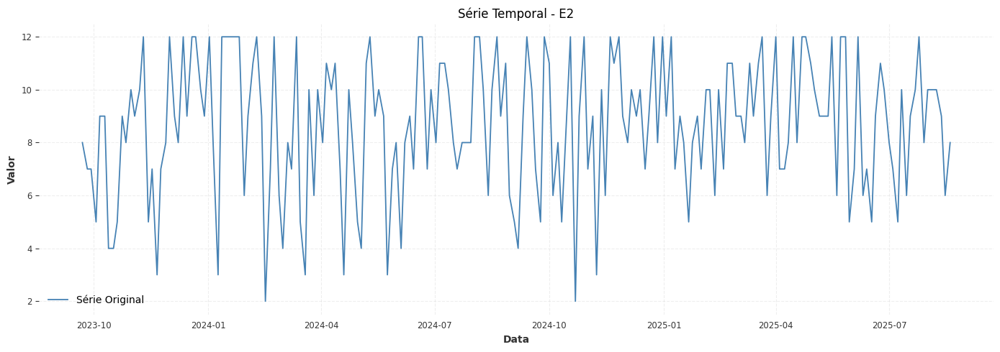

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.545731 | Val Loss: 0.470540 | Val MAE: 0.634205 | Val SMAPE: 160.02% | Tempo: 0.07s
Epoch 2/100 | Train Loss: 0.164731 | Val Loss: 0.285817 | Val MAE: 0.469308 | Val SMAPE: 92.81% | Tempo: 0.06s
Epoch 3/100 | Train Loss: 0.125728 | Val Loss: 0.287326 | Val MAE: 0.470967 | Val SMAPE: 93.47% | Tempo: 0.07s
Epoch 4/100 | Train Loss: 0.137966 | Val Loss: 0.077508 | Val MAE: 0.234352 | Val SMAPE: 35.89% | Tempo: 0.06s
Epoch 5/100 | Train Loss: 0.122630 | Val Loss: 0.062431 | Val MAE: 0.214245 | Val SMAPE: 32.92% | Tempo: 0.05s
Epoch 6/100 | Train Loss: 0.110478 | Val Loss: 0.076772 | Val MAE: 0.238039 | Val SMAPE: 36.54% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.114050 | Val Loss: 0.089756 | Val MAE: 0.249798 | Val SMAPE: 38.32% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.097271 | Val Loss: 0.071635 | Val MAE: 0.230822 | Val SMAPE: 35.37% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.084176 | Val Loss: 0.061711 | Val MAE: 0.212959 | Val SMAPE: 32.70% | Tempo: 0.04s


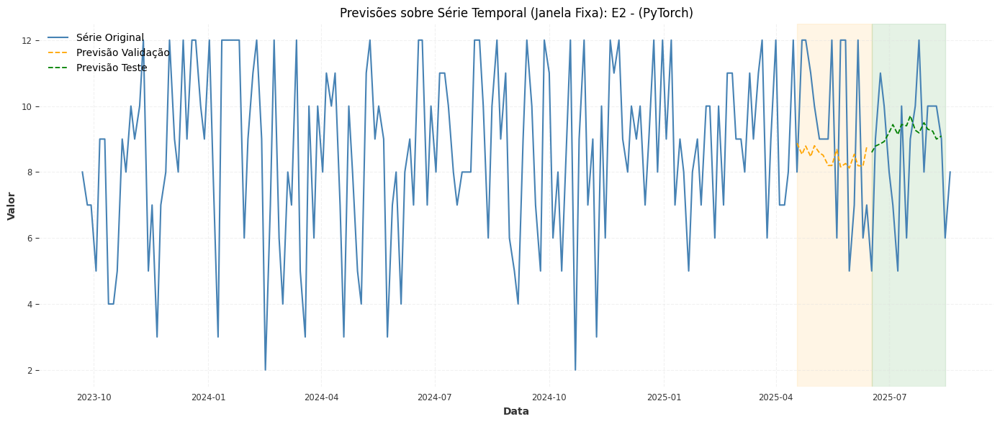

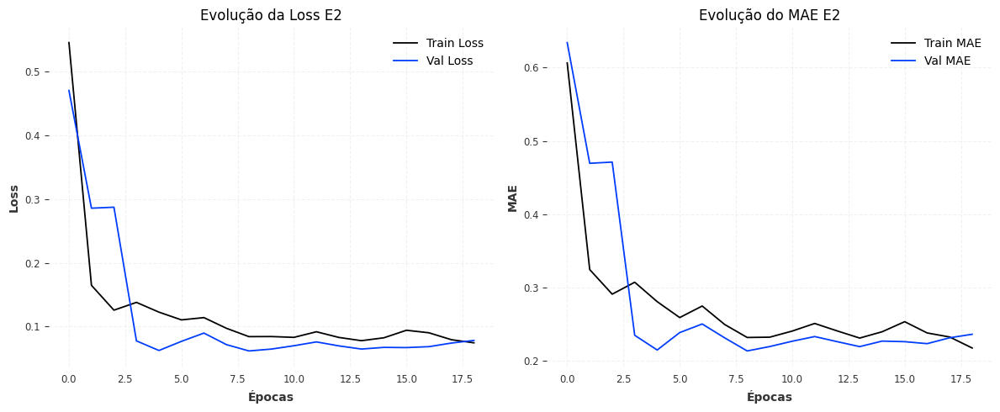

Modelo salvo em: modelos_pytorch/modelo_E2.pth


In [178]:
for idx, serie in enumerate(df.columns, 1):
    try:
        print(f"\n{'='*50}")
        print(f"🚀 Processando a série {idx}/{len(df.columns)}: {df[serie].name}")
        
        # Rodar com parâmetros padrão
        model, history = treinar_para_serie_pytorch(df[serie], seq_length=30, usar_hibrido=True, serie_name = df[serie].name)
        
        # Salvar o modelo com nome descritivo
        nome_arquivo = f"modelos_pytorch/modelo_{df[serie].name.replace(' ', '_').replace('/', '_')[:50]}.pth"
        torch.save(model.state_dict(), nome_arquivo)
        print(f"Modelo salvo em: {nome_arquivo}")
        
    except ValueError as ve:
        print(f"❌ Série {df[serie].name} ignorada - {str(ve)}")
    except Exception as e:
        print(f"❌ Erro inesperado na série {df[serie].name}: {str(e)}")
        continue

#### 2.1.2. Janela Deslizante (Sliding/Rolling Window)

In [20]:
batch_size=64
patience_es=20
factor=0.6
patience_lr=3
min_lr=1e-6


🚀 Processando a série 1/7: N1


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.140670 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.03s
Epoch 2/50 | Train Loss: 0.020949 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.012311 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.016558 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.030506 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.036539 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.044702 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.054285 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.048397 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.016808 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.013698 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.039164 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.026871 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.011196 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  3.92it/s]

Epoch 1/50 | Train Loss: 0.573869 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.220709 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.089888 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.095999 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.092477 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.159894 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.133233 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.177502 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.108718 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.116316 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.067248 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.076073 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.155307 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.070424 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.076909 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  20%|██        | 2/10 [00:00<00:02,  3.99it/s]

Epoch 20/50 | Train Loss: 0.068936 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.224137 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.128060 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.070424 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.092384 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.143301 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.130295 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.100409 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.101577 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.075624 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.091151 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.085352 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.077938 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.073944 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.075369 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.082502 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.081137 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.032640 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.035191 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.046282 | Va

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 8/50 | Train Loss: 0.025021 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 9/50 | Train Loss: 0.042588 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.048120 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.057571 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.025478 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.035057 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.053744 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.047052 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.056805 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.043292 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 

Janela de previsão:  40%|████      | 4/10 [00:01<00:01,  3.84it/s]

Epoch 1/50 | Train Loss: 1.039713 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.698648 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.280258 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.249070 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 5/50 | Train Loss: 0.201234 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.139589 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.069678 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.082386 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.142672 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.094789 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.103519 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.070189 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.108372 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.096893 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | T

Janela de previsão:  50%|█████     | 5/10 [00:01<00:01,  3.89it/s]c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same 

Epoch 1/50 | Train Loss: 0.191324 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.080509 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.063366 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.089999 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.048490 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.036264 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.019109 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.048319 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.042514 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.073509 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

Janela de previsão:  60%|██████    | 6/10 [00:01<00:01,  3.93it/s]

Epoch 18/50 | Train Loss: 0.007331 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.038155 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.038263 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.233003 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.156679 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.217731 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.132560 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.148516 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.139017 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.119564 | Val L

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.101164 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 16/50 | Train Loss: 0.096356 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.141412 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.104961 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.113178 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.142485 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.075240 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.101913 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.091410 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.044041 | Va

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 11/50 | Train Loss: 0.058024 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.041900 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.052335 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.046780 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.042838 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.038502 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.039430 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.054269 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.060022 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.044106 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 7/50 | Train Loss: 0.073839 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.066001 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.039563 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.055759 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.040606 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.051400 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.038878 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.043779 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.042363 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.034335 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 |

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 5/50 | Train Loss: 0.011740 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.013237 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.027308 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.036192 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.035576 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.010978 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.027109 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.025809 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.020034 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.016746 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | T

Janela de previsão: 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]


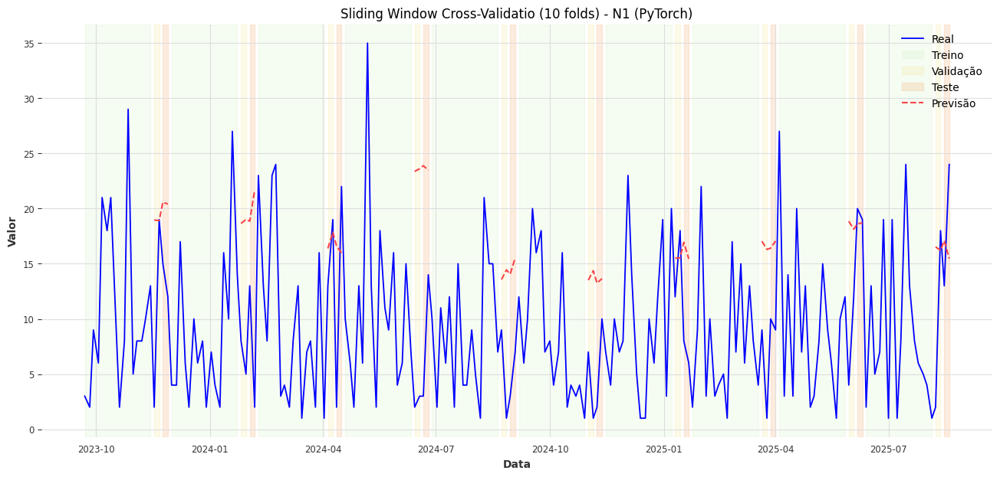

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.55 segundos

🚀 Processando a série 2/7: N2


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.067005 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.094286 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.055369 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.090547 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.046415 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.034692 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.046333 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.094260 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.050989 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.108975 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.049625 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.036642 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.040223 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.045242 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  4.05it/s]

Epoch 1/50 | Train Loss: 0.803253 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.417633 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.279398 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.121102 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.066054 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.051431 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.054735 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.068924 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.028699 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.089324 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.050390 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.064670 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.108683 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.122022 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  20%|██        | 2/10 [00:00<00:01,  4.10it/s]

Epoch 20/50 | Train Loss: 0.047265 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.053612 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.040686 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.055423 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.040664 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.039040 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.038549 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.039037 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.068510 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.043181 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.034597 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.042640 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.068634 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.203958 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.056373 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.045694 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.038451 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.076680 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.032483 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.032037 | Val L

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 11/50 | Train Loss: 0.032199 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.024996 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.023604 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.031210 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.031789 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.027493 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.025531 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.025328 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.030953 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.026060 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 4/50 | Train Loss: 0.043350 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.085993 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.102869 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.075126 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.061549 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.053224 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.048626 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.049267 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.035585 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.040510 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Tr

Janela de previsão:  50%|█████     | 5/10 [00:01<00:01,  3.86it/s]c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same 

Epoch 1/50 | Train Loss: 0.261182 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.170770 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.058943 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.058831 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.129012 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.081033 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.116831 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.112196 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.077468 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.076455 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

Janela de previsão:  60%|██████    | 6/10 [00:01<00:01,  3.96it/s]

Epoch 20/50 | Train Loss: 0.045540 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.412004 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.078992 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.034519 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.085630 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.160610 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.120408 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.093748 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.064004 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.043224 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.049666 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.062256 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.048505 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.045960 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.053835 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.033806 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.326951 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.219275 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.148954 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.128689 | Va

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 11/50 | Train Loss: 0.134373 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.119504 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.134860 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.116933 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.123959 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.115986 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.131071 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.120499 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.133156 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.124619 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 9/50 | Train Loss: 0.112047 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.126247 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.126504 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.129893 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.098631 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.131883 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.119771 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.124258 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.109781 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.108840 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 6/50 | Train Loss: 0.032293 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.027142 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.031559 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.021077 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.031306 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.029382 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.026188 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.027231 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.028726 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.020031 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | 

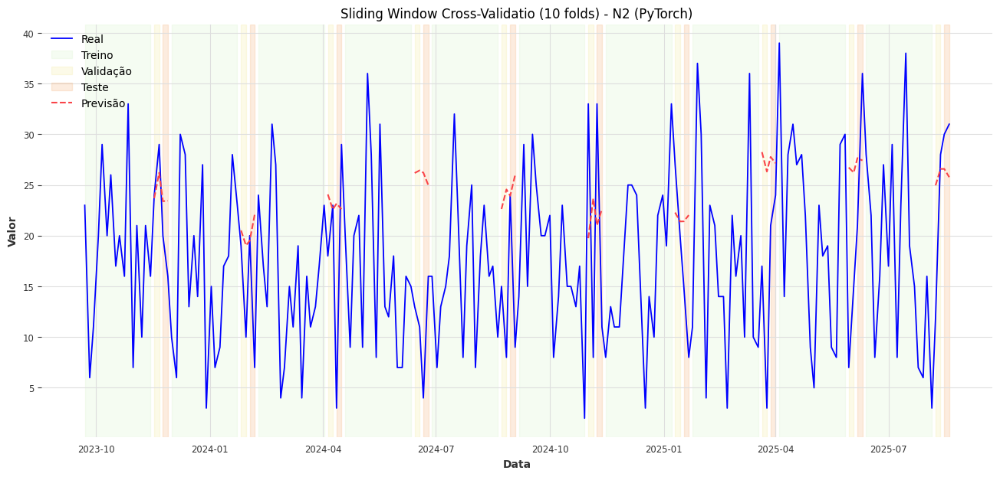

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.48 segundos

🚀 Processando a série 3/7: N3


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.684757 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.291714 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.216328 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.210198 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.169796 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.154854 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.181467 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.225821 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.176163 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.206905 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.173821 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.159057 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.161175 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.175487 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  4.03it/s]

Epoch 1/50 | Train Loss: 0.245630 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.126150 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.285290 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.127936 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.128354 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.144355 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.128187 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.138618 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.138464 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.143698 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.153622 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.154416 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.179398 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.124713 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  20%|██        | 2/10 [00:00<00:01,  4.04it/s]

Epoch 20/50 | Train Loss: 0.133260 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.344854 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.116947 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.099351 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.232552 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.170908 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.140053 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.185348 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.173128 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.101847 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.099286 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.123649 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.087791 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.178855 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.119813 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.111621 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.122711 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.103372 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.111143 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.126721 | Val L

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.098066 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.091942 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.100851 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.091267 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.088877 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.113299 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.091251 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.103226 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.269053 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.213672 | 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 9/50 | Train Loss: 0.142424 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.164774 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.119424 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.156753 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.133709 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.128015 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.117224 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.126327 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.124984 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.133989 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 7/50 | Train Loss: 0.015376 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.031006 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.022598 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.021455 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.034923 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.043612 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.022772 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.039689 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.031705 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.063896 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 |

Janela de previsão:  60%|██████    | 6/10 [00:01<00:00,  4.07it/s]

Epoch 1/50 | Train Loss: 0.481282 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.066447 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.072329 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 4/50 | Train Loss: 0.018952 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.062694 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.128276 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.143761 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.064831 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.129096 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.056463 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.028638 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.027225 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.036119 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Tr

Janela de previsão:  70%|███████   | 7/10 [00:01<00:00,  3.99it/s]

Epoch 1/50 | Train Loss: 0.536921 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.211931 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.094074 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.079432 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.032502 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.105604 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.096062 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.117267 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.072674 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.102508 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.121817 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.043076 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.045983 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.059513 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.071638 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.042784 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.061071 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  80%|████████  | 8/10 [00:01<00:00,  3.99it/s]

Epoch 20/50 | Train Loss: 0.029870 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.570575 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.298908 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.241018 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.177333 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.207407 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.177301 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.151927 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.182582 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.184281 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.163992 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.172377 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.151179 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.168084 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.480964 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.346418 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.230563 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.175126 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.138014 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.130639 | Val 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 14/50 | Train Loss: 0.159270 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.128921 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.141591 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.142578 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.132449 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.130849 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.138395 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


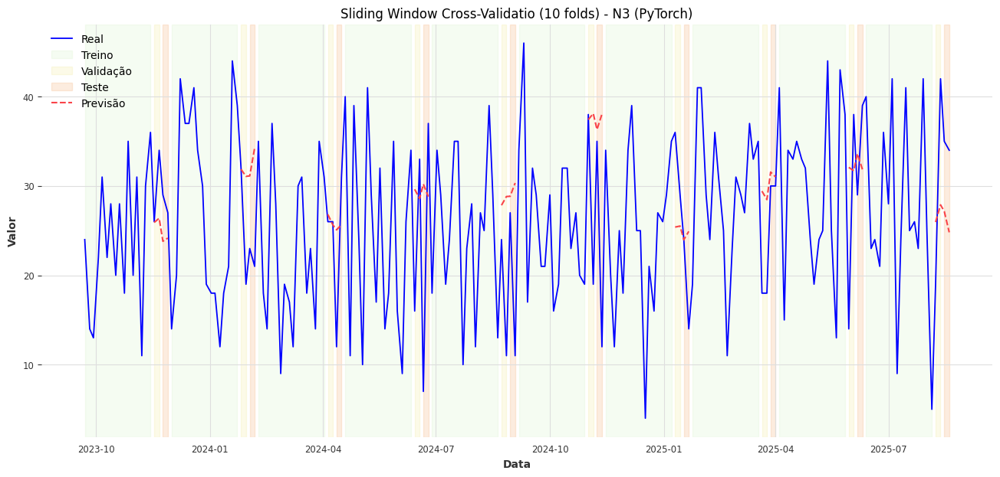

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.48 segundos

🚀 Processando a série 4/7: N4


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.538889 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.147582 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.048188 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.092443 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.111277 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.113869 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.095278 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.057045 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.115818 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.059454 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.049897 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.079852 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.037583 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  4.34it/s]

Epoch 1/50 | Train Loss: 0.762301 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.418316 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.101912 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.072013 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.240042 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.253384 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.219193 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.100292 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.089421 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.106411 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.074291 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.113915 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.100159 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.164897 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  20%|██        | 2/10 [00:00<00:01,  4.21it/s]

Epoch 19/50 | Train Loss: 0.099220 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.123792 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.568079 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.464041 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.360617 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.182212 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.099618 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.104505 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.057116 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 8/50 | Train Loss: 0.027691 | Val Lo

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.032227 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.037565 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.026572 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.113691 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.834761 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.616226 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.448911 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.290910 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.254828 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.180919 | Val 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.140311 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.193048 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.131356 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.150444 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.136537 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.141990 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.558235 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.229447 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.272868 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.216427 | Va

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.177720 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.156296 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.159841 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.163329 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.131889 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.127371 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.133051 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.158036 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.152092 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.016286 | 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 11/50 | Train Loss: 0.029269 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.034993 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.052204 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.029638 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.010663 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.011620 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.026551 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.093895 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.015589 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.018146 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 8/50 | Train Loss: 0.099420 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.068270 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.042779 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.045144 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.047264 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.050673 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.046182 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.041827 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.039455 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.045964 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 

Janela de previsão:  70%|███████   | 7/10 [00:01<00:00,  4.17it/s]

Epoch 20/50 | Train Loss: 0.048796 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s
Epoch 1/50 | Train Loss: 0.515868 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.143310 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.094784 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.067303 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.117833 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.100899 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.153477 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.108477 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.159290 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.074073 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.094055 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.052608 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s


Janela de previsão:  80%|████████  | 8/10 [00:01<00:00,  4.16it/s]

Epoch 1/50 | Train Loss: 0.234398 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.075156 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.070015 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.102859 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.064141 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.186361 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.110569 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.096434 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.100954 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.079023 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 14/50 | Train Loss: 0.066301 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.080372 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.094722 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.075558 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.069885 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.163339 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.072371 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  90%|█████████ | 9/10 [00:02<00:00,  4.22it/s]

Epoch 1/50 | Train Loss: 1.367187 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.811568 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.416198 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.298740 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.162889 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.132667 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.069106 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.109780 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.088492 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.059362 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.132779 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.080498 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.136680 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.142874 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.063317 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.100326 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.139322 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.141281 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão: 100%|██████████| 10/10 [00:02<00:00,  4.20it/s]


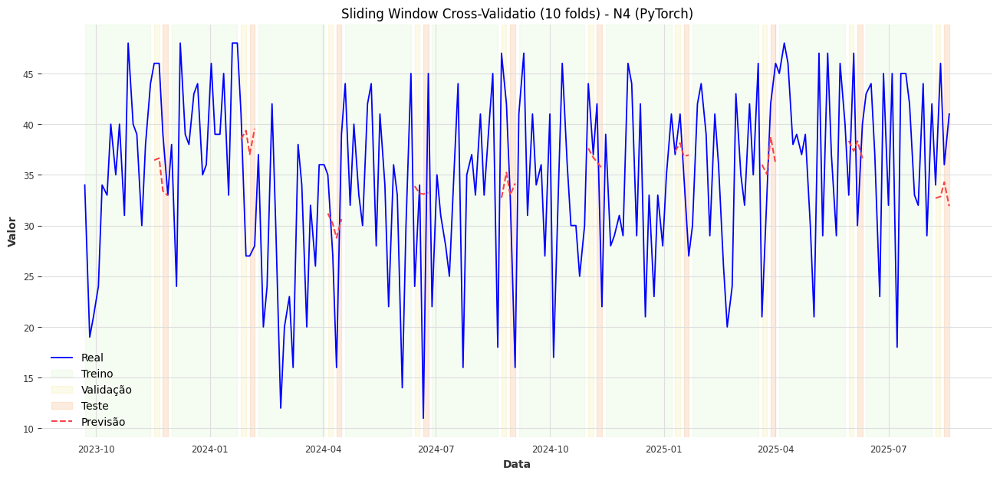

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.38 segundos

🚀 Processando a série 5/7: N5


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 1.051498 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.627988 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.315810 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.310746 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.202767 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.074534 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.148119 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.056908 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.047087 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.064810 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.072902 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.047432 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.040573 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.039037 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.073109 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  4.00it/s]

Epoch 1/50 | Train Loss: 1.003832 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.769225 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.654283 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.326564 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.078721 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.139867 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.077886 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.018164 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.092782 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.024775 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.050586 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.051385 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 15/50 | Train Loss: 0.096727 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.028753 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.026401 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.103460 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.090240 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  20%|██        | 2/10 [00:00<00:02,  3.96it/s]

Epoch 20/50 | Train Loss: 0.092327 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.590426 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.419481 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.133576 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.090727 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.141941 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.151750 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.225841 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.159637 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.200864 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 17/50 | Train Loss: 0.091497 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.122877 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.097899 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.097840 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.214402 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.137873 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.145164 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.120627 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.133519 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.160151 | Val 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 14/50 | Train Loss: 0.122233 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.147350 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.121883 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.137497 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.140787 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.124161 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.119329 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.820828 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.424882 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.262587 | V

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 13/50 | Train Loss: 0.180521 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.158229 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.152445 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.174405 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.175917 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.169953 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.182029 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.166782 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  50%|█████     | 5/10 [00:01<00:01,  4.18it/s]

Epoch 1/50 | Train Loss: 0.622534 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.302582 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.226350 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.071593 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.040903 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.081812 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.022404 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.032989 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.014076 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 10/50 | Train Loss: 0.026776 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.018129 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.045500 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.021773 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.090974 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.024036 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.015642 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.043890 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.033723 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.062937 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/5

Janela de previsão:  60%|██████    | 6/10 [00:01<00:00,  4.23it/s]

Epoch 1/50 | Train Loss: 0.857252 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.446011 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.313649 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.243707 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.119930 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.141793 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.087324 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 8/50 | Train Loss: 0.079016 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.064759 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.075782 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.084247 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.055595 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.060811 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.062085 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.074951 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.061464 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 17/50 | Train Loss: 0.071451 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 

Janela de previsão:  70%|███████   | 7/10 [00:01<00:00,  3.97it/s]

Epoch 1/50 | Train Loss: 1.133692 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.583552 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.594440 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.479406 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.257515 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.264254 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.118618 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.120088 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.165459 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.157994 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 11/50 | Train Loss: 0.060796 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.080961 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.076446 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.052785 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.092691 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.030476 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.045483 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.038415 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.031836 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.032651 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem

Janela de previsão:  80%|████████  | 8/10 [00:01<00:00,  4.04it/s]

Epoch 1/50 | Train Loss: 0.390367 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.373807 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.233247 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.136654 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.134498 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.132701 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.115223 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.112497 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 9/50 | Train Loss: 0.151755 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.113204 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.118704 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.139097 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.119063 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.132714 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.127339 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.123338 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.144182 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.125508 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50

Janela de previsão:  90%|█████████ | 9/10 [00:02<00:00,  4.12it/s]

Epoch 20/50 | Train Loss: 0.190891 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s
Epoch 1/50 | Train Loss: 0.385789 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.237924 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.143767 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.159538 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.136872 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.162850 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.143293 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.132540 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.207612 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.126726 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.164634 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.144170 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


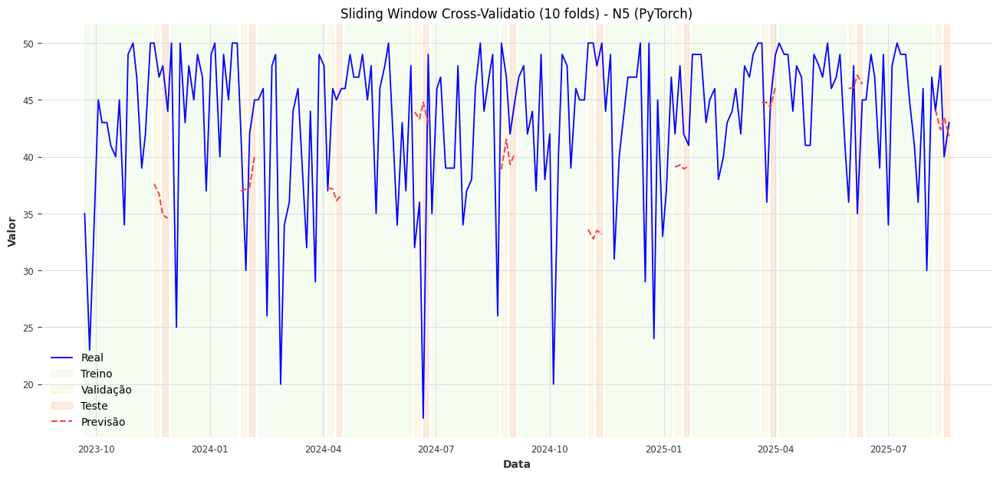

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.44 segundos

🚀 Processando a série 6/7: E1


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.516193 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.144547 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.070463 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.116101 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.091011 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.081813 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.083384 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.090307 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.079441 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.061077 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.106019 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.081211 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.076219 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  10%|█         | 1/10 [00:00<00:02,  4.32it/s]

Epoch 1/50 | Train Loss: 0.477118 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.171983 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.132629 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.120340 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.096075 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.140001 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.106577 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.126529 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.092321 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.154069 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.083536 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.085615 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.095058 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.075950 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.073947 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.092814 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  20%|██        | 2/10 [00:00<00:01,  4.25it/s]

Epoch 1/50 | Train Loss: 0.197496 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.151890 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.185690 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.204877 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.173320 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.136442 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.152767 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.126872 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.158368 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.132876 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 12/50 | Train Loss: 0.154135 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.140191 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.135076 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.153060 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.132917 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.145596 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.161618 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.129095 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  30%|███       | 3/10 [00:00<00:01,  4.23it/s]

Epoch 20/50 | Train Loss: 0.130202 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s
Epoch 1/50 | Train Loss: 0.889322 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.439726 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.353374 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.230239 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.126808 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.165559 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.136983 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.089503 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.119112 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.090719 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.085841 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.110050 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.114720 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.127930 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.042501 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.131256 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.057548 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.040989 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.053950 | Val

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 14/50 | Train Loss: 0.057321 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.040100 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.049376 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.042424 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.041554 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.049539 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.052768 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s


Janela de previsão:  50%|█████     | 5/10 [00:01<00:01,  4.12it/s]

Epoch 1/50 | Train Loss: 0.352163 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.228361 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.223906 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.239369 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.282048 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.266992 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.241137 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.223038 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.209492 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 10/50 | Train Loss: 0.212814 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.226456 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.230796 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.212303 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.220800 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.208760 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.217504 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.212706 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.218398 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.217252 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/5

Janela de previsão:  60%|██████    | 6/10 [00:01<00:00,  4.14it/s]

Epoch 1/50 | Train Loss: 0.297199 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.093845 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.067002 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.086216 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.080893 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.085293 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.103583 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.069245 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 9/50 | Train Loss: 0.073614 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.082911 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.171779 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.090468 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.070329 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.078856 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.075405 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.078761 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.073913 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.094615 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50

Janela de previsão:  70%|███████   | 7/10 [00:01<00:00,  4.21it/s]

Epoch 1/50 | Train Loss: 0.266613 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.168318 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.147332 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.151935 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.210389 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.165423 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.168189 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 8/50 | Train Loss: 0.185298 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.140012 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.146891 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.155596 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.139460 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.200511 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.175640 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.136754 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.154182 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.137084 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 

Janela de previsão:  80%|████████  | 8/10 [00:01<00:00,  4.28it/s]

Epoch 1/50 | Train Loss: 0.174650 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.068794 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.050610 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.040755 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.050152 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.073717 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 7/50 | Train Loss: 0.062441 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.024450 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.034096 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.034491 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.031984 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.074246 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.061359 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.032216 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.024284 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.028101 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 |

Janela de previsão:  90%|█████████ | 9/10 [00:02<00:00,  4.24it/s]

Epoch 1/50 | Train Loss: 0.307373 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.165579 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.184408 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 4/50 | Train Loss: 0.172371 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.211212 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.190236 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.205129 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.143662 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.139749 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.143869 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.136242 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.126490 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.134560 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Tr

Janela de previsão: 100%|██████████| 10/10 [00:02<00:00,  4.21it/s]

Epoch 20/50 | Train Loss: 0.147765 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s


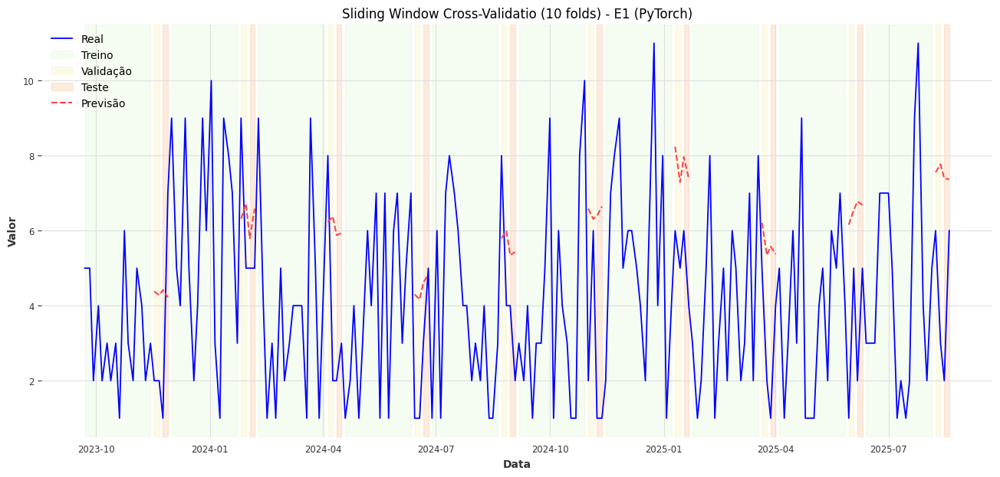

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.38 segundos

🚀 Processando a série 7/7: E2


Janela de previsão:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/50 | Train Loss: 0.248904 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.245544 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.105934 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.158311 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.117708 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.129048 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.169095 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.144114 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.118491 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.237039 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 18/50 | Train Loss: 0.137299 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.153248 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.138731 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s
Epoch 1/50 | Train Loss: 0.148485 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.051847 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.103527 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.068719 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.063169 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.141308 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.019458 | Val L

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 15/50 | Train Loss: 0.060524 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.041454 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.015168 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.023578 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.012763 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.016925 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s


Janela de previsão:  20%|██        | 2/10 [00:00<00:01,  4.27it/s]

Epoch 1/50 | Train Loss: 0.425104 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.479610 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.314855 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.157496 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.209061 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.073602 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.062039 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.036008 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.066913 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.033110 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 12/50 | Train Loss: 0.030029 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.037721 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.039586 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.048445 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.053351 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.060884 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.078072 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.056673 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.040722 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s


Janela de previsão:  30%|███       | 3/10 [00:00<00:01,  4.15it/s]

Epoch 1/50 | Train Loss: 0.520272 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.188713 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.073975 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.073868 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.066118 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.099160 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.085040 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 8/50 | Train Loss: 0.111119 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.099108 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.087157 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.063167 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.074501 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.067355 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.054107 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.062982 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.070171 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.069007 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 

Janela de previsão:  40%|████      | 4/10 [00:00<00:01,  4.18it/s]

Epoch 1/50 | Train Loss: 0.813607 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.501156 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.259348 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.150174 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 5/50 | Train Loss: 0.147975 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.213807 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.176183 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.218378 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.202860 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.271021 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.170977 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.165078 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.154875 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.151404 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | T

Janela de previsão:  50%|█████     | 5/10 [00:01<00:01,  4.05it/s]

Epoch 20/50 | Train Loss: 0.142024 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.22s
Epoch 1/50 | Train Loss: 0.730665 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.517822 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.343917 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.317742 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.248936 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.204644 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.180650 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.178742 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.179187 | Val Los

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.225987 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.182524 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.197212 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.198849 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.182356 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.21s


Janela de previsão:  60%|██████    | 6/10 [00:01<00:00,  4.01it/s]

Epoch 1/50 | Train Loss: 0.509682 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 2/50 | Train Loss: 0.140133 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.133825 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 4/50 | Train Loss: 0.093468 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.177076 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.139998 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 7/50 | Train Loss: 0.165944 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 8/50 | Train Loss: 0.151747 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 9/50 | Train Loss: 0.135870 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 10/50 | Train Loss: 0.132978 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.113479 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.091374 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.098605 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.108219 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.120943 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.139176 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s


Janela de previsão:  70%|███████   | 7/10 [00:01<00:00,  3.94it/s]

Epoch 17/50 | Train Loss: 0.103927 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.109704 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.190559 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.145534 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.23s
Epoch 1/50 | Train Loss: 1.014798 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.569024 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.283030 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.167164 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.181973 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 6/50 | Train Loss: 0.121966 | Val 

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 16/50 | Train Loss: 0.122910 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.113458 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.174060 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.127365 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.164468 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.20s
Epoch 1/50 | Train Loss: 0.606729 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 2/50 | Train Loss: 0.306764 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 3/50 | Train Loss: 0.250051 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 4/50 | Train Loss: 0.205160 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 5/50 | Train Loss: 0.215076 | Val

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 12/50 | Train Loss: 0.249406 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.229317 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.213138 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.02s
Epoch 15/50 | Train Loss: 0.196530 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.204861 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.208372 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.211185 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50 | Train Loss: 0.219441 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 20/50 | Train Loss: 0.195535 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
⏸️ Paragem antecipada na época 20
🕒 Treino finalizado. Tempo total: 0.23s
Epoch 1/50 | Train Loss: 1.640901 |

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([4, 1])) that is different to the input size (torch.Size([4])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\loss.py:616: UserWarning: Using a target size (torch.Size([0, 1])) that is different to the input size (torch.Size([0])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)

Epoch 9/50 | Train Loss: 0.071560 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 10/50 | Train Loss: 0.093895 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 11/50 | Train Loss: 0.273422 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 12/50 | Train Loss: 0.081175 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 13/50 | Train Loss: 0.119730 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 14/50 | Train Loss: 0.075141 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 15/50 | Train Loss: 0.058068 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 16/50 | Train Loss: 0.072528 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 17/50 | Train Loss: 0.149918 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 18/50 | Train Loss: 0.132233 | Val Loss: nan | Val MAE: nan | Val SMAPE: nan% | Tempo: 0.01s
Epoch 19/50

Janela de previsão: 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]


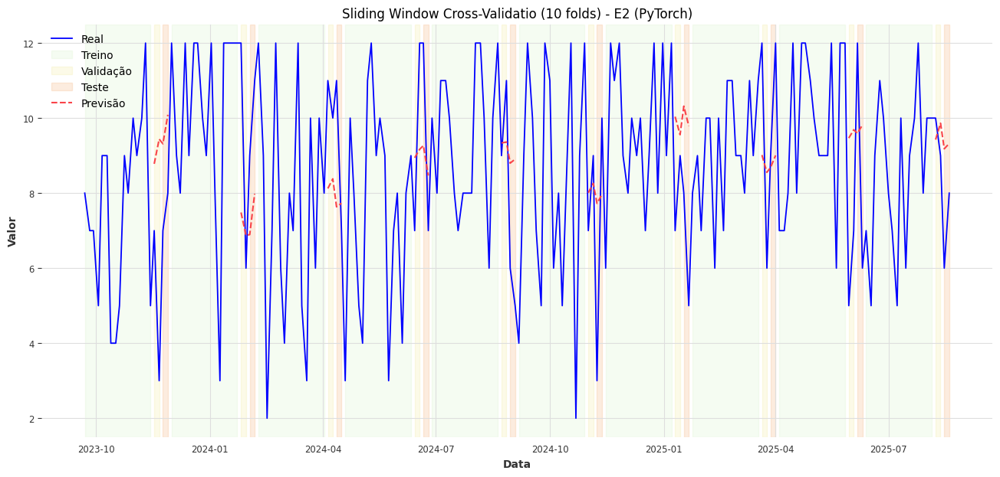

Métricas por janela:
 Janela Data Início   Data Fim
      1  2023-09-22 2023-11-28
      2  2023-12-01 2024-02-06
      3  2024-02-09 2024-04-16
      4  2024-04-19 2024-06-25
      5  2024-06-28 2024-09-03
      6  2024-09-06 2024-11-12
      7  2024-11-15 2025-01-21
      8  2025-01-24 2025-04-01
      9  2025-04-04 2025-06-10
     10  2025-06-13 2025-08-19

Tempo total de execução: 2.46 segundos


In [21]:
import numpy as np
import torch
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import time
from tqdm import tqdm
import pandas as pd

# Função SMAPE corrigida (já estava quase perfeita)
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    # Evitar divisão por zero
    denominator = np.where(denominator == 0, 1, denominator)
    return np.mean(numerator / denominator) * 100

def prever_com_rolling_pytorch(serie, nome_serie_curto, seq_length=12, n_epochs=5, usar_hibrido=True, model_path="modelo_temporario.pth"):
    serie = serie.dropna()
    total_len = len(serie)
    n_splits = 10
    tam_janela = total_len // n_splits

    resultados = []

    cores = {'train': '#d0f0c0', 'val': '#f0e68c', 'test': '#f4a460'}

    plt.figure(figsize=(16, 7))
    plt.plot(serie, label='Real', color='blue')

    start_time = time.time()

    for i in tqdm(range(n_splits), desc="Janela de previsão"):
        inicio = i * tam_janela
        fim = inicio + tam_janela if i < n_splits - 1 else total_len

        dados = serie.iloc[inicio:fim]
        if len(dados) < seq_length + 3:
            continue

        n_train = int(0.8 * len(dados))
        n_val = int(0.10 * len(dados))
        n_test = len(dados) - n_train - n_val

        treino = dados.iloc[:n_train]
        val = dados.iloc[n_train:n_train + n_val]
        teste = dados.iloc[n_train + n_val:]

        # Demarcação das zonas no gráfico (só na primeira janela adiciona legendas)
        plt.axvspan(treino.index[0], treino.index[-1], color=cores['train'], alpha=0.2, label='Treino' if i == 0 else "")
        plt.axvspan(val.index[0], val.index[-1], color=cores['val'], alpha=0.2, label='Validação' if i == 0 else "")
        plt.axvspan(teste.index[0], teste.index[-1], color=cores['test'], alpha=0.2, label='Teste' if i == 0 else "")

        # Escalar só com treino
        scaler = MinMaxScaler()
        scaler.fit(treino.values.reshape(-1, 1))
        dados_scaled = scaler.transform(dados.values.reshape(-1, 1)).flatten()

        # Preparar dados de treino e validação (tensors PyTorch)
        def criar_dataset(dados_scaled, inicio, fim):
            X, y = [], []
            for j in range(inicio, fim):
                X.append(dados_scaled[j - seq_length:j])
                y.append(dados_scaled[j])
            X = np.array(X).reshape(-1, seq_length, 1)
            y = np.array(y).reshape(-1, 1)
            return torch.tensor(X, dtype=torch.float32).to(device), torch.tensor(y, dtype=torch.float32).to(device)

        X_train, y_train = criar_dataset(dados_scaled, seq_length, n_train)
        X_val, y_val = criar_dataset(dados_scaled, n_train + seq_length, n_train + n_val)

        # Criar modelo PyTorch
        model = TemporalCNN(seq_length, usar_hibrido=usar_hibrido).to(device)

        # Treinar modelo (presumindo que treinar_modelo retorna o que foi indicado)
        model, train_losses, val_losses, train_maes, val_maes, val_smapes, tempos_por_epoca, tempo_total_epoca = treinar_modelo(
            model, X_train, y_train, X_val, y_val,
            epochs=n_epochs,
            batch_size=batch_size,
            patience_es=patience_es,
            factor=factor,
            patience_lr=patience_lr,
            min_lr=min_lr,
            model_path=model_path
        )

        # Fazer previsões em validação + teste
        preds = []
        reais = []

        start_pred = n_train
        end_pred = len(dados)

        model.eval()
        with torch.no_grad():
            for j in range(start_pred, end_pred):
                seq = dados_scaled[j - seq_length:j]
                seq_tensor = torch.tensor(seq.reshape(1, seq_length, 1), dtype=torch.float32).to(device)
                pred_scaled = model(seq_tensor).cpu().numpy()[0, 0]
                pred = scaler.inverse_transform([[pred_scaled]])[0, 0]
                real = dados.iloc[j]
                preds.append(pred)
                reais.append(real)

        preds = np.array(preds)
        reais = np.array(reais)

        # Plotar previsões da janela atual
        plt.plot(dados.index[start_pred:end_pred], preds,
                 label='Previsão' if i == 0 else "",
                 color='#f94449',
                 linestyle='--',
                 linewidth=1.5)

        resultados.append({
            'Janela': i + 1,
            'Data Início': dados.index[0],
            'Data Fim': dados.index[-1],
        })

    end_time = time.time()
    tempo_total = end_time - start_time

    plt.title(f'Sliding Window Cross-Validatio (10 folds) - {nome_serie_curto} (PyTorch)')
    plt.xlabel('Data')
    plt.ylabel('Valor')
    plt.legend()
    plt.grid(True)
    plt.show()

    resultados_df = pd.DataFrame(resultados)
    print("Métricas por janela:")
    print(resultados_df.to_string(index=False))
    print(f"\nTempo total de execução: {tempo_total:.2f} segundos")

    return resultados_df

# Exemplo de chamada da função
os.makedirs('temp', exist_ok=True)
for idx, serie in enumerate(df.columns, 1):
    try:
        model_path = f"temp/modelo_temporario_{serie}.pth"
        torch.save(model.state_dict(), model_path)
        print(f"\n{'='*50}")
        print(f"🚀 Processando a série {idx}/{len(df.columns)}: {df[serie].name}")
        
        prever_com_rolling_pytorch(df[serie], 
                                  df[serie].name,
                                  seq_length=12,
                                  n_epochs=50,
                                  usar_hibrido=True,
                                  model_path=model_path)

    except ValueError as ve:
        print(f"❌ Série {df[serie].name} ignorada - {str(ve)}")
    except Exception as e:
        print(f"❌ Erro inesperado na série {df[serie].name}: {str(e)}")
        continue


🚀 Processando a série 1/7: N1

🔄 Treinando modelo PyTorch hibrido para: N1


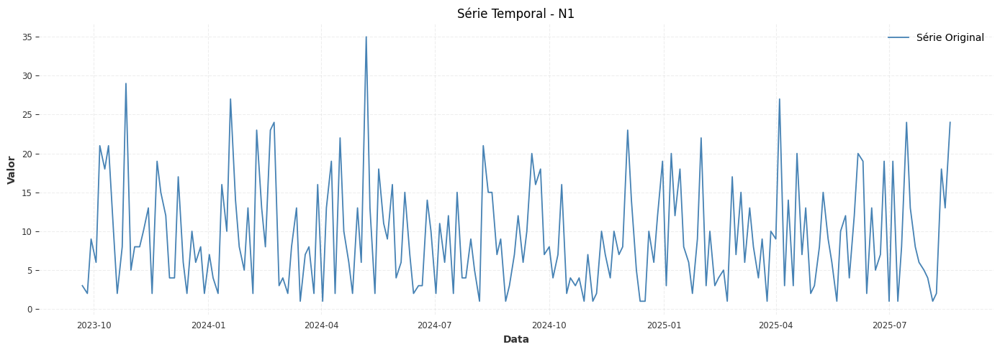

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.058708 | Val Loss: 0.039073 | Val MAE: 0.162887 | Val SMAPE: 85.47% | Tempo: 0.05s
Epoch 2/100 | Train Loss: 0.059467 | Val Loss: 0.039457 | Val MAE: 0.164142 | Val SMAPE: 71.76% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.046565 | Val Loss: 0.027873 | Val MAE: 0.142513 | Val SMAPE: 69.60% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.050705 | Val Loss: 0.028808 | Val MAE: 0.144534 | Val SMAPE: 75.73% | Tempo: 0.04s
Epoch 5/100 | Train Loss: 0.047641 | Val Loss: 0.027212 | Val MAE: 0.142397 | Val SMAPE: 74.87% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.054228 | Val Loss: 0.029015 | Val MAE: 0.145511 | Val SMAPE: 77.15% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.051278 | Val Loss: 0.025474 | Val MAE: 0.138318 | Val SMAPE: 71.55% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.046641 | Val Loss: 0.027402 | Val MAE: 0.141484 | Val SMAPE: 74.08% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.039204 | Val Loss: 0.029042 | Val MAE: 0.144669 | Val SMAPE: 75.82% | Tempo: 0.04s
E

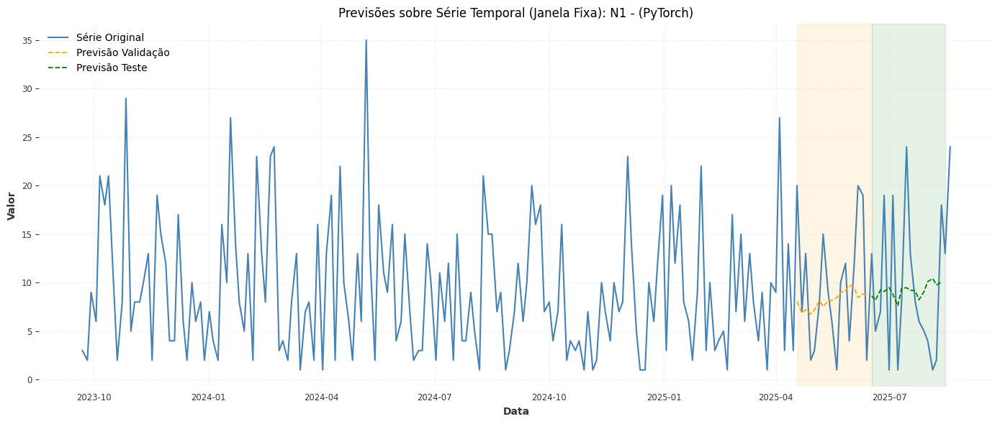

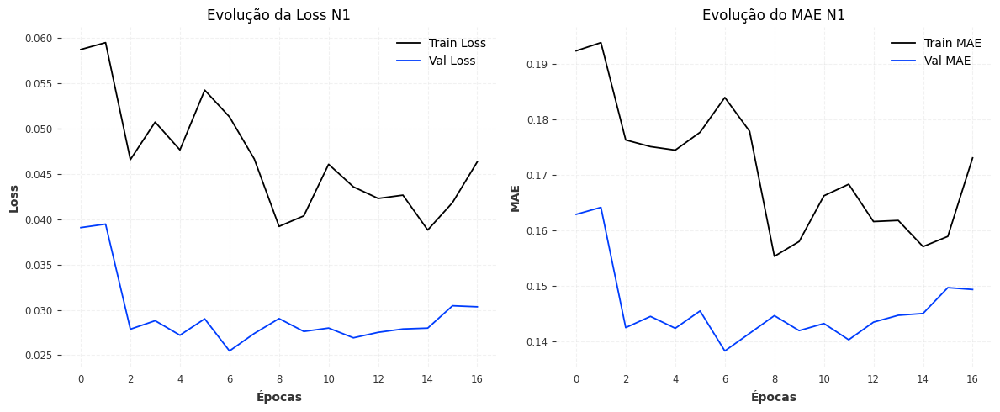

Modelo salvo em: modelos_pytorch/modelo_N1.pth

🚀 Processando a série 2/7: N2

🔄 Treinando modelo PyTorch hibrido para: N2


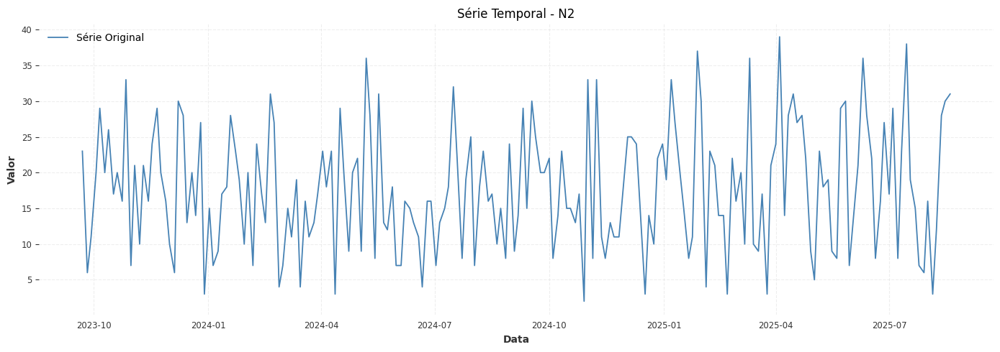

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.211366 | Val Loss: 0.071943 | Val MAE: 0.229962 | Val SMAPE: 59.86% | Tempo: 0.04s
Epoch 2/100 | Train Loss: 0.085723 | Val Loss: 0.102133 | Val MAE: 0.252762 | Val SMAPE: 65.76% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.073632 | Val Loss: 0.071054 | Val MAE: 0.222546 | Val SMAPE: 57.97% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.069975 | Val Loss: 0.061302 | Val MAE: 0.215651 | Val SMAPE: 55.78% | Tempo: 0.05s
Epoch 5/100 | Train Loss: 0.068159 | Val Loss: 0.076407 | Val MAE: 0.237082 | Val SMAPE: 62.27% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.068694 | Val Loss: 0.070479 | Val MAE: 0.230228 | Val SMAPE: 60.21% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.063126 | Val Loss: 0.072291 | Val MAE: 0.231077 | Val SMAPE: 60.42% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.056111 | Val Loss: 0.069400 | Val MAE: 0.228369 | Val SMAPE: 59.61% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.068053 | Val Loss: 0.064226 | Val MAE: 0.223460 | Val SMAPE: 57.73% | Tempo: 0.04s
E

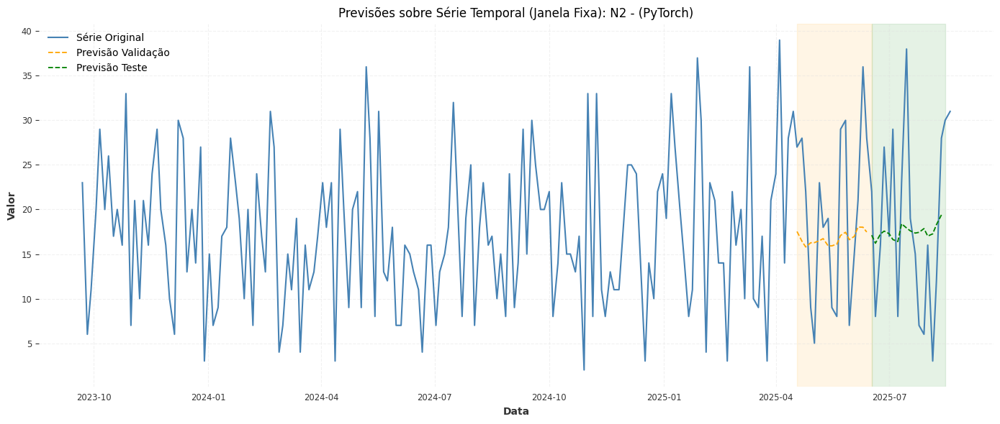

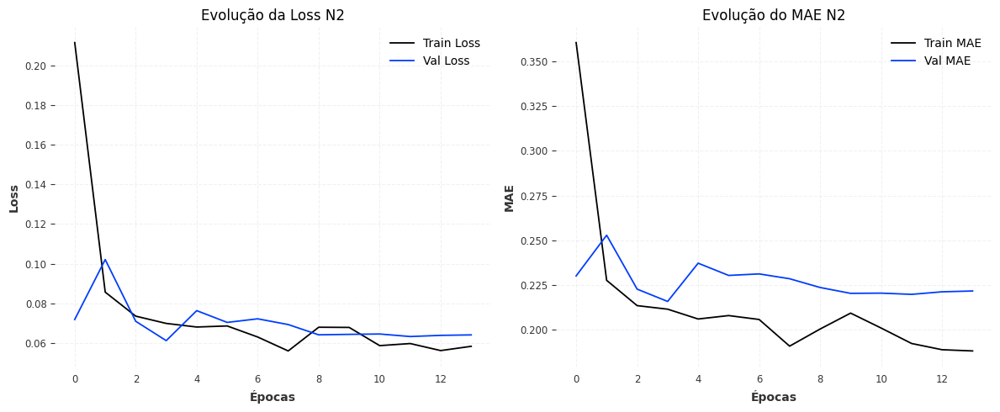

Modelo salvo em: modelos_pytorch/modelo_N2.pth

🚀 Processando a série 3/7: N3

🔄 Treinando modelo PyTorch hibrido para: N3


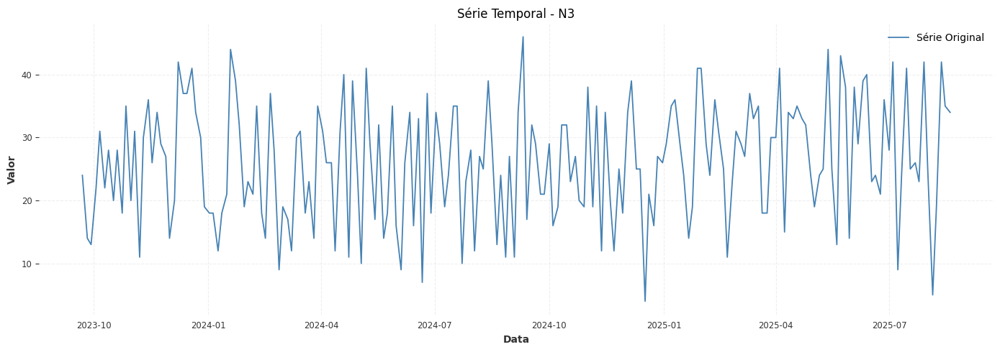

Epoch 1/100 | Train Loss: 0.160641 | Val Loss: 0.110670 | Val MAE: 0.273766 | Val SMAPE: 52.29% | Tempo: 0.04s

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(



Epoch 2/100 | Train Loss: 0.091140 | Val Loss: 0.100407 | Val MAE: 0.252665 | Val SMAPE: 47.01% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.093499 | Val Loss: 0.111544 | Val MAE: 0.274385 | Val SMAPE: 52.55% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.067834 | Val Loss: 0.069059 | Val MAE: 0.199733 | Val SMAPE: 35.36% | Tempo: 0.05s
Epoch 5/100 | Train Loss: 0.056935 | Val Loss: 0.098465 | Val MAE: 0.254117 | Val SMAPE: 47.49% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.067932 | Val Loss: 0.117550 | Val MAE: 0.285157 | Val SMAPE: 55.44% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.055054 | Val Loss: 0.093345 | Val MAE: 0.251119 | Val SMAPE: 47.04% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.056141 | Val Loss: 0.109170 | Val MAE: 0.273634 | Val SMAPE: 52.88% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.050187 | Val Loss: 0.156707 | Val MAE: 0.336513 | Val SMAPE: 71.06% | Tempo: 0.03s
Epoch 10/100 | Train Loss: 0.053167 | Val Loss: 0.098705 | Val MAE: 0.256789 | Val SMAPE: 49.29% | Tempo: 0.04s

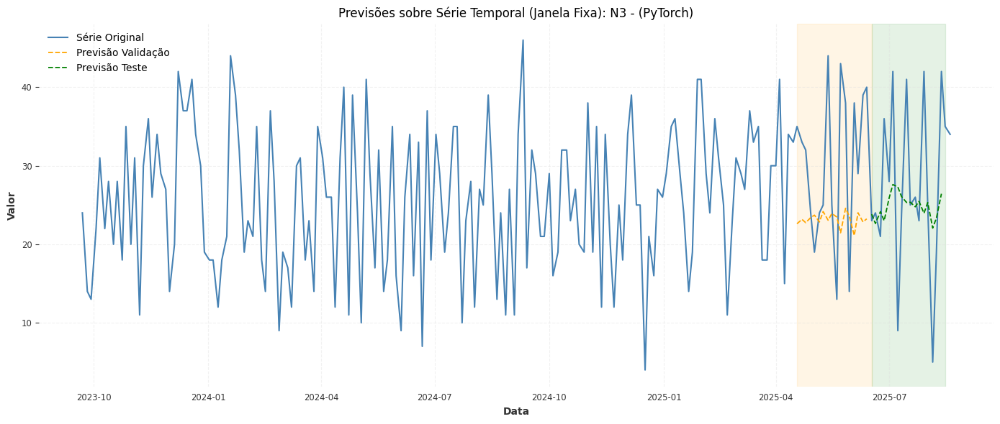

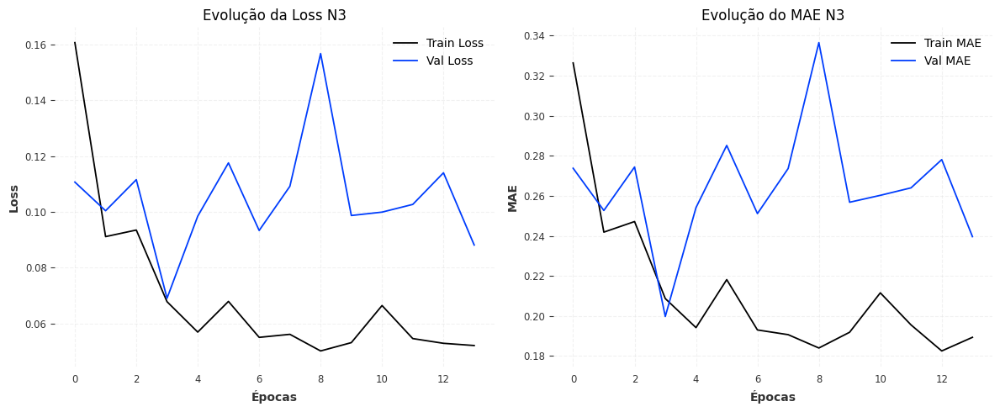

Modelo salvo em: modelos_pytorch/modelo_N3.pth

🚀 Processando a série 4/7: N4

🔄 Treinando modelo PyTorch hibrido para: N4


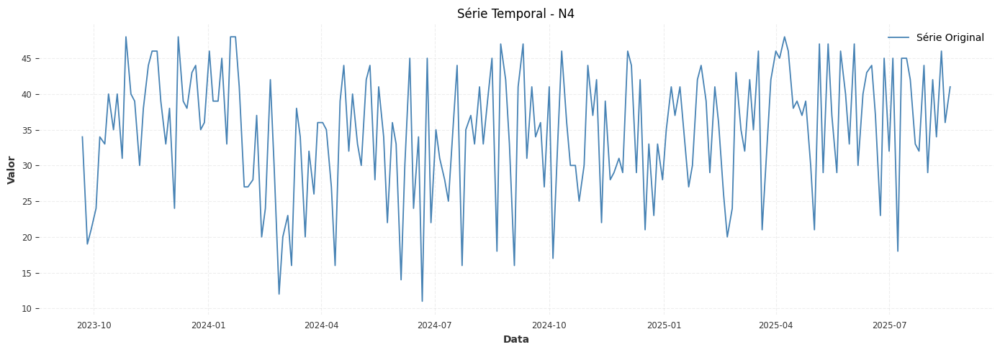

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.294011 | Val Loss: 0.067777 | Val MAE: 0.202671 | Val SMAPE: 28.60% | Tempo: 0.04s
Epoch 2/100 | Train Loss: 0.086799 | Val Loss: 0.050818 | Val MAE: 0.195995 | Val SMAPE: 29.01% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.079780 | Val Loss: 0.091738 | Val MAE: 0.255674 | Val SMAPE: 39.48% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.067538 | Val Loss: 0.075130 | Val MAE: 0.235177 | Val SMAPE: 35.65% | Tempo: 0.04s
Epoch 5/100 | Train Loss: 0.080934 | Val Loss: 0.080644 | Val MAE: 0.240807 | Val SMAPE: 36.64% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.070684 | Val Loss: 0.068727 | Val MAE: 0.224453 | Val SMAPE: 33.67% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.067370 | Val Loss: 0.058355 | Val MAE: 0.208383 | Val SMAPE: 30.86% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.059479 | Val Loss: 0.058214 | Val MAE: 0.207186 | Val SMAPE: 30.70% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.066118 | Val Loss: 0.060483 | Val MAE: 0.211049 | Val SMAPE: 31.35% | Tempo: 0.04s
E

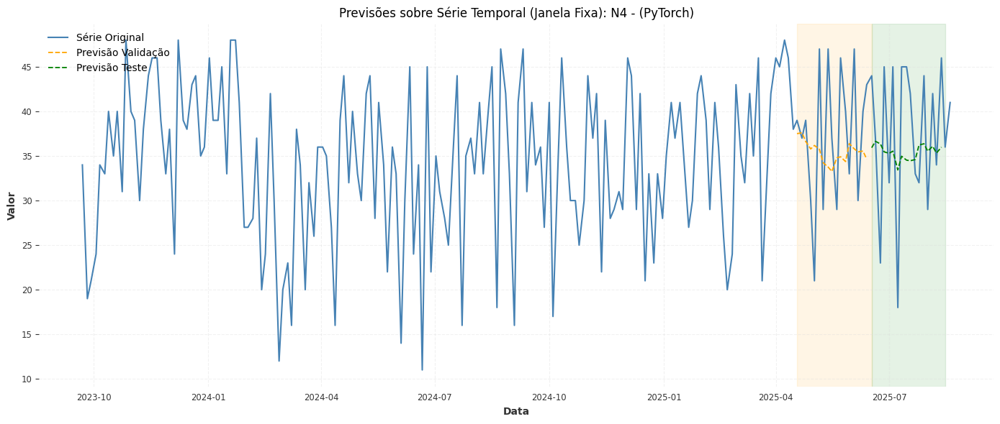

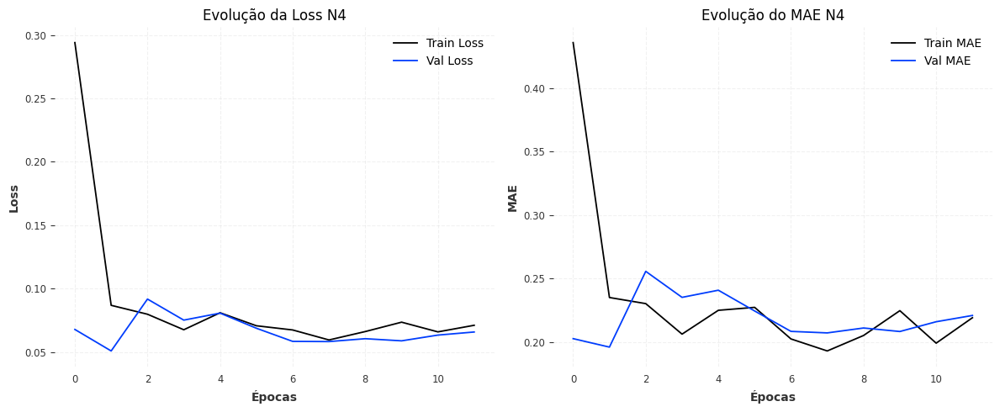

Modelo salvo em: modelos_pytorch/modelo_N4.pth

🚀 Processando a série 5/7: N5

🔄 Treinando modelo PyTorch hibrido para: N5


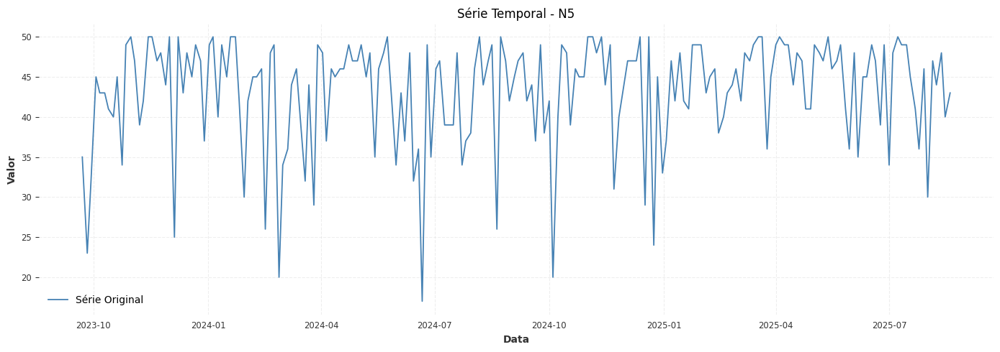

Epoch 1/100 | Train Loss: 0.314450 | Val Loss: 0.221885 | Val MAE: 0.451039 | Val SMAPE: 70.90% | Tempo: 0.04s

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(



Epoch 2/100 | Train Loss: 0.076476 | Val Loss: 0.141086 | Val MAE: 0.351339 | Val SMAPE: 50.70% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.066873 | Val Loss: 0.136834 | Val MAE: 0.345724 | Val SMAPE: 49.66% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.071869 | Val Loss: 0.086940 | Val MAE: 0.266576 | Val SMAPE: 35.82% | Tempo: 0.04s
Epoch 5/100 | Train Loss: 0.065354 | Val Loss: 0.033292 | Val MAE: 0.162808 | Val SMAPE: 20.37% | Tempo: 0.05s
Epoch 6/100 | Train Loss: 0.053936 | Val Loss: 0.029422 | Val MAE: 0.155703 | Val SMAPE: 19.41% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.069084 | Val Loss: 0.049214 | Val MAE: 0.200611 | Val SMAPE: 25.70% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.052513 | Val Loss: 0.031364 | Val MAE: 0.160837 | Val SMAPE: 20.11% | Tempo: 0.05s
Epoch 9/100 | Train Loss: 0.072593 | Val Loss: 0.023497 | Val MAE: 0.143953 | Val SMAPE: 17.86% | Tempo: 0.04s
Epoch 10/100 | Train Loss: 0.059105 | Val Loss: 0.045694 | Val MAE: 0.191437 | Val SMAPE: 24.40% | Tempo: 0.04s

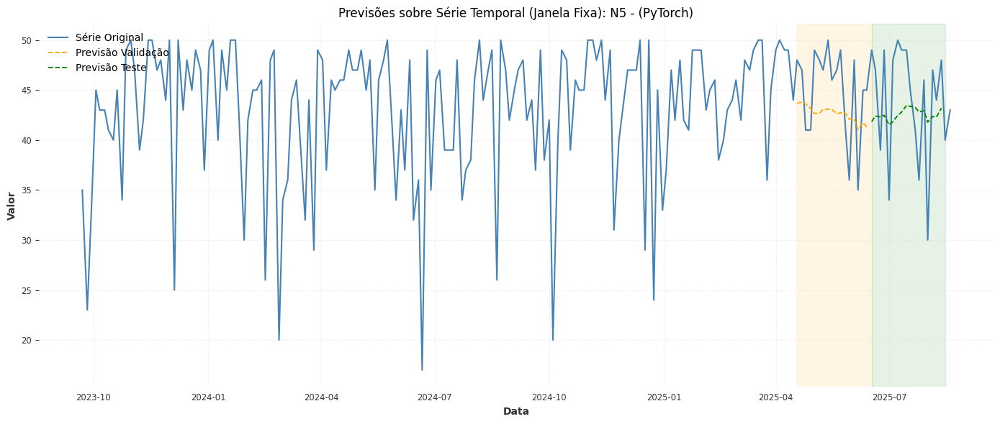

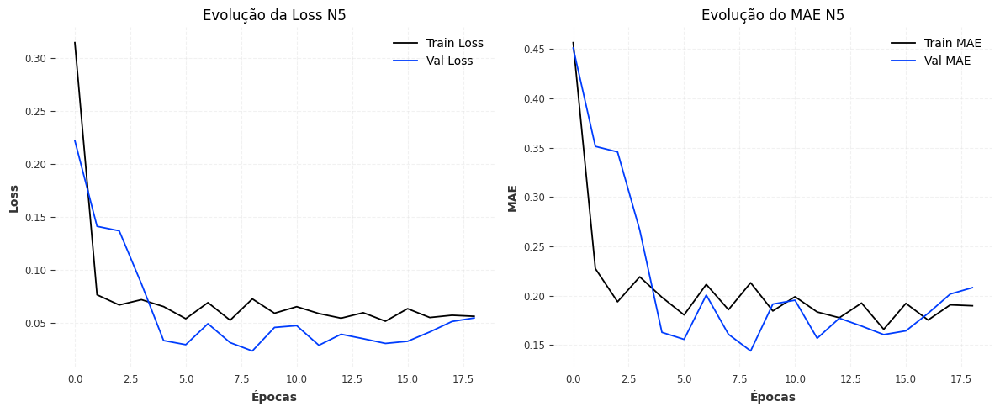

Modelo salvo em: modelos_pytorch/modelo_N5.pth

🚀 Processando a série 6/7: E1

🔄 Treinando modelo PyTorch hibrido para: E1


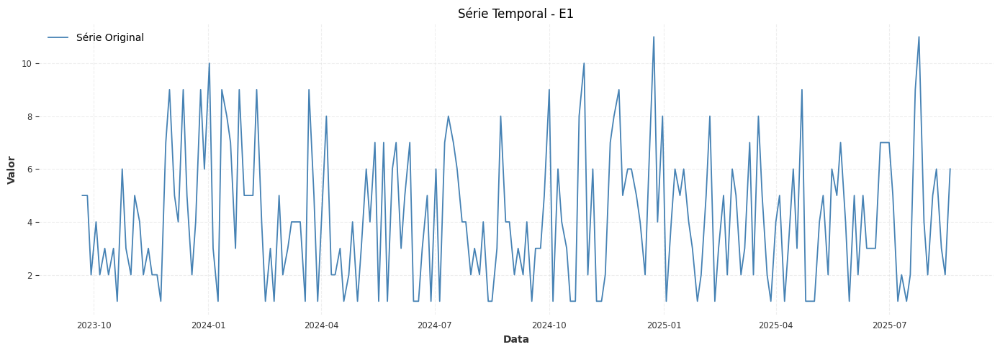

Epoch 1/100 | Train Loss: 0.150715 | Val Loss: 0.045769 | Val MAE: 0.178996 | Val SMAPE: 109.16% | Tempo: 0.04s

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(



Epoch 2/100 | Train Loss: 0.097898 | Val Loss: 0.034972 | Val MAE: 0.156984 | Val SMAPE: 89.97% | Tempo: 0.04s
Epoch 3/100 | Train Loss: 0.102192 | Val Loss: 0.036762 | Val MAE: 0.165980 | Val SMAPE: 81.85% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.079859 | Val Loss: 0.041330 | Val MAE: 0.173357 | Val SMAPE: 81.10% | Tempo: 0.04s
Epoch 5/100 | Train Loss: 0.085733 | Val Loss: 0.037978 | Val MAE: 0.168426 | Val SMAPE: 81.87% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.084511 | Val Loss: 0.037970 | Val MAE: 0.167659 | Val SMAPE: 82.53% | Tempo: 0.05s
Epoch 7/100 | Train Loss: 0.084931 | Val Loss: 0.056256 | Val MAE: 0.194730 | Val SMAPE: 81.09% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.079705 | Val Loss: 0.057399 | Val MAE: 0.196158 | Val SMAPE: 80.93% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.077757 | Val Loss: 0.052106 | Val MAE: 0.185947 | Val SMAPE: 79.64% | Tempo: 0.04s
Epoch 10/100 | Train Loss: 0.068121 | Val Loss: 0.045209 | Val MAE: 0.174159 | Val SMAPE: 78.60% | Tempo: 0.04s

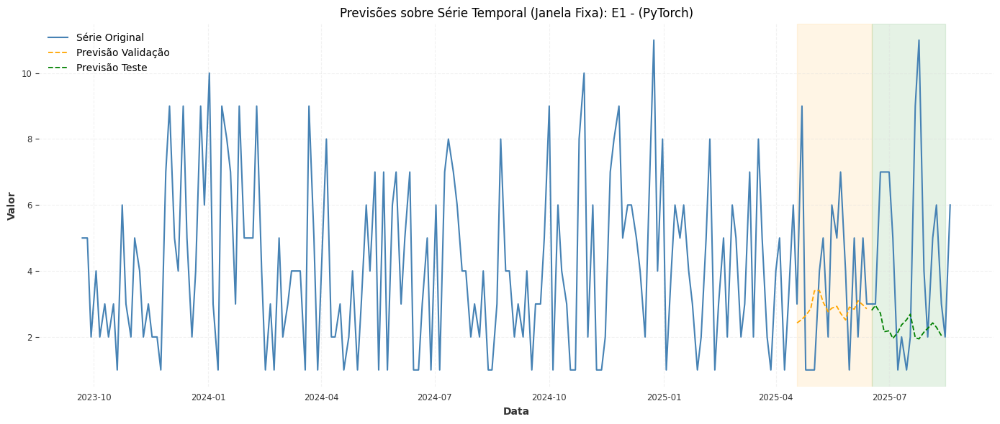

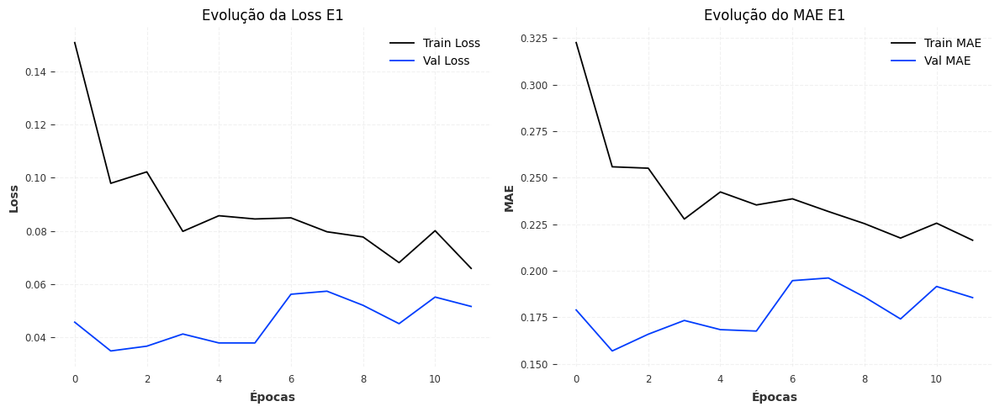

Modelo salvo em: modelos_pytorch/modelo_E1.pth

🚀 Processando a série 7/7: E2

🔄 Treinando modelo PyTorch hibrido para: E2


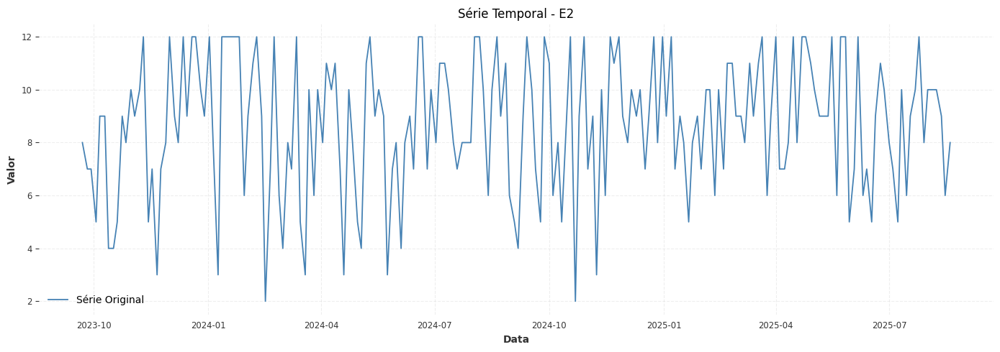

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\torch\nn\modules\rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1
  warnings.warn(


Epoch 1/100 | Train Loss: 0.166176 | Val Loss: 0.065662 | Val MAE: 0.228270 | Val SMAPE: 34.96% | Tempo: 0.05s
Epoch 2/100 | Train Loss: 0.103015 | Val Loss: 0.073904 | Val MAE: 0.245122 | Val SMAPE: 37.73% | Tempo: 0.05s
Epoch 3/100 | Train Loss: 0.104002 | Val Loss: 0.094316 | Val MAE: 0.262393 | Val SMAPE: 40.63% | Tempo: 0.04s
Epoch 4/100 | Train Loss: 0.093027 | Val Loss: 0.057197 | Val MAE: 0.205004 | Val SMAPE: 31.56% | Tempo: 0.04s
Epoch 5/100 | Train Loss: 0.090756 | Val Loss: 0.060692 | Val MAE: 0.210743 | Val SMAPE: 32.34% | Tempo: 0.04s
Epoch 6/100 | Train Loss: 0.103375 | Val Loss: 0.061509 | Val MAE: 0.212827 | Val SMAPE: 32.62% | Tempo: 0.04s
Epoch 7/100 | Train Loss: 0.086252 | Val Loss: 0.061832 | Val MAE: 0.217360 | Val SMAPE: 33.32% | Tempo: 0.04s
Epoch 8/100 | Train Loss: 0.072224 | Val Loss: 0.064510 | Val MAE: 0.224577 | Val SMAPE: 34.44% | Tempo: 0.04s
Epoch 9/100 | Train Loss: 0.090745 | Val Loss: 0.059879 | Val MAE: 0.208754 | Val SMAPE: 32.05% | Tempo: 0.04s
E

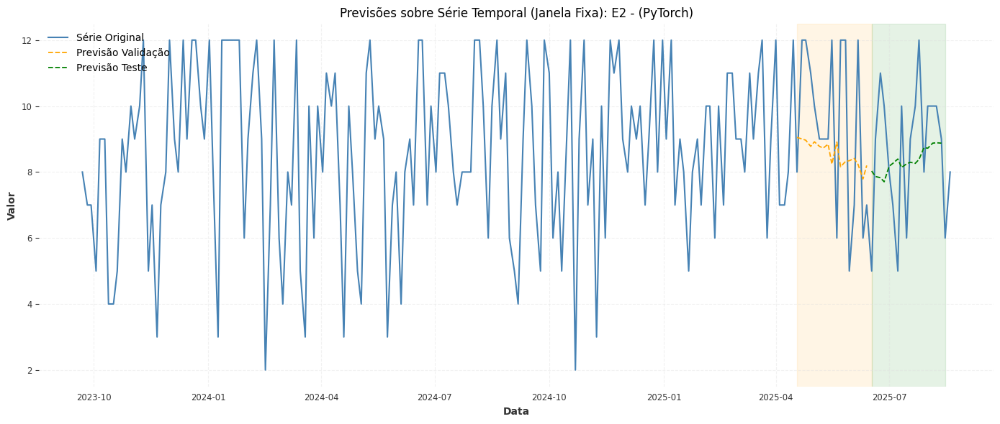

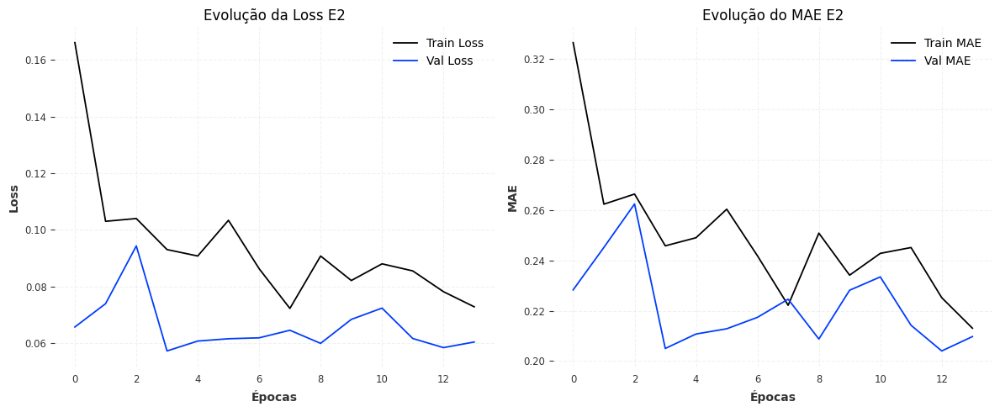

Modelo salvo em: modelos_pytorch/modelo_E2.pth


In [22]:

for idx, serie in enumerate(df.columns, 1):
    try:
        print(f"\n{'='*50}")
        print(f"🚀 Processando a série {idx}/{len(df.columns)}: {df[serie].name}")
        
        # Rodar com parâmetros padrão
        model, history = treinar_para_serie_pytorch(df[serie], seq_length=30, usar_hibrido=True, serie_name = df[serie].name)
        
        # Salvar o modelo com nome descritivo
        nome_arquivo = f"modelos_pytorch/modelo_{df[serie].name.replace(' ', '_').replace('/', '_')[:50]}.pth"
        torch.save(model.state_dict(), nome_arquivo)
        print(f"Modelo salvo em: {nome_arquivo}")
        
    except ValueError as ve:
        print(f"❌ Série {df[serie].name} ignorada - {str(ve)}")
    except Exception as e:
        print(f"❌ Erro inesperado na série {df[serie].name}: {str(e)}")
        continue

## 3. Darts - TCN

In [7]:
import os
import torch
import matplotlib.pyplot as plt
from darts import TimeSeries
from darts.models import TCNModel
from darts.metrics import mae, rmse, mape, smape
from darts.utils.likelihood_models import GaussianLikelihood
import numpy as np
from darts.dataprocessing.transformers import Scaler
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import Callback

# Verificar dispositivo
torch.manual_seed(42)
torch.set_float32_matmul_precision('medium')
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🔧 A usar dispositivo: {device}")

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\fs\__init__.py:4: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  __import__("pkg_resources").declare_namespace(__name__)  # type: ignore


🔧 A usar dispositivo: cuda


In [49]:
from pytorch_lightning.callbacks import Callback

class LossRecorder(Callback):
    def __init__(self):
        self.train_loss_history = []
        self.val_loss_history = []

    def on_train_epoch_end(self, trainer, pl_module):
        train_loss = trainer.callback_metrics.get("train_loss")
        val_loss = trainer.callback_metrics.get("val_loss")

        self.train_loss_history.append(train_loss.item() if train_loss is not None else None)
        self.val_loss_history.append(val_loss.item() if val_loss is not None else None)

class EarlyStopping(Callback):
    def __init__(self, monitor="val_loss", patience=10, min_delta=1e-5, mode="min"):
        super().__init__()
        self.monitor = monitor
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_score = None
        self.wait_count = 0
        self.stopped_epoch = 0
        self.should_stop = False

    def on_validation_end(self, trainer, pl_module):
        current = trainer.callback_metrics.get(self.monitor)

        if current is None:
            return

        current = current.item()
        
        # Inicializa melhor score
        if self.best_score is None:
            self.best_score = current
            return

        if self._is_improvement(current, self.best_score):
            self.best_score = current
            self.wait_count = 0
        else:
            self.wait_count += 1
            if self.wait_count >= self.patience:
                self.stopped_epoch = trainer.current_epoch
                self.should_stop = True
                trainer.should_stop = True  # força o treino a parar

    def _is_improvement(self, current, best):
        if self.mode == "min":
            return current < best - self.min_delta
        else:
            return current > best + self.min_delta

class ReduceLROnPlateau:
    def __init__(self, optimizer, factor=0.1, patience=5, min_lr=1e-6, verbose=True):
        self.optimizer = optimizer
        self.factor = factor
        self.patience = patience
        self.min_lr = min_lr
        self.verbose = verbose
        self.best_loss = float('inf')
        self.num_bad_epochs = 0

    def __call__(self, val_loss):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.num_bad_epochs = 0
        else:
            self.num_bad_epochs += 1

        if self.num_bad_epochs >= self.patience:
            self._reduce_lr()
            self.num_bad_epochs = 0  # reset após reduzir

    def _reduce_lr(self):
        for param_group in self.optimizer.param_groups:
            old_lr = param_group['lr']
            new_lr = max(old_lr * self.factor, self.min_lr)
            if old_lr - new_lr > 1e-8:
                param_group['lr'] = new_lr
                if self.verbose:
                    print(f"🔻 Reduzida LR de {old_lr:.6f} para {new_lr:.6f} devido a estagnação na validação.")
            else:
                if self.verbose:
                    print(f"LR já está no mínimo {self.min_lr}, não reduzido.")


In [50]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(
    save_dir="modelos_pytorch/lightning_logs",
    name=f"tcn_logger",  # nome único por série
    version=None  # cria automaticamente versões sem conflito
)

#### 3.1. Janela Fixa (Fixed Window)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 1/7: N1
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 20: 100%|██████████| 4/4 [00:00<00:00, 34.98it/s, v_num=5, train_loss=0.0359, val_loss=0.0366]
⏱️ Tempo de execução: 2.80 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 51.58it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 85.43it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 22.55it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 84.77it/s] 
✅ Val MAE: 5.21 | RMSE: 6.57 | MAPE: 121.06% | SMAPE: 63.22%
✅ Test MAE: 6.42 | RMSE: 7.96 | MAPE: 176.79% | SMAPE: 75.77%


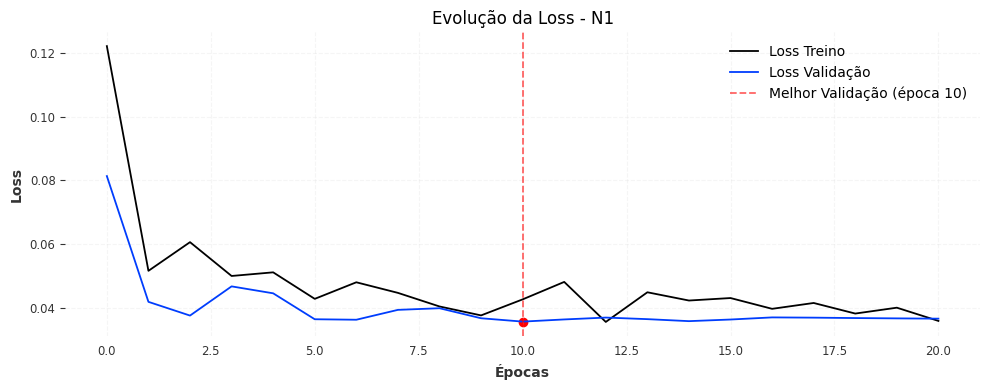

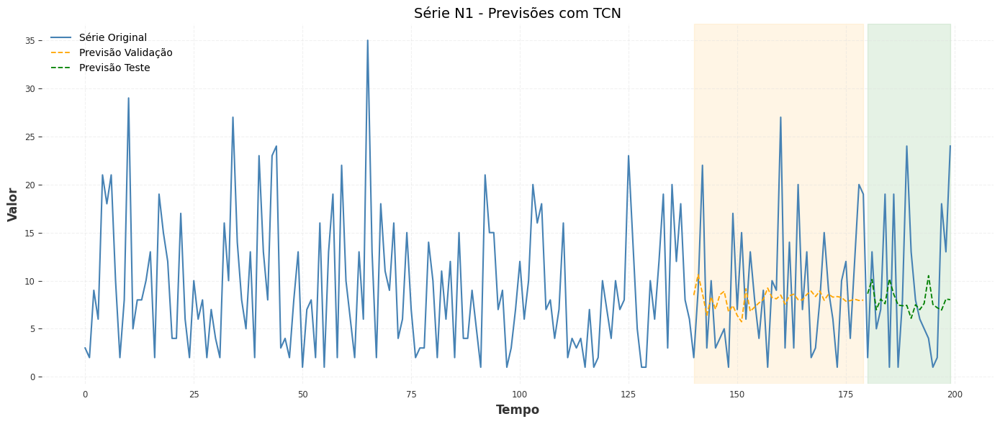

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 2/7: N2
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 13: 100%|██████████| 4/4 [00:00<00:00, 32.79it/s, v_num=5, train_loss=0.0429, val_loss=0.0874]
⏱️ Tempo de execução: 1.91 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 34.33it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.48it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 45.64it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 74.74it/s]
✅ Val MAE: 8.79 | RMSE: 10.45 | MAPE: 71.72% | SMAPE: 51.75%
✅ Test MAE: 8.75 | RMSE: 10.74 | MAPE: 66.87% | SMAPE: 51.53%


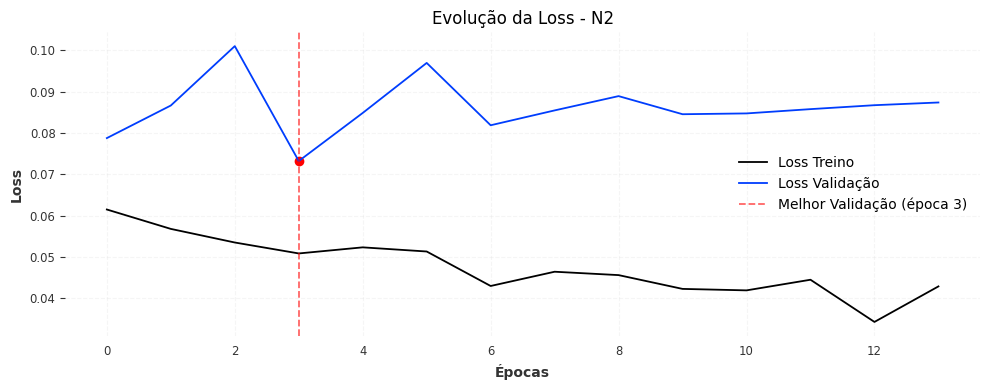

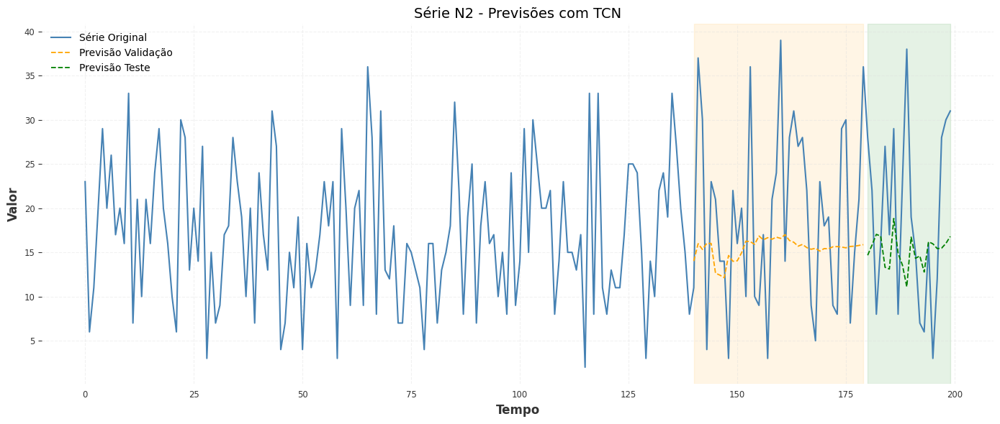

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 3/7: N3
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 10: 100%|██████████| 4/4 [00:00<00:00, 33.98it/s, v_num=5, train_loss=0.0514, val_loss=0.067]
⏱️ Tempo de execução: 1.44 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 41.42it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 74.53it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 30.78it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 90.19it/s]
✅ Val MAE: 9.47 | RMSE: 11.12 | MAPE: 32.31% | SMAPE: 35.39%
✅ Test MAE: 9.55 | RMSE: 11.91 | MAPE: 45.83% | SMAPE: 38.23%


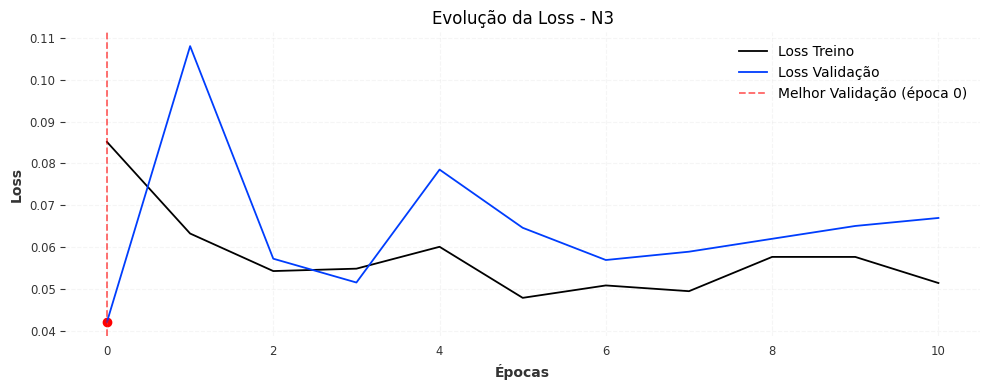

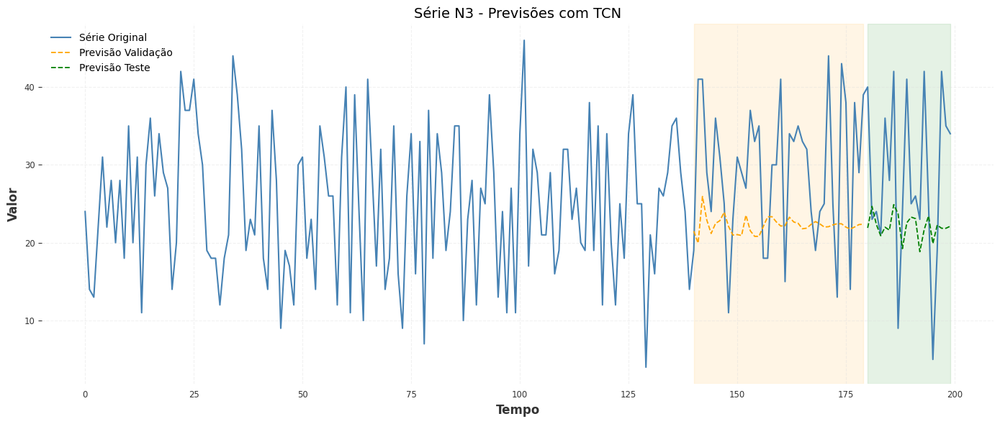

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 4/7: N4
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 11: 100%|██████████| 4/4 [00:00<00:00, 31.51it/s, v_num=5, train_loss=0.073, val_loss=0.0745] 
⏱️ Tempo de execução: 1.62 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 47.23it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.32it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 44.76it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 79.91it/s]
✅ Val MAE: 8.46 | RMSE: 9.83 | MAPE: 22.56% | SMAPE: 24.20%
✅ Test MAE: 9.40 | RMSE: 10.74 | MAPE: 24.68% | SMAPE: 26.98%


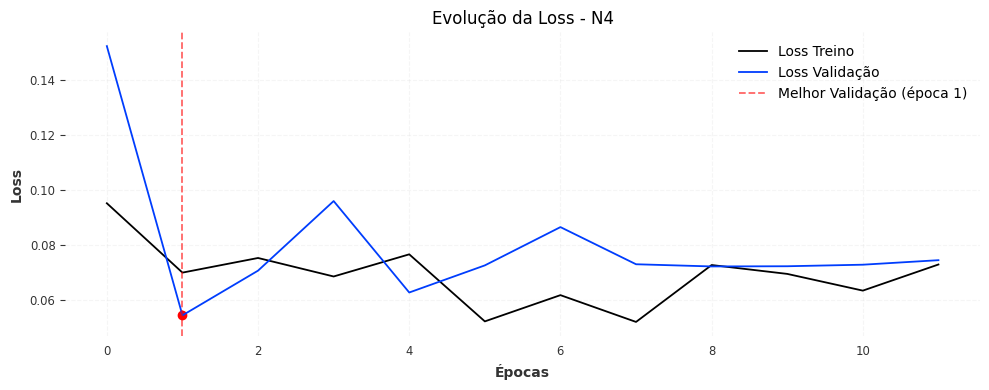

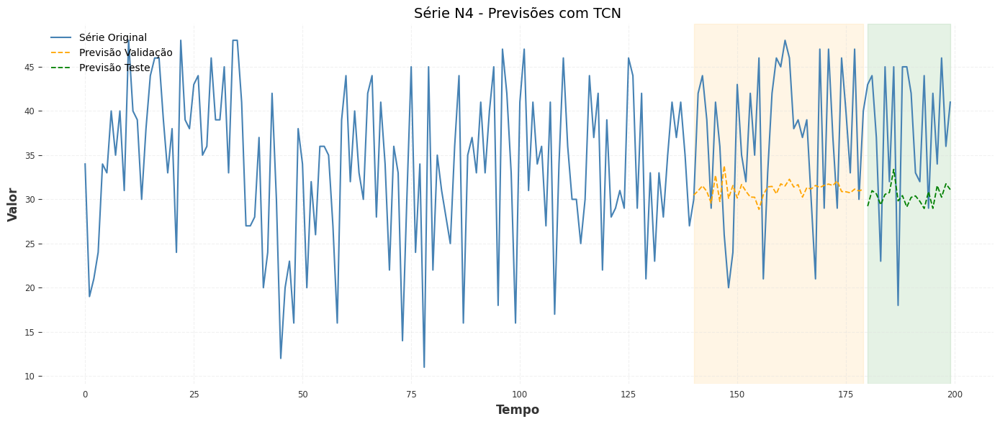

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 5/7: N5
                                                                           

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 12: 100%|██████████| 4/4 [00:00<00:00, 31.09it/s, v_num=5, train_loss=0.0513, val_loss=0.0452]
⏱️ Tempo de execução: 1.83 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 46.83it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 76.15it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 44.77it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 83.66it/s]
✅ Val MAE: 5.62 | RMSE: 6.38 | MAPE: 12.05% | SMAPE: 12.87%
✅ Test MAE: 6.29 | RMSE: 7.26 | MAPE: 14.28% | SMAPE: 14.92%


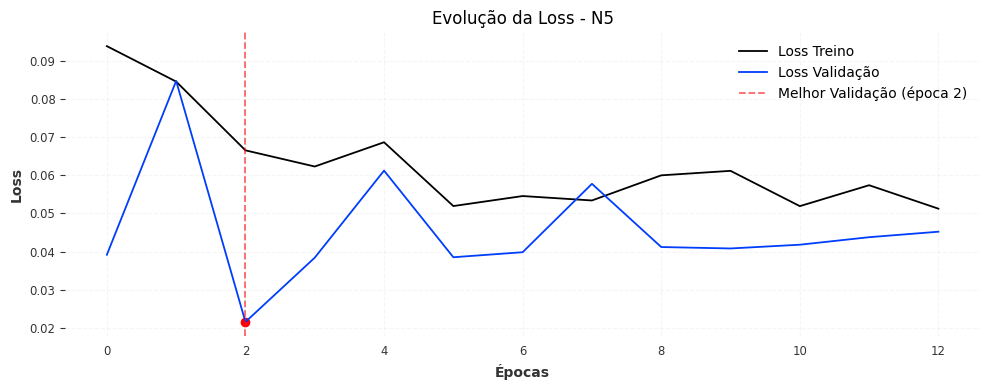

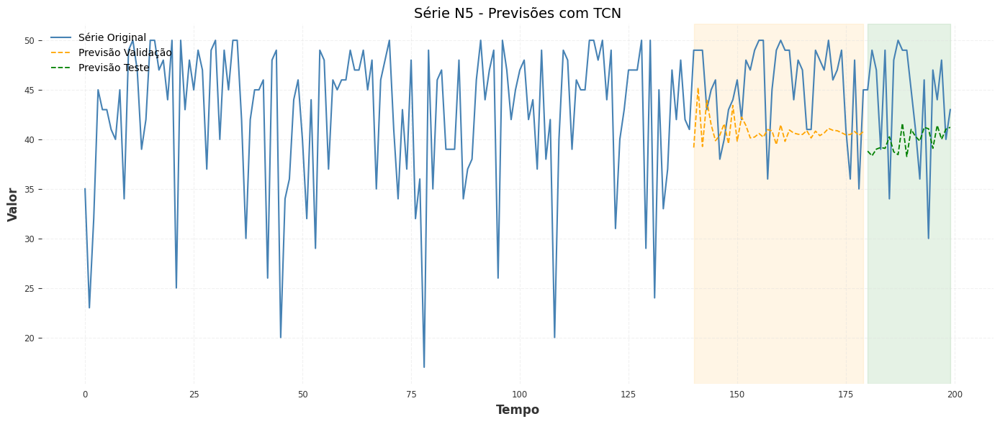

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 6/7: E1
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 20: 100%|██████████| 4/4 [00:00<00:00, 33.52it/s, v_num=5, train_loss=0.066, val_loss=0.0501] 
⏱️ Tempo de execução: 2.79 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 34.17it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 87.69it/s] 

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 40.97it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 71.35it/s]
✅ Val MAE: 2.01 | RMSE: 2.43 | MAPE: 95.75% | SMAPE: 56.96%
✅ Test MAE: 2.34 | RMSE: 2.86 | MAPE: 75.21% | SMAPE: 55.93%


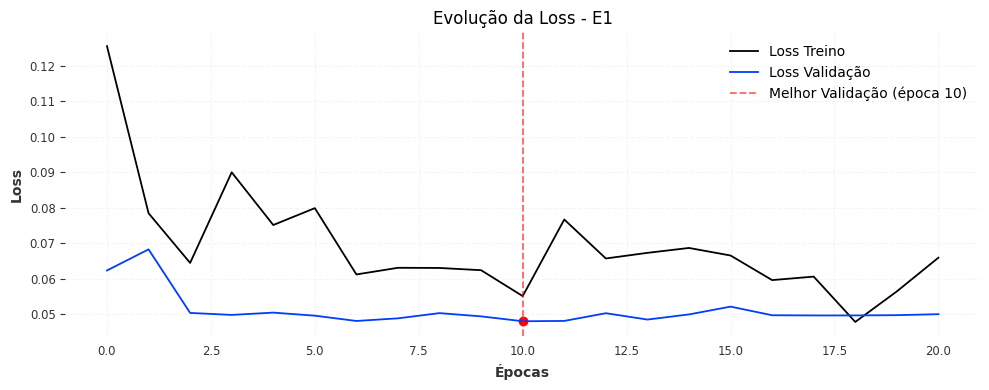

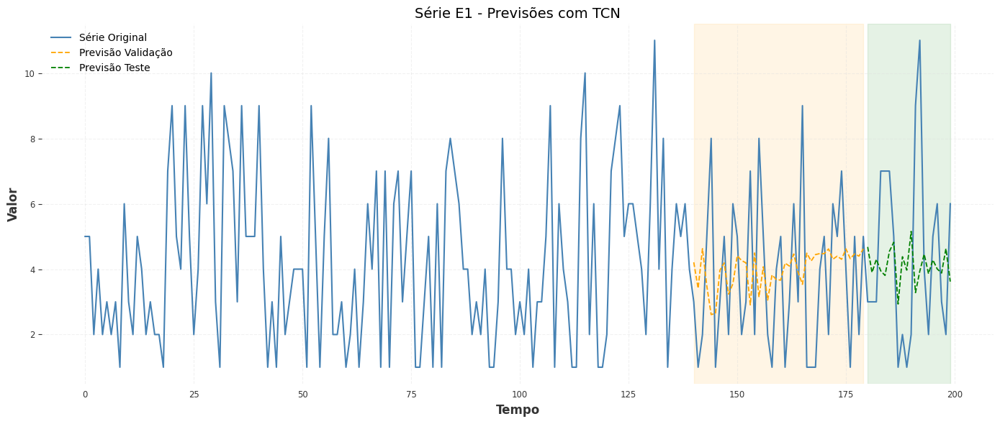

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | res_blocks      | ModuleList       | 174 K  | train
-------------------------------------------------------------
174 K     Trainable params
0         Non-trainable params
174 K     Total params
0.698     Total estimated model params size (MB)
96        Modules in train mode
0         Modules in eval mode



📊 Série 7/7: E2
                                                                            

c:\Users\diogo\Desktop\EuroMillions\.venv\Lib\site-packages\pytorch_lightning\loops\fit_loop.py:310: The number of training batches (4) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 14: 100%|██████████| 4/4 [00:00<00:00, 29.39it/s, v_num=5, train_loss=0.0747, val_loss=0.060] 
⏱️ Tempo de execução: 2.16 segundos


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 43.87it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 65.00it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 33.94it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 66.19it/s]
✅ Val MAE: 2.10 | RMSE: 2.45 | MAPE: 22.52% | SMAPE: 23.48%
✅ Test MAE: 1.77 | RMSE: 2.03 | MAPE: 22.32% | SMAPE: 21.67%


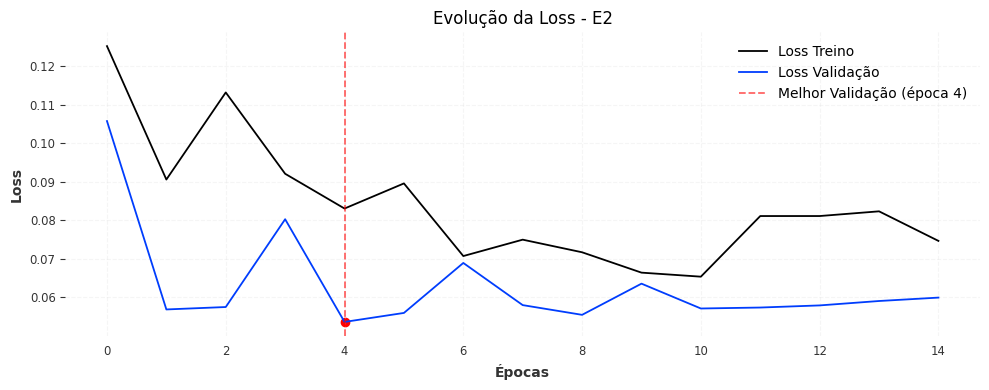

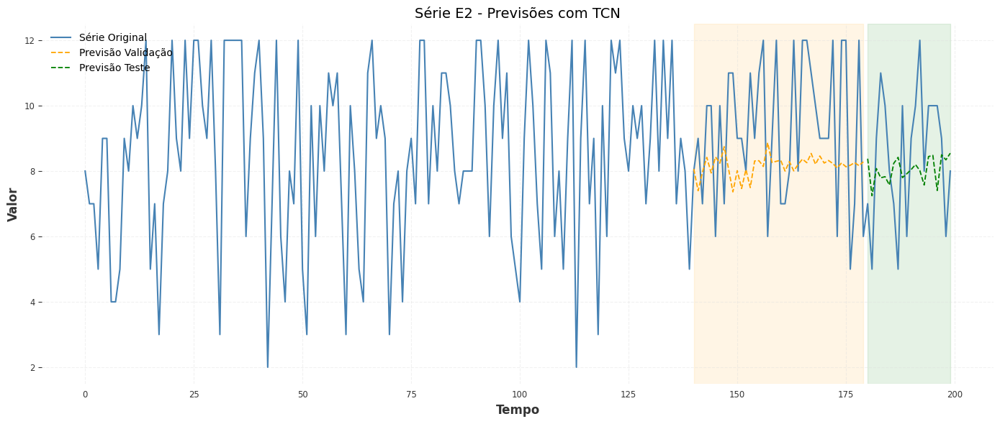


⏱️ Tempo total de execução: 14.54 segundos


,nome_serie,Frequência,Tempo de Treino (s),Épocas,Melhor Época,previsao_val,previsao_test,val_mae,val_rmse,val_mape,val_smape,test_mae,test_rmse,test_mape,test_smape
0,N1,None,2.80,21,10,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",5.214091,6.573716,121.063400,63.218475,6.422282,7.957320,176.786835,75.768555
1,N2,None,1.91,14,3,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",8.789468,10.449755,71.715019,51.752502,8.748729,10.741662,66.873306,51.534679
2,N3,None,1.44,11,0,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",9.469289,11.118420,32.307625,35.392712,9.547377,11.913623,45.832821,38.232780
3,N4,None,1.62,12,1,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",8.458986,9.831002,22.560858,24.203144,9.398218,10.744587,24.677845,26.984186
4,N5,None,1.83,13,2,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",5.624232,6.380095,12.049350,12.871988,6.288798,7.264896,14.276901,14.924832
5,E1,None,2.79,21,10,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",2.010861,2.434174,95.750145,56.962219,2.344410,2.855424,75.210838,55.930809
6,E2,None,2.16,15,4,"(((<TimeSeries (DataArray) (time: 1, component...","(((<TimeSeries (DataArray) (time: 1, component...",2.096053,2.452921,22.519451,23.484507,1.767879,2.030182,22.321751,21.666220


In [51]:
from darts.models import TCNModel
from darts.dataprocessing.transformers import Scaler
from darts import TimeSeries
from darts.metrics import mae, rmse, mape, smape

import numpy as np
import matplotlib.pyplot as plt
import torch
import os

# Criar diretório para guardar os modelos treinados
os.makedirs('modelos_pytorch', exist_ok=True)

# Logger para TensorBoard
logger = TensorBoardLogger(save_dir="tb_logs", name="TCNModel")

# Listas para resultados e tempos de execução
resultados = []
tempos_execucao = []

# Loop sobre as séries temporais (assumindo que 'df.columns' está definido)
for idx, serie in enumerate(df.columns):
    print(f"\n📊 Série {idx + 1}/{len(df.columns)}: {df[serie].name}")

    start_time = time.time()

    # Converter para TimeSeries e normalizar
    ts = TimeSeries.from_values(df[serie].values.astype(np.float32))

    scaler = Scaler()
    ts_scaled = scaler.fit_transform(ts)

    # Dividir em treino (70%), validação (20%) e teste (10%)
    total_len = len(ts_scaled)
    treino_len = int(0.7 * total_len)
    valid_len = int(0.2 * total_len)
    test_len = total_len - treino_len - valid_len

    train = ts_scaled[:treino_len]
    val = ts_scaled[treino_len:treino_len + valid_len]
    test = ts_scaled[treino_len + valid_len:]

    # Callbacks
    loss_recorder = LossRecorder()
    early_stopper = EarlyStopping(
        monitor="val_loss",
        patience=10,
        min_delta=1e-5,
        mode="min"
    )

    # Modelo TCN
    model_tcn = TCNModel(
        input_chunk_length=30,
        output_chunk_length=10,
        num_filters=64,
        kernel_size=3,
        num_layers=8,
        dilation_base=2,
        dropout=0.2,
        batch_size=32,
        n_epochs=100,
        optimizer_kwargs={"lr": 5e-4},
        random_state=42,
        model_name=f"modelo_tcn_{idx}",
        work_dir="modelos_pytorch",
        force_reset=True,
        save_checkpoints=True,
        log_tensorboard=True,
        weight_norm=True,
        lr_scheduler_cls=torch.optim.lr_scheduler.ReduceLROnPlateau,
        lr_scheduler_kwargs={
            "mode": "min",
            "factor": 0.1,
            "patience": 5,
            "min_lr": 1e-6,
        },
        pl_trainer_kwargs={
            "callbacks": [early_stopper, loss_recorder],
            "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
            "val_check_interval": 1.0,
            "log_every_n_steps": 10,
            "logger": logger
        }
    )


    # Treinar modelo
    model_tcn.fit(series=train, val_series=val, verbose=True)

    end_time = time.time()
    elapsed_time = end_time - start_time
    tempos_execucao.append(elapsed_time)
    print(f"⏱️ Tempo de execução: {elapsed_time:.2f} segundos")

    num_epochs = len(loss_recorder.train_loss_history)

    # Calcular melhor época logo aqui
    if loss_recorder.val_loss_history:
        best_epoch = np.argmin([l if l is not None else np.inf for l in loss_recorder.val_loss_history])
    else:
        best_epoch = None

    # Depois de treinar
    model = TCNModel.load_from_checkpoint(
        model_name=f"modelo_tcn_{idx}", 
        work_dir="modelos_pytorch",
        best=True  # Carrega o melhor checkpoint baseado em val_loss
    )

    # Fazer previsões com o melhor modelo
    pred_val = model_tcn.predict(len(val))
    pred_test = model_tcn.predict(len(test), series=train.concatenate(val))

    # Previsões
    pred_val = model_tcn.predict(len(val))
    pred_test = model_tcn.predict(len(test), series=train.concatenate(val))

    # Desnormalizar
    pred_val_denorm = scaler.inverse_transform(pred_val)
    pred_test_denorm = scaler.inverse_transform(pred_test)
    val_denorm = scaler.inverse_transform(val)
    test_denorm = scaler.inverse_transform(test)

    # Avaliação
    val_mae = mae(val_denorm, pred_val_denorm)
    val_rmse = rmse(val_denorm, pred_val_denorm)
    val_mape = mape(val_denorm, pred_val_denorm)
    val_smape = smape(val_denorm, pred_val_denorm)

    test_mae = mae(test_denorm, pred_test_denorm)
    test_rmse = rmse(test_denorm, pred_test_denorm)
    test_mape = mape(test_denorm, pred_test_denorm)
    test_smape = smape(test_denorm, pred_test_denorm)

    print(f"✅ Val MAE: {val_mae:.2f} | RMSE: {val_rmse:.2f} | MAPE: {val_mape:.2f}% | SMAPE: {val_smape:.2f}%")
    print(f"✅ Test MAE: {test_mae:.2f} | RMSE: {test_rmse:.2f} | MAPE: {test_mape:.2f}% | SMAPE: {test_smape:.2f}%")

    # Guardar resultados
    resultados.append({
        "nome_serie": df[serie].name,
        'Frequência': df[serie].index.inferred_freq,
        'Tempo de Treino (s)': round(elapsed_time, 2),
        'Épocas': num_epochs,
        'Melhor Época': best_epoch,
        "previsao_val": pred_val_denorm,
        "previsao_test": pred_test_denorm,
        "val_mae": val_mae,
        "val_rmse": val_rmse,
        "val_mape": val_mape,
        "val_smape": val_smape,
        "test_mae": test_mae,
        "test_rmse": test_rmse,
        "test_mape": test_mape,
        "test_smape": test_smape
    })

    # --- Gráfico da Loss ---
    if loss_recorder.train_loss_history and loss_recorder.val_loss_history:
        plt.figure(figsize=(10, 4))
        plt.plot(loss_recorder.train_loss_history, label='Loss Treino')
        plt.plot(loss_recorder.val_loss_history, label='Loss Validação')
        best_epoch = np.argmin([l if l is not None else np.inf for l in loss_recorder.val_loss_history])
        best_val_loss = loss_recorder.val_loss_history[best_epoch]
        plt.axvline(best_epoch, color='red', linestyle='--', alpha=0.6,
                    label=f'Melhor Validação (época {best_epoch})')
        plt.scatter(best_epoch, best_val_loss, color='red')
        plt.title(f'Evolução da Loss - {df[serie].name}')
        plt.xlabel('Épocas')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.tight_layout()
        plt.show()

    # --- Gráfico das Previsões ---
    plt.figure(figsize=(14, 6))
    indices = ts.time_index
    valores_reais = ts.values()
    val_full = np.full(len(ts), np.nan)
    test_full = np.full(len(ts), np.nan)

    val_start_idx = len(train)
    val_end_idx = val_start_idx + len(pred_val)
    test_start_idx = val_end_idx
    test_end_idx = test_start_idx + len(pred_test)

    val_full[val_start_idx:val_end_idx] = pred_val_denorm.values().flatten()
    test_full[test_start_idx:test_end_idx] = pred_test_denorm.values().flatten()

    plt.plot(indices, valores_reais, label="Série Original", color='steelblue', linewidth=1.5)
    plt.plot(indices, val_full, linestyle='--', color='orange', label="Previsão Validação")
    plt.plot(indices, test_full, linestyle='--', color='green', label="Previsão Teste")
    plt.axvspan(indices[val_start_idx], indices[val_end_idx - 1], color='orange', alpha=0.1)
    plt.axvspan(indices[test_start_idx], indices[test_end_idx - 1], color='green', alpha=0.1)
    plt.title(f"Série {df[serie].name} - Previsões com TCN", fontsize=14)
    plt.xlabel("Tempo", fontsize=12)
    plt.ylabel("Valor", fontsize=12)
    plt.legend(loc='upper left')
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

# Tempo total de execução
tempo_total_execucao = sum(tempos_execucao)
print(f"\n⏱️ Tempo total de execução: {tempo_total_execucao:.2f} segundos")

# Criar DataFrame e mostrar tabela
df_resultados = pd.DataFrame(resultados)
df_resultados

#### 3.2. Janela Deslizante (Sliding/Rolling Window)

In [52]:
class LossRecorder(Callback):
    def __init__(self):
        super().__init__()
        self.val_losses = []

    def on_validation_end(self, trainer, pl_module):
        val_loss = trainer.callback_metrics.get("val_loss")
        if val_loss is not None:
            self.val_losses.append(val_loss.item())

In [61]:
df

,N1,N2,N3,N4,N5,E1,E2
date,,,,,,,
2023-09-22,3,23,24,34,35,5,8
2023-09-26,2,6,14,19,23,5,7
2023-09-29,9,11,13,21,32,2,7
2023-10-03,6,20,22,24,45,4,5
2023-10-06,21,29,31,34,43,2,9
...,...,...,...,...,...,...,...
2025-08-05,1,3,5,42,47,5,10
2025-08-08,2,12,19,34,44,6,10
2025-08-12,18,28,42,46,48,3,9


ValueError: The input `series` are too short to extract even a single sample. Expected min length: `10`, received max length: `2`.



📊 1. Série selecionada: N1

📦 Fold 1/10


ValueError: The input `series` are too short to extract even a single sample. Expected min length: `10`, received max length: `2`.

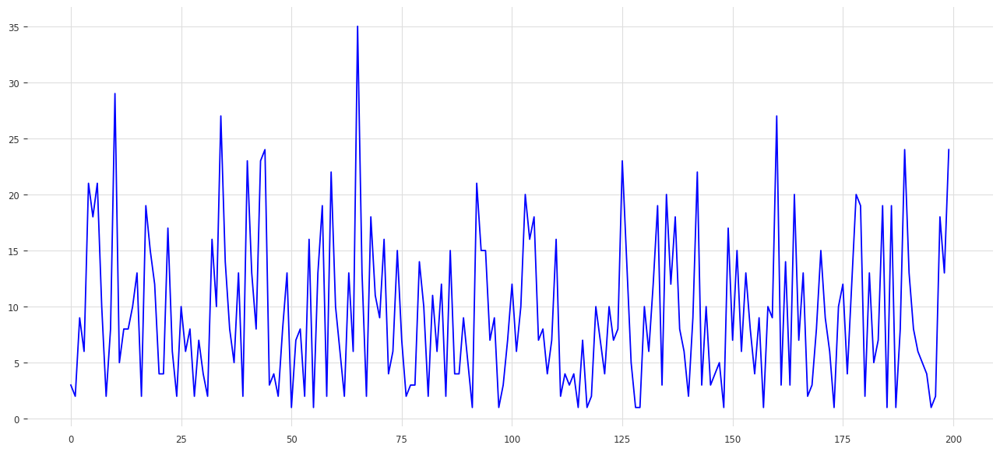

In [76]:
# from darts.metrics import smape
def smape(y_true, y_pred):
    numerator = np.abs(y_pred - y_true)
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    return 100 * np.mean(numerator / denominator)

Totaltime = []

# Define os teus parâmetros de Sliding Window
train_frac = 0.8
val_frac = 0.1
test_frac = 0.1

# Sliding window com treino, validação e teste corrigido
def sliding_window_cv(ts, model_params, scaler, n_folds=10):
    total_len = len(ts)
    fold_size = total_len // n_folds  # tamanho de cada segmento (10% do total)

    fold_results = []

    plt.figure(figsize=(16, 7))
    plt.plot(ts.time_index, ts.values(), label="Série Completa", color="blue")

    cores = {'train': '#d0f0c0', 'val': '#f0e68c', 'test': '#f4a460'}

    start_time_total = time.time()

    for fold in range(n_folds):
        fold_start = fold * fold_size
        fold_end = fold_start + fold_size

        # Extrair o segmento da série para este fold
        segment_ts = ts[fold_start:fold_end]

        # Definir os tamanhos para train, val e test dentro do segmento
        segment_len = len(segment_ts)
        train_size = int(train_frac * segment_len)
        val_size_ = int(val_frac * segment_len)
        test_size = segment_len - train_size - val_size_  # garante que dá tudo

        # Definir os índices dentro do segmento
        train_ts = segment_ts[:train_size]
        val_ts = segment_ts[train_size:train_size + val_size_]
        test_ts = segment_ts[train_size + val_size_:]

        print(f"\n📦 Fold {fold+1}/{n_folds}")
        fold_start_time = time.time()

        # Normalização
        train_scaled = scaler.fit_transform(train_ts)
        val_scaled = scaler.transform(val_ts)
        test_scaled = scaler.transform(test_ts)

        # Callbacks
        loss_recorder = LossRecorder()
        early_stopper = EarlyStopping(monitor="val_loss", patience=5, min_delta=1e-5, mode="min")

        model_params_fold = model_params.copy()
        model_params_fold["pl_trainer_kwargs"] = {
            "callbacks": [early_stopper, loss_recorder],
            "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
            "val_check_interval": 1.0,
            "log_every_n_steps": 10,
        }

        model = TCNModel(**model_params_fold)

        # Treino com validação
        model.fit(train_scaled, val_series=val_scaled, verbose=False)

        # Previsão da validação
        pred_val = model.predict(len(val_scaled))

        # Preparar input para previsão do teste:
        # pegar os últimos input_chunk_length pontos da validação como input para prever o teste
        input_chunk_len = model_params["input_chunk_length"]

        # Nota: para evitar index error, garantimos que val_ts tem pelo menos input_chunk_len pontos
        if len(val_scaled) < input_chunk_len:
            raise ValueError(f"Validação demasiado pequena para o input_chunk_length ({input_chunk_len})")

        input_for_test = val_scaled[-input_chunk_len:]  # últimos pontos da validação

        # Previsão do teste, usando input_for_test como ponto de partida
        pred_test = model.predict(len(test_scaled), series=input_for_test)

        # Desnormalizar
        pred_val_denorm = scaler.inverse_transform(pred_val)
        val_denorm = scaler.inverse_transform(val_scaled)
        pred_test_denorm = scaler.inverse_transform(pred_test)
        test_denorm = scaler.inverse_transform(test_scaled)

        # Métricas
        smape_val = smape(np.array(val_denorm.values()), np.array(pred_val_denorm.values()))
        smape_test = smape(np.array(test_denorm.values()), np.array(pred_test_denorm.values()))
        val_loss = loss_recorder.val_losses[-1] if loss_recorder.val_losses else None

        fold_duration = time.time() - fold_start_time

        fold_results.append({
            "fold": fold + 1,
            "train_start": train_ts.time_index[0],
            "train_end": train_ts.time_index[-1],
            "val_start": val_ts.time_index[0],
            "val_end": val_ts.time_index[-1],
            "test_start": test_ts.time_index[0],
            "test_end": test_ts.time_index[-1],
            "val_loss": val_loss,
            "smape_val": smape_val,
            "smape_test": smape_test,
            "train_time_sec": fold_duration
        })

        # Plotar zonas
        plt.axvspan(train_ts.time_index[0], train_ts.time_index[-1], color=cores['train'], alpha=0.2, label='Treino' if fold == 0 else "")
        plt.axvspan(val_ts.time_index[0], val_ts.time_index[-1], color=cores['val'], alpha=0.2, label='Validação' if fold == 0 else "")
        plt.axvspan(test_ts.time_index[0], test_ts.time_index[-1], color=cores['test'], alpha=0.2, label='Teste' if fold == 0 else "")

        # Concatenar os time_index e os valores das previsões
        full_pred_index = pred_val_denorm.time_index.append(pred_test_denorm.time_index)
        full_pred_values = np.concatenate([pred_val_denorm.values(), pred_test_denorm.values()])

        # Plotar a linha contínua das previsões
        plt.plot(full_pred_index, full_pred_values, linestyle='--', linewidth=1.5, color='#f94449')

    total_duration = time.time() - start_time_total
    Totaltime.append(total_duration)
    print(f"\n🕒 Tempo total do fold {fold+1}: {total_duration:.2f} segundos")

    plt.title(f"Sliding Window Cross-Validatio (10 folds) - {serie.name}")
    plt.xlabel("Tempo")
    plt.ylabel("Valor")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

    return pd.DataFrame(fold_results)

### Executar sliding window CV ###

for idx, series in enumerate(df.columns, 1):
    # Apenas para a primeira série
    serie = df[series]
    print(f"\n📊 {idx}. Série selecionada: {serie.name}")
    ts = TimeSeries.from_values(serie.values.astype(np.float32))
    scaler = Scaler()

    # Parâmetros do modelo TCN atualizados
    model_params = {
        "input_chunk_length": 7,
        "output_chunk_length": 3,
        "num_filters": 32,
        "kernel_size": 3,
        "num_layers": 8,
        "dropout": 0.1,
        "batch_size": 32,
        "n_epochs": 150,
        "optimizer_kwargs": {"lr": 5e-4},
        "random_state": 42,
        "model_name": "modelo_tcn_cv",
        "work_dir": "modelos_pytorch",
        "force_reset": True,
        "save_checkpoints": False,
        "log_tensorboard": False,
        # 'pl_trainer_kwargs' será substituído dentro da função com os callbacks corretos
    }

    df_resultados = sliding_window_cv(ts, model_params, scaler, n_folds=10)

    # Mostrar resultados finais
    print("\n📈 Resultados por fold:")
    print(df_resultados)

    print(f"\n🕒 Tempo total de execução: {sum(Totaltime):.2f} segundos")

#### 3.3. Transformers

In [18]:
from pytorch_lightning.callbacks import Callback

# --- Callback para capturar a loss ---
class LossHistoryCallback(Callback):
    def __init__(self):
        self.train_loss = []
        self.val_loss = []

    def on_train_epoch_end(self, trainer, pl_module):
        loss = trainer.callback_metrics.get("train_loss")
        if loss is not None:
            self.train_loss.append(loss.item())

    def on_validation_epoch_end(self, trainer, pl_module):
        loss = trainer.callback_metrics.get("val_loss")
        if loss is not None:
            self.val_loss.append(loss.item())

##### 3.3.1. Otimização Bayesiana

In [19]:
# =========================
# Transformer + Optuna(TPE Bayesiana) + TS-CV + Métrica Híbrida + Gráficos por coluna
# =========================
import os, json, warnings
import numpy as np
from copy import deepcopy
from tqdm import tqdm
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler
from darts.models import TransformerModel
from darts.utils.likelihood_models import QuantileRegression
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import torch
import optuna

warnings.filterwarnings("ignore", category=UserWarning)

# ---------------- Configs da Otimização ----------------
N_TRIALS = 50          # Mais trials para explorar melhor o espaço de hiperparâmetros
N_SEEDS  = 5           # Avalia cada trial com várias seeds, reduzindo influência de inicializações aleatórias
N_FOLDS  = 5           # CV temporal (rolling splits), mais folds para métricas mais estáveis
MAX_EPOCHS_HPO = 20    # Mais epochs por trial, com early stopping para evitar overfitting
PATIENCE_HPO   = 6     # Um pouco mais paciente no early stopping durante HPO
MAX_EPOCHS_FINAL = 80  # Treino final com mais epochs para extrair o máximo do modelo
PATIENCE_FINAL   = 15  # Early stopping mais tolerante no treino final
QUANTILES = [0.1, 0.5, 0.9]  # Quantis usados no QR e na pinball

# --------- Métricas ---------
def mae(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    return float(np.mean(np.abs(y_true - y_pred)))

def pinball_loss(y, q_pred, q):
    # y e q_pred são arrays do mesmo shape
    e = y - q_pred
    return float(np.mean(np.maximum(q*e, (q-1)*e)))

def pinball_mean_across_quantiles(y, q_preds, quantiles):
    # q_preds: dict {q: array}
    losses = [pinball_loss(y, q_preds[q], q) for q in quantiles]
    return float(np.mean(losses))

def smape(y_true, y_pred):
    y_true, y_pred = np.array(y_true).reshape(-1), np.array(y_pred).reshape(-1)
    return float(np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred) + 1e-8)))

def crps(y_true, q_preds, quantiles):
    """
    CRPS aproximado via quantis.
    y_true: array (n,)
    q_preds: dict {q: array}
    quantiles: lista de quantis
    """
    y_true = np.array(y_true).reshape(-1)
    q_preds_arr = np.stack([q_preds[q] for q in quantiles], axis=1)  # shape (n, n_quantiles)
    crps_vals = np.mean([np.mean((q_preds_arr[:, i] < y_true) - (quantiles[i]))**2 for i in range(len(quantiles))])
    return float(crps_vals)

# --------- Helpers ---------
def walk_forward_point(model, hist_series, future_len, step=1):
    preds = []
    ctx = hist_series
    left = future_len
    while left > 0:
        n = min(step, left)
        p = model.predict(n=n, series=ctx)
        preds.append(p)
        ctx = ctx.append(p)
        left -= n
    out = preds[0]
    for k in range(1, len(preds)):
        out = out.append(preds[k])
    return out

def walk_forward_quantiles(model, hist_series, future_len, step=1, quantiles=(0.1,0.5,0.9)):
    # devolve dict {q: TimeSeries}
    q_series = {q: None for q in quantiles}
    ctx = hist_series
    left = future_len
    first_block = True
    while left > 0:
        n = min(step, left)
        block = model.predict_quantiles(n=n, series=ctx, quantiles=list(quantiles))
        # block é lista de TimeSeries (uma por quantil, mesma ordem)
        for q, ts in zip(quantiles, block):
            q_series[q] = ts if first_block else q_series[q].append(ts)
        ctx = ctx.append(block[quantiles.index(0.5)])  # usa mediana como feed-forward
        left -= n
        first_block = False
    return q_series

def build_model(params, n_epochs, callbacks, logger=None):
    return TransformerModel(
        input_chunk_length=params["in_chunk"],
        output_chunk_length=params["out_chunk"],
        d_model=params["d_model"],
        nhead=params["nhead"],
        num_encoder_layers=params["enc_layers"],
        num_decoder_layers=params["dec_layers"],
        dim_feedforward=params["ff_dim"],
        dropout=params["dropout"],
        activation="relu",
        batch_size=params["batch_size"],
        n_epochs=n_epochs,
        model_name="tuned_transformer",
        likelihood=QuantileRegression(quantiles=QUANTILES),
        optimizer_kwargs={"lr": params["lr"], "weight_decay": params["weight_decay"]},
        random_state=params["seed"],
        save_checkpoints=False,
        force_reset=True,
        pl_trainer_kwargs={
            "callbacks": callbacks,
            "accelerator": "gpu" if torch.cuda.is_available() else "cpu",
            "logger": logger,
            "log_every_n_steps": 10
        },
    )

def ts_folds(series_norm, n_folds=3, train_ratio=0.8):
    """Gera folds rolling-origin dentro do subset (train+val)."""
    full_len = len(series_norm)
    split_main, rest = series_norm.split_before(train_ratio)
    # vamos usar percentagens do 'rest' para fazer vários cortes crescentes
    folds = []
    for i in range(1, n_folds+1):
        frac = i / (n_folds + 1)  # 1/4, 2/4, 3/4 por ex.
        # treino = split_main + primeira frac de 'rest'
        r_train, r_val = rest.split_before(frac)
        train_fold = split_main.append(r_train) if len(r_train) > 0 else split_main
        # validação = um pedaço seguinte do 'rest'
        val_fold, _ = r_val.split_before(0.5) if len(r_val) > 1 else (r_val, r_val)
        if len(train_fold) > 10 and len(val_fold) > 3:
            folds.append((train_fold, val_fold))
    if not folds:
        # fallback: 1 fold simples 80/20
        train_fold, val_fold = series_norm.split_before(0.8)
        folds = [(train_fold, val_fold)]
    return folds

def evaluate_params(params, serie_norm, scaler, n_folds=3, n_seeds=1,
                    max_epochs=12, patience=4):
    folds = ts_folds(serie_norm, n_folds=n_folds, train_ratio=0.8)
    scores = []
    for seed in range(n_seeds):
        params = {**params, "seed": params.get("seed", 1) + seed}
        for (train, val) in folds:
            early = EarlyStopping(monitor="train_loss", patience=patience, min_delta=1e-4, mode="min")
            lrmon = LearningRateMonitor(logging_interval="epoch")
            logger = TensorBoardLogger("lightning_logs", name="hpo_trial")
            model = build_model(params, n_epochs=max_epochs, callbacks=[early, lrmon], logger=logger)
            model.fit(train, val_series=val, verbose=False)

            step = params["out_chunk"]
            pred_val_point = walk_forward_point(model, train, future_len=len(val), step=step)
            q_pred_series   = walk_forward_quantiles(model, train, future_len=len(val), step=step, quantiles=QUANTILES)

            # Desnormalizar
            y_true = scaler.inverse_transform(val).values().reshape(-1)
            y_pred = scaler.inverse_transform(pred_val_point).values().reshape(-1)
            q_preds = {q: scaler.inverse_transform(q_pred_series[q]).values().reshape(-1) for q in QUANTILES}

            # Métrica híbrida: 0.5*sMAPE + 0.3*Pinball + 0.2*CRPS
            score_s = smape(y_true, y_pred)
            score_p = pinball_mean_across_quantiles(y_true, q_preds, QUANTILES)
            score_c = crps(y_true, q_preds, QUANTILES)
            score = 0.5 * score_s + 0.3 * score_p + 0.2 * score_c
            scores.append(score)
    return float(np.mean(scores)) if scores else 1e9

# ---------- Diretório ----------
dir_best_params = "best_params"
os.makedirs(dir_best_params, exist_ok=True)
os.makedirs("optuna_studies", exist_ok=True)

# ---------- Iterar colunas ----------
for col in tqdm(df.columns, desc="Processando colunas"):
    param_file = f"{dir_best_params}/{col}.json"
    graph_file = f"{dir_best_params}/{col}.png"
    if os.path.exists(param_file):
        continue  # já existe; salta para manter só tqdm

    # --- Preparar série ---
    serie = TimeSeries.from_values(df[col].values.astype(float))
    scaler = Scaler()
    serie_norm = scaler.fit_transform(serie)

    # limites dinâmicos
    # vamos estimar base usando split simples para obter comprimentos
    train_tmp, restante_tmp = serie_norm.split_before(0.8)
    val_tmp, test_tmp = restante_tmp.split_before(3/4)
    min_len = min(len(train_tmp), len(val_tmp), len(test_tmp))
    base_input  = max(10, min(100, min_len // 2))
    base_output = max(3,  min(30,  min_len // 4))

    # --- Optuna (Bayesiana via TPE) com storage para retomar ---
    storage = f"sqlite:///optuna_studies/{col}.db"
    study_name = f"study_{col}"
    try:
        study = optuna.load_study(study_name=study_name, storage=storage)
    except KeyError:
        sampler = optuna.samplers.TPESampler(seed=42, multivariate=True, group=True, n_startup_trials=10)
        pruner  = optuna.pruners.MedianPruner(n_startup_trials=8, n_warmup_steps=0)
        study   = optuna.create_study(direction="minimize", sampler=sampler, pruner=pruner,
                                      study_name=study_name, storage=storage, load_if_exists=True)

    def objective(trial):
        # search space coerente
        in_chunk  = trial.suggest_int("in_chunk", max(8, base_input//2), base_input)
        out_hi    = min(base_output, max(3, in_chunk // 2))
        out_chunk = trial.suggest_int("out_chunk", 3, max(3, out_hi))
        d_model   = trial.suggest_categorical("d_model", [64, 96, 128, 160])
        nhead     = trial.suggest_categorical("nhead", [4, 8])
        enc_layers= trial.suggest_int("enc_layers", 3, 6)
        dec_layers= trial.suggest_int("dec_layers", 3, 6)
        ff_dim    = trial.suggest_categorical("ff_dim", [128, 256, 384, 512])
        dropout   = trial.suggest_float("dropout", 0.05, 0.35)
        batch     = trial.suggest_categorical("batch_size", [16, 32])
        lr        = trial.suggest_float("lr", 5e-5, 5e-3, log=True)
        wd        = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
        seed0     = trial.suggest_int("seed", 1, 9999)

        params = {
            "in_chunk": in_chunk, "out_chunk": out_chunk, "d_model": d_model, "nhead": nhead,
            "enc_layers": enc_layers, "dec_layers": dec_layers, "ff_dim": ff_dim,
            "dropout": dropout, "batch_size": batch, "lr": lr, "weight_decay": wd, "seed": seed0,
        }

        try:
            score = evaluate_params(params, serie_norm, scaler,
                                    n_folds=N_FOLDS, n_seeds=N_SEEDS,
                                    max_epochs=MAX_EPOCHS_HPO, patience=PATIENCE_HPO)
        except Exception:
            score = 1e9
        return score

    study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=False, gc_after_trial=True)

    best_params = deepcopy({
        **study.best_params,
        # cast explícito (optuna pode devolver numpy types)
        "in_chunk": int(study.best_params["in_chunk"]),
        "out_chunk": int(study.best_params["out_chunk"]),
        "d_model": int(study.best_params["d_model"]),
        "nhead": int(study.best_params["nhead"]),
        "enc_layers": int(study.best_params["enc_layers"]),
        "dec_layers": int(study.best_params["dec_layers"]),
        "ff_dim": int(study.best_params["ff_dim"]),
        "batch_size": int(study.best_params["batch_size"]),
        "seed": int(study.best_params["seed"]),
        "dropout": float(study.best_params["dropout"]),
        "lr": float(study.best_params["lr"]),
        "weight_decay": float(study.best_params["weight_decay"]),
    })

    # Guardar parâmetros no diretório esperado
    with open(param_file, "w") as f:
        json.dump(best_params, f, indent=4)

    # --------- Treino final ---------
    final_logger = TensorBoardLogger("lightning_logs", name=f"final_{col}")
    final_callbacks = [
        EarlyStopping(monitor="train_loss", patience=PATIENCE_FINAL, min_delta=1e-4, mode="min"),
        LearningRateMonitor(logging_interval="epoch")
    ]
    final_model = build_model(best_params, n_epochs=MAX_EPOCHS_FINAL, callbacks=final_callbacks, logger=final_logger)

    # Usa o mesmo split para gerar gráficos comparáveis
    train, restante = serie_norm.split_before(0.8)
    val, test = restante.split_before(3/4)
    train_plus_val = train.append(val)
    final_model.fit(train_plus_val, val_series=None, verbose=False)

    # --- Walk-forward Forecast ---
    step = best_params["out_chunk"]
    # Validação: usa apenas o treino
    pred_val_final  = walk_forward_point(final_model, train, future_len=len(val), step=step)
    # Teste: usa treino + validação
    pred_test_final = walk_forward_point(final_model, train_plus_val, future_len=len(test), step=step)


    # Desnormalizar
    pred_val_den   = scaler.inverse_transform(pred_val_final)
    pred_test_den  = scaler.inverse_transform(pred_test_final)
    train_den      = scaler.inverse_transform(train)
    val_den        = scaler.inverse_transform(val)
    test_den       = scaler.inverse_transform(test)
    serie_den      = scaler.inverse_transform(serie_norm)

    # --- Gráfico ---
    plt.figure(figsize=(14,6))
    cores = {'train':'#d0f0c0','val':'#f0e68c','test':'#f4a460','forecast_val':'#2ca02c','forecast_test':'#d62728'}
    serie_den.plot(label="Série Real", color="blue")
    plt.axvspan(train_den.time_index[0], train_den.time_index[-1], color=cores['train'], alpha=0.3, label="Treino")
    plt.axvspan(val_den.time_index[0],   val_den.time_index[-1],   color=cores['val'],   alpha=0.3, label="Val")
    plt.axvspan(test_den.time_index[0],  test_den.time_index[-1],  color=cores['test'],  alpha=0.3, label="Teste")
    plt.plot(pred_val_den.time_index,  pred_val_den.values(),  '--', color=cores['forecast_val'],  label="Forecast Val")
    plt.plot(pred_test_den.time_index, pred_test_den.values(), '--', color=cores['forecast_test'], label="Forecast Test")
    plt.title(f"{col} — Série + Forecast (Optuna TPE · {N_FOLDS} folds · {N_SEEDS} seeds)")
    plt.xlabel("Tempo"); plt.ylabel("Valor")
    plt.legend(); plt.grid(True, linestyle="--", alpha=0.3); plt.tight_layout()
    plt.savefig(graph_file)
    plt.close()

Processando colunas: 100%|██████████| 7/7 [00:00<00:00, 4632.40it/s]


##### 3.3.2. Visualizar Resultados 

In [13]:
# ---------------- Escolher a variável ----------------
visualizar_apostas = "N1"  # ou outra coluna do df
if visualizar_apostas not in df.columns:
    raise ValueError(f"Coluna '{visualizar_apostas}' não encontrada no DataFrame.")

# ---------- Carregar hiperparâmetros ----------
param_file = f"{dir_best_params}/{visualizar_apostas}.json"
with open(param_file, "r") as f:
    best_params = json.load(f)

print("🏆 Melhores hiperparâmetros (validação MAE):")
for k, v in best_params.items():
    print(f"{k}: {v}")

🏆 Melhores hiperparâmetros (validação MAE):
in_chunk: 9
out_chunk: 3
d_model: 64
nhead: 4
enc_layers: 6
dec_layers: 5
ff_dim: 384
dropout: 0.11370173320348284
batch_size: 32
lr: 0.00020298058052421552
weight_decay: 3.752055855124284e-05
seed: 4320


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                | Type                | Params | Mode 
--------------------------------------------------------------------
0 | criterion           | MSELoss             | 0      | train
1 | train_criterion     | MSELoss             | 0      | train
2 | val_criterion       | MSELoss             | 0      | train
3 | train_metrics       | MetricCollection    | 0      | train
4 | val_metrics         | MetricCollection    | 0      | train
5 | encoder             | Linear              | 128    | train
6 | positional_encoding | _PositionalEncoding | 0      | train
7 | transformer         | Transformer         | 815 K  | train
8 | decoder             | Linear              | 585    | train
--------------------------------------------------------------------
816 K     Trainable params
0         Non-trainable params
816 K     Total

Epoch 41: 100%|██████████| 6/6 [00:00<00:00, 17.49it/s, v_num=0, train_loss=0.177, val_loss=0.143]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 63.91it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 64.38it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 57.02it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 54.80it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 61.26it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 57.69it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 61.68it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 54.73it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.42it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 59.42it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 60.94it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 62.74it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 46.43it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 41.77it/s]


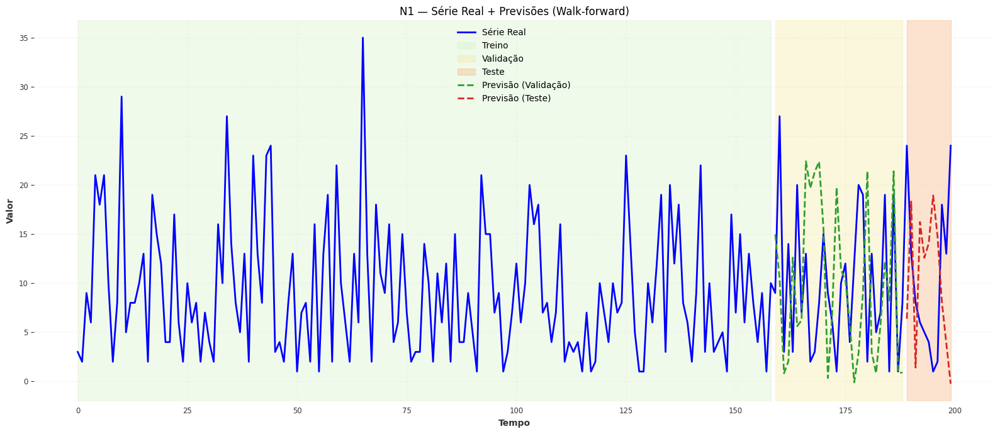

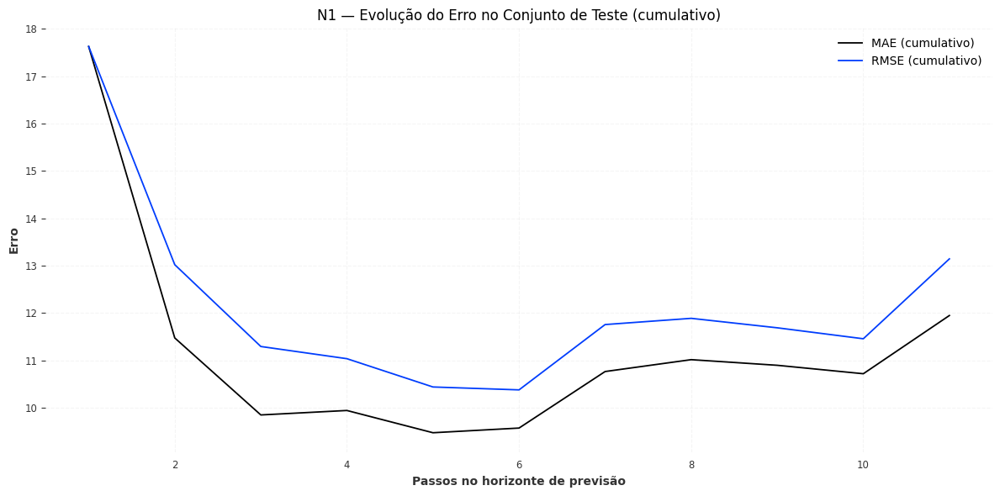

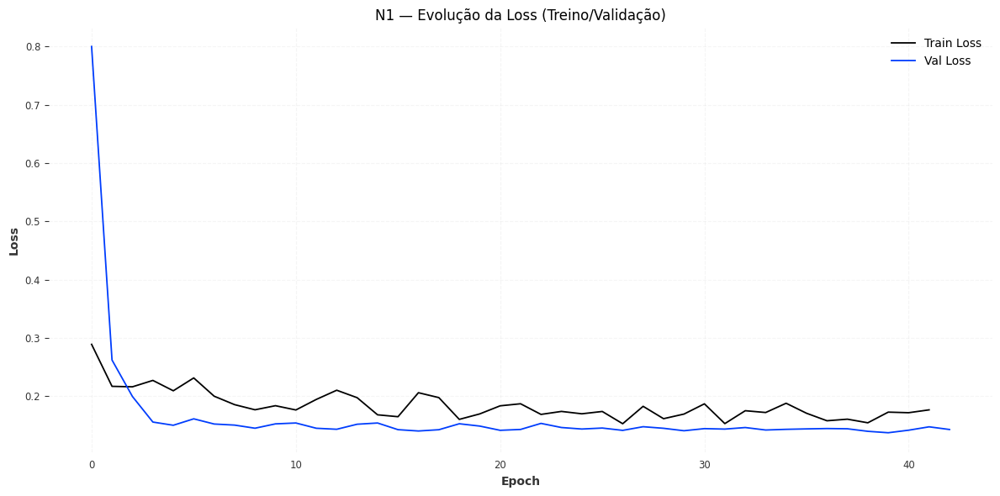

In [21]:
# --- Preparar série ---
serie = TimeSeries.from_values(df[visualizar_apostas].values.astype(float))
scaler = Scaler()
serie_norm = scaler.fit_transform(serie)

train, restante = serie_norm.split_before(0.8)
val, test = restante.split_before(3/4)
train_plus_val = train.append(val)

# --- Criar modelo com os pesos do JSON e callback de loss ---
loss_hist = LossHistoryCallback()
logger = None  # Não necessário aqui, mas podes manter TensorBoard se quiseres
final_callbacks = [
    EarlyStopping(monitor="train_loss", patience=PATIENCE_FINAL, min_delta=1e-4, mode="min"),
    LearningRateMonitor(logging_interval="epoch"),
    loss_hist
]

final_model = build_model(best_params, n_epochs=MAX_EPOCHS_FINAL, callbacks=final_callbacks, logger=logger)
final_model.fit(train_plus_val, val_series=val, verbose=True)

# --- Walk-forward Forecast ---
step = best_params["out_chunk"]
pred_val_final  = walk_forward_point(final_model, train, future_len=len(val), step=step)
pred_test_final = walk_forward_point(final_model, train_plus_val, future_len=len(test), step=step)

# --- Desnormalizar ---
train_den = scaler.inverse_transform(train)
val_den   = scaler.inverse_transform(val)
test_den  = scaler.inverse_transform(test)
pred_val_den  = scaler.inverse_transform(pred_val_final)
pred_test_den = scaler.inverse_transform(pred_test_final)
serie_den = scaler.inverse_transform(serie_norm)

# --- 1️⃣ Série + Previsões ---
plt.figure(figsize=(16, 7))
cores = {'train': '#d0f0c0', 'val': '#f0e68c', 'test': '#f4a460',
         'forecast_val': '#2ca02c', 'forecast_test': '#d62728'}

serie_den.plot(label="Série Real", color="blue")
plt.axvspan(train_den.time_index[0], train_den.time_index[-1], color=cores['train'], alpha=0.3, label="Treino")
plt.axvspan(val_den.time_index[0], val_den.time_index[-1], color=cores['val'], alpha=0.3, label="Validação")
plt.axvspan(test_den.time_index[0], test_den.time_index[-1], color=cores['test'], alpha=0.3, label="Teste")

plt.plot(pred_val_den.time_index,  pred_val_den.values(),  linestyle="--", linewidth=2,
         color=cores['forecast_val'], label="Previsão (Validação)")
plt.plot(pred_test_den.time_index, pred_test_den.values(), linestyle="--", linewidth=2,
         color=cores['forecast_test'], label="Previsão (Teste)")

plt.title(f"{visualizar_apostas} — Série Real + Previsões (Walk-forward)")
plt.xlabel("Tempo"); plt.ylabel("Valor")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout(); plt.show()

# --- 2️⃣ Evolução do erro cumulativo no TESTE ---
y_true_test = test_den.values().flatten()
y_pred_test = pred_test_den.values().flatten()

mae_evo  = [np.mean(np.abs(y_true_test[:i] - y_pred_test[:i])) for i in range(1, len(y_true_test)+1)]
rmse_evo = [np.sqrt(np.mean((y_true_test[:i] - y_pred_test[:i])**2)) for i in range(1, len(y_true_test)+1)]

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(mae_evo)+1),  mae_evo,  label="MAE (cumulativo)")
plt.plot(range(1, len(rmse_evo)+1), rmse_evo, label="RMSE (cumulativo)")
plt.title(f"{visualizar_apostas} — Evolução do Erro no Conjunto de Teste (cumulativo)")
plt.xlabel("Passos no horizonte de previsão")
plt.ylabel("Erro")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout(); plt.show()

# --- 3️⃣ Evolução da Loss por Epoch ---
plt.figure(figsize=(12,6))
if loss_hist.train_loss:
    plt.plot(loss_hist.train_loss, label="Train Loss")
if loss_hist.val_loss:
    plt.plot(loss_hist.val_loss, label="Val Loss")

plt.title(f"{visualizar_apostas} — Evolução da Loss (Treino/Validação)")
plt.xlabel("Epoch"); plt.ylabel("Loss")
plt.legend(); plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout(); plt.show()


##### 3.3.3. Forecast

In [21]:
# ---------- Diretório de saída ----------
forecast_dir = "forecast"
os.makedirs(forecast_dir, exist_ok=True)

# ---------- Configurações ----------
forecast_quantiles = [0.1, 0.5, 0.9]   # quantis usados no treino
forecast_horizon = 5                   # número de chaves a prever
forecast_result = {col: [] for col in df.columns}  # guardar previsões

# ===============================================================
# 🔮 Forecast para cada coluna (Números e Estrelas)
# ===============================================================
for col in df.columns:
    # ----- Carregar melhores parâmetros do modelo -----
    with open(f"{dir_best_params}/{col}.json", "r") as f:
        best_params = json.load(f)

    # ----- Preparar série temporal -----
    serie_total = TimeSeries.from_values(df[col].values.astype(float))
    scaler_total = Scaler()
    serie_norm_total = scaler_total.fit_transform(serie_total)

    # ----- Definir modelo Transformer -----
    final_model = TransformerModel(
        input_chunk_length=best_params["in_chunk"],
        output_chunk_length=1,
        d_model=best_params["d_model"],
        nhead=best_params["nhead"],
        num_encoder_layers=best_params["enc_layers"],
        num_decoder_layers=best_params["dec_layers"],
        dim_feedforward=best_params["ff_dim"],
        dropout=best_params["dropout"],
        batch_size=best_params["batch_size"],
        n_epochs=50,
        model_name=f"forecast_{col}",
        likelihood=QuantileRegression(quantiles=forecast_quantiles),
        optimizer_kwargs={"lr": best_params["lr"], "weight_decay": best_params["weight_decay"]},
        random_state=best_params["seed"],
        save_checkpoints=False,
        force_reset=True,
        pl_trainer_kwargs={"accelerator": "gpu" if torch.cuda.is_available() else "cpu"}
    )

    # ----- Treinar no dataset completo -----
    final_model.fit(serie_norm_total, val_series=None, verbose=False)

    # ----- Forecast step-by-step (multi-horizonte) -----
    ctx = serie_norm_total
    for _ in range(forecast_horizon):
        # Previsão do próximo valor
        preds = final_model.predict(n=1, series=ctx, num_samples=100)
        preds_den = scaler_total.inverse_transform(preds).all_values().flatten()
        median_pred = int(np.round(np.quantile(preds_den, 0.5)))
        forecast_result[col].append(median_pred)

        # Atualizar contexto com o novo valor previsto
        last_time = ctx.end_time()
        new_index = pd.RangeIndex(start=last_time + 1, stop=last_time + 2)
        new_point = TimeSeries.from_times_and_values(
            times=new_index,
            values=[[median_pred]]
        )
        ctx = ctx.append(new_point)

    # ----- Guardar gráfico -----
    plt.figure(figsize=(10, 4))
    # Série histórica
    plt.plot(
        serie_total.time_index,
        serie_total.values().flatten(),
        label="Histórico",
        color="blue"
    )
    # Índice contínuo para o forecast (começa logo após o último histórico)
    forecast_index = range(len(serie_total) - 1, len(serie_total) + forecast_horizon)
    forecast_vals = [serie_total.values()[-1, 0]] + forecast_result[col]

    # Forecast colado ao histórico
    plt.plot(
        forecast_index,
        forecast_vals,
        label="Forecast",
        color="red",
        linestyle="--"
    )
    plt.title(f"Forecast para {col}")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{forecast_dir}/forecast_{col}.png", dpi=150)
    plt.close()


# ===============================================================
# 📝 Mostrar as chaves previstas
# ===============================================================
for k in range(forecast_horizon):
    numeros = [forecast_result[f"N{i}"][k] for i in range(1, 6)]
    estrelas = [forecast_result[f"E{i}"][k] for i in range(1, 2+1)]
    print(f"\n🔮 Chave {k+1} prevista para o próximo Euromilhões:")
    print("Números:", numeros)
    print("Estrelas:", estrelas)


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.16it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.97it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.59it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.10it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.55it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.31it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.78it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.76it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00, 10.00it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.88it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.46it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.12it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.20it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.36it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.26it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.93it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.70it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.25it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.97it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.26it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.92it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.84it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]

GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.09it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.34it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.11it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.43it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.48it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.65it/s]

🔮 Chave 1 prevista para o próximo Euromilhões:
Números: [7, 16, 27, 35, 44]
Estrelas: [4, 9]

🔮 Chave 2 prevista para o próximo Euromilhões:
Números: [10, 21, 30, 42, 47]
Estrelas: [5, 10]

🔮 Chave 3 prevista para o próximo Euromilhões:
Números: [9, 20, 29, 41, 46]
Estrelas: [5, 10]

🔮 Chave 4 prevista para o próximo Euromilhões:
Números: [9, 20, 30, 42, 46]
Estrelas: [5, 10]

🔮 Chave 5 prevista para o próximo Euromilhões:
Números: [8, 18, 28, 41, 45]
Estrelas: [4, 9]


In [25]:
from collections import Counter

# ===============================================================
# 🔮 Forecast Euromilhões com Transformer + Simulação Probabilística
# ===============================================================

# ---------- Diretório de saída ----------
forecast_dir = "forecast"
os.makedirs(forecast_dir, exist_ok=True)

# ---------- Configurações ----------
forecast_quantiles = [0.1, 0.5, 0.9]   # quantis para incerteza
forecast_horizon = 5                   # passos futuros (número de chaves)
num_samples = 1000                     # amostras por previsão
simulation_runs = 2000                 # simulações de chaves completas

# Guardar amostras brutas para cada coluna
forecast_samples = {col: [] for col in df.columns}


# ===============================================================
# 🔧 Funções auxiliares
# ===============================================================
def probs_from_samples(samples, min_val, max_val):
    """
    Converte amostras contínuas em distribuição discreta normalizada.
    """
    ints = np.clip(np.round(samples).astype(int), min_val, max_val)
    vals = np.arange(min_val, max_val + 1)
    counts = np.array([(ints == v).sum() for v in vals], dtype=float)
    probs = counts / counts.sum() if counts.sum() > 0 else np.ones_like(counts) / len(counts)
    return vals, probs


def weighted_sample_wo_replacement(values, probs, k):
    """
    Sorteio ponderado sem reposição.
    """
    vals = list(values)
    p = probs.astype(float).copy()
    for _ in range(k):
        p = p / p.sum()
        i = np.random.choice(len(vals), p=p)
        yield vals.pop(i)
        p = np.delete(p, i)


def simulate_keys(number_probs, star_probs, n_numbers=5, n_stars=2, n_sims=2000):
    """
    Gera n_sims chaves (5 números + 2 estrelas) com base em distribuições marginais.
    Retorna as chaves mais frequentes.
    """
    counter = Counter()
    for _ in range(n_sims):
        nums = tuple(sorted(weighted_sample_wo_replacement(*number_probs, n_numbers)))
        stars = tuple(sorted(weighted_sample_wo_replacement(*star_probs, n_stars)))
        counter[(nums, stars)] += 1
    return counter.most_common(5)  # devolve o TOP-5


# ===============================================================
# 🔮 Forecast probabilístico para cada coluna
# ===============================================================
for col in df.columns:
    # ----- Carregar melhores parâmetros -----
    with open(f"{dir_best_params}/{col}.json", "r") as f:
        best_params = json.load(f)

    # ----- Preparar série histórica -----
    serie_total = TimeSeries.from_values(df[col].values.astype(float))
    scaler = Scaler()
    serie_norm = scaler.fit_transform(serie_total)

    # ----- Definir modelo Transformer -----
    model = TransformerModel(
        input_chunk_length=best_params["in_chunk"],
        output_chunk_length=1,
        d_model=best_params["d_model"],
        nhead=best_params["nhead"],
        num_encoder_layers=best_params["enc_layers"],
        num_decoder_layers=best_params["dec_layers"],
        dim_feedforward=best_params["ff_dim"],
        dropout=best_params["dropout"],
        batch_size=best_params["batch_size"],
        n_epochs=50,
        model_name=f"forecast_{col}",
        likelihood=QuantileRegression(quantiles=forecast_quantiles),
        optimizer_kwargs={"lr": best_params["lr"], "weight_decay": best_params["weight_decay"]},
        random_state=best_params["seed"],
        save_checkpoints=False,
        force_reset=True,
        pl_trainer_kwargs={"accelerator": "gpu" if torch.cuda.is_available() else "cpu"}
    )

    # ----- Treinar no dataset completo -----
    model.fit(serie_norm, val_series=None, verbose=False)

    # ----- Forecast step-by-step (com amostras) -----
    ctx = serie_norm
    future_median = []
    future_p10 = []
    future_p90 = []

    for _ in range(forecast_horizon):
        preds = model.predict(n=1, series=ctx, num_samples=num_samples)

        # Inverter normalização
        preds_den = scaler.inverse_transform(preds).all_values().flatten()

        # Guardar TODAS as amostras
        forecast_samples[col].extend(preds_den)

        # Estatísticas para visualização
        future_median.append(np.median(preds_den))
        future_p10.append(np.quantile(preds_den, 0.1))
        future_p90.append(np.quantile(preds_den, 0.9))

        # Atualizar contexto com valor mediano (para continuar a cadeia)
        median_pred = int(np.round(np.median(preds_den)))
        last_time = ctx.end_time()
        new_index = pd.RangeIndex(start=last_time + 1, stop=last_time + 2)
        new_point = TimeSeries.from_times_and_values(times=new_index, values=[[median_pred]])
        ctx = ctx.append(new_point)

    # ----- Guardar gráfico temporal -----
    plt.figure(figsize=(10, 4))
    # Série histórica
    plt.plot(
        serie_total.time_index,
        serie_total.values().flatten(),
        label="Histórico",
        color="blue"
    )
    # Forecast (linha vermelha)
    forecast_index = range(len(serie_total), len(serie_total) + forecast_horizon)
    plt.plot(forecast_index, future_median, label="Forecast (mediana)", color="red")
    # Banda de incerteza
    plt.fill_between(
        forecast_index,
        future_p10,
        future_p90,
        color="red",
        alpha=0.2,
        label="Incerteza [10%–90%]"
    )
    plt.title(f"Forecast probabilístico para {col}")
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"{forecast_dir}/forecast_{col}.png", dpi=150)
    plt.close()

    # ----- Guardar gráfico de probabilidade (barplot) -----
    if col.startswith("N"):
        min_val, max_val = 1, 50
        color = "blue"
    else:
        min_val, max_val = 1, 12
        color = "orange"

    vals, probs = probs_from_samples(np.array(forecast_samples[col]), min_val, max_val)

    plt.figure(figsize=(10, 4))
    bars = plt.bar(vals, probs, color=color, alpha=0.7)

    # Colocar os valores em cima de cada barra com fundo cinzento e texto em negrito
    for bar, val in zip(bars, vals):
        height = bar.get_height()
        if height > 0:  # só escreve se tiver probabilidade > 0
            plt.text(
                bar.get_x() + bar.get_width() / 2,
                height + 0.005,  # um pouco acima da barra
                str(val),
                ha="center",
                va="bottom",
                fontsize=8,
                fontweight="bold",
                rotation=90,
                bbox=dict(facecolor='lightgrey', edgecolor='none', pad=1)  # fundo cinzento
            )

    plt.title(f"Distribuição prevista para {col}")
    plt.xlabel("Valor")
    plt.ylabel("Probabilidade")
    plt.tight_layout()
    plt.savefig(f"{forecast_dir}/prob_{col}.png", dpi=150)
    plt.close()

# ===============================================================
# 📝 Simulação de chaves completas
# ===============================================================
# Juntar amostras de números e estrelas
number_cols = [c for c in df.columns if c.startswith("N")]
star_cols = [c for c in df.columns if c.startswith("E")]

all_num_samples = np.concatenate([forecast_samples[c] for c in number_cols])
all_star_samples = np.concatenate([forecast_samples[c] for c in star_cols])

number_probs = probs_from_samples(all_num_samples, 1, 50)
star_probs = probs_from_samples(all_star_samples, 1, 12)

top_keys = simulate_keys(number_probs, star_probs, n_sims=simulation_runs)

# ===============================================================
# 📝 Mostrar resultados finais por coluna (3 valores mais prováveis)
# ===============================================================
top_values_per_col = {}

for col in df.columns:
    vals, probs = probs_from_samples(np.array(forecast_samples[col]),
                                     1 if col.startswith("N") else 1,
                                     50 if col.startswith("N") else 12)
    # Ordenar do mais provável para o menos
    sorted_idx = np.argsort(probs)[::-1]
    top_vals = [(vals[i], probs[i]) for i in sorted_idx[:3]]
    top_values_per_col[col] = top_vals

    print(f"\nColuna {col} — 3 valores mais prováveis:")
    for val, prob in top_vals:
        print(f"  Valor {val} — Probabilidade {prob*100:.1f}%")

# ===============================================================
# 📝 Criar e guardar as 3 chaves mais prováveis
# ===============================================================
keys = []
for k in range(3):
    numeros = [top_values_per_col[f"N{i}"][k][0] for i in range(1, 6)]
    estrelas = [top_values_per_col[f"E{i}"][k][0] for i in range(1, 3)]
    keys.append((numeros, estrelas))

# Guardar num ficheiro CSV
import csv
with open(f"{forecast_dir}/top_3_keys.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["Chave", "Números", "Estrelas"])
    for idx, (nums, stars) in enumerate(keys, 1):
        writer.writerow([idx, nums, stars])

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

Coluna N1 — 3 valores mais prováveis:
  Valor 2 — Probabilidade 13.3%
  Valor 21 — Probabilidade 10.7%
  Valor 3 — Probabilidade 6.7%

Coluna N2 — 3 valores mais prováveis:
  Valor 4 — Probabilidade 12.0%
  Valor 32 — Probabilidade 12.0%
  Valor 6 — Probabilidade 3.3%

Coluna N3 — 3 valores mais prováveis:
  Valor 39 — Probabilidade 7.0%
  Valor 40 — Probabilidade 6.5%
  Valor 11 — Probabilidade 6.2%

Coluna N4 — 3 valores mais prováveis:
  Valor 50 — Probabilidade 7.3%
  Valor 24 — Probabilidade 6.3%
  Valor 47 — Probabilidade 5.9%

Coluna N5 — 3 valores mais prováveis:
  Valor 50 — Probabilidade 24.4%
  Valor 32 — Probabilidade 11.2%
  Valor 47 — Probabilidade 6.7%

Coluna E1 — 3 valores mais prováveis:
  Valor 1 — Probabilidade 16.4%
  Valor 8 — Probabilidade 13.2%
  Valor 2 — Probabilidade 13.1%

Coluna E2 — 3 valores mais prováveis:
  Valor 12 — Probabilidade 21.4%
  Valor 10 — Probabilidade 13.1%
  Valor 5 —

# Nota: ver Dirichlet-multinomial distribution

- - -